<a href="https://colab.research.google.com/github/FilipposMoscholios/Sentiment-Change-Detection-on-Brand-Specific-Posts/blob/main/Sentiment_Change_Detection_using_CPD%26TM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Phase 1

## Import the Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns
from sklearn.model_selection import train_test_split
import datetime

## Import the Datasets

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
#gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# URL and way to get the id part of the file
link_dei = ""
link_elpe = ""
link_eurobank = ""
link_loreal = ""
link_nestle = ""
link_cosmote = ""
link_olympiaodos = ""
link_kotsovolos = ""

id1 = link_dei.split("/")[-2]
id2 = link_elpe.split("/")[-2]
id3 = link_eurobank.split("/")[-2]
id4 = link_loreal.split("/")[-2]
id5 = link_nestle.split("/")[-2]
id6 = link_cosmote.split("/")[-2]
id7 = link_olympiaodos.split("/")[-2]
id8 = link_kotsovolos.split("/")[-2]


downloaded1 = drive.CreateFile({'id':id1})
downloaded2 = drive.CreateFile({'id':id2})
downloaded3 = drive.CreateFile({'id':id3})
downloaded4 = drive.CreateFile({'id':id4})
downloaded5 = drive.CreateFile({'id':id5})
downloaded6 = drive.CreateFile({'id':id6})
downloaded7 = drive.CreateFile({'id':id7})
downloaded8 = drive.CreateFile({'id':id8})

downloaded1.GetContentFile('dei_dist.csv')
downloaded2.GetContentFile('elpe_dist.csv')
downloaded3.GetContentFile('eurobank_dist.csv')
downloaded4.GetContentFile('loreal_dist.csv')
downloaded5.GetContentFile('nestle_dist.csv')
downloaded6.GetContentFile('cosmote_dist.csv')
downloaded7.GetContentFile('olympia_dist.csv')
downloaded8.GetContentFile('kotsovolos_dist.csv')


In [ ]:
list_datasets = ['dei_dist.csv','elpe_dist.csv','eurobank_dist.csv','loreal_dist.csv','nestle_dist.csv','cosmote_dist.csv','olympia_dist.csv','kotsovolos_dist.csv']


In [ ]:

for i in list_datasets:
  if i == list_datasets[0]:
    df_dei = pd.read_csv(i)
  elif i == list_datasets[1]:
    df_elpe = pd.read_csv(i)
  elif i == list_datasets[2]:
    df_eurobank = pd.read_csv(i)
  elif i == list_datasets[3]:
    df_loreal = pd.read_csv(i)
  elif i == list_datasets[4]:
    df_nestle = pd.read_csv(i)
  elif i == list_datasets[5]:
    df_cosmote = pd.read_csv(i)
  elif i == list_datasets[6]:
    df_olympiaodos = pd.read_csv(i)
  elif i == list_datasets[7]:
    df_kotsovolos = pd.read_csv(i)


In [ ]:
df_dei = pd.read_csv('dei_dist.csv')

#### Concatenate All data from Social

In [ ]:
df_social = pd.concat([df_dei,df_elpe,df_eurobank,df_loreal,df_nestle,df_cosmote,df_olympiaodos,df_kotsovolos])

In [ ]:
df_social.channel.value_counts()

twitter      3635318
facebook      150551
instagram     132308
youtube        57245
Name: channel, dtype: int64

In [ ]:
#extract_sentiment_balance_foreach_channel('all datasets distribution', df_social,True)


#### Take a look for all datasets separately

In [ ]:
df_dei.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,"Στο Μικρολίμανο, ευχαριστούμε πολύ1",Διαγωνισμοί,neutral,Watt & Volt,facebook,2020-10-23 09:01:11,0,2020-10-23,Electrical_Energy
1,Τον θυμάστε τον Μηλιώνη που άλλαξε τα φώτα τη...,Χρεοκοπία,negative,ΔΕΗ,twitter,2021-03-31 16:27:53,-1,2021-03-31,Electrical_Energy
2,@AdalHarry @teleftheriadou Συνταξιούχος ΔΕΗ επ...,Εκπτώσεις,negative,ΔΕΗ,twitter,2021-01-25 09:10:20,-1,2021-01-25,Electrical_Energy
3,Κόλλησα τον λογαριασμό της ΔΕΗ στον τοίχο του...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2020-07-10 09:58:17,-1,2020-07-10,Electrical_Energy
4,"Η Πυροσβεστική Υπηρεσία βρίσκεται επί ποδός, ε...",Ατυχήματα,negative,ΔΕΗ,facebook,2019-03-22 10:43:40,-1,2019-03-22,Electrical_Energy


In [ ]:
df_elpe.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,Δέκα δωρεάν πτήσεις μεταφοράς ιατροφαρμακευτικ...,Πτήσεις μεταφοράς ιατροφαρμακευτικού υλικού,neutral,ΕΛΠΕ,twitter,2020-03-27 15:08:47,0,2020-03-27,Energy_&_Telecom
1,Το ελληνικό παιδικό χωριό στο φίλυρο θεσσαλονι...,5% έκπτωση ΠΘ,neutral,EKO,facebook,2020-11-27 00:00:00,0,2020-11-27,Energy_&_Telecom
2,MYTILINEOS: Δωρεά 65 ειδικών αναπνευστήρων για...,65 Αναπνευστήρες ΜΕΘ,neutral,ΜΥΤΙΛΗΝΑΙΟΣ,twitter,2020-03-26 08:44:02,0,2020-03-26,Energy_&_Telecom
3,Τα ΕΛΠΕ διαθέτουν πετρέλαιο θέρμανσης για το ...,Παιδικό Χωριό Φιλύρου,neutral,ΕΛΠΕ,twitter,2020-12-04 21:32:50,0,2020-12-04,Energy_&_Telecom
4,Δέκα πτήσεις μεταφοράς ιατροφαρμακευτικού υλι...,Πτήσεις μεταφοράς ιατροφαρμακευτικού υλικού,neutral,AEGEAN AIRLINES,twitter,2020-03-28 16:45:36,0,2020-03-28,Energy_&_Telecom


In [ ]:
df_eurobank.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,Τι έχετε μέσα στο μυαλό σας μερικοί; Εκμεταλλ...,NaN,negative,Σοφία Μπεκατώρου,twitter,2021-01-16 20:49:50,-1,2021-01-16,Economics
1,Γιατί μου φαίνεται υποκρισία η στάση όσων κρα...,NaN,neutral,Σοφία Μπεκατώρου,twitter,2021-01-18 18:26:51,0,2021-01-18,Economics
2,Η Μπεκατώρου κατόνομασε τον αντιπρόεδρο της Ισ...,NaN,neutral,Σοφία Μπεκατώρου,twitter,2021-01-16 13:38:42,0,2021-01-16,Economics
3,Η Ολυμπιονίκης Σοφία Μπεκατώρου κατήγγειλε ότ...,NaN,negative,Σοφία Μπεκατώρου,twitter,2021-01-16 11:06:55,-1,2021-01-16,Economics
4,Με αφορμή τις καταγγελίες της Σοφίας Μπεκατώρου,NaN,neutral,Σοφία Μπεκατώρου,twitter,2021-01-19 13:40:50,0,2021-01-19,Economics


In [ ]:
df_loreal.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,The ultimate beauty @dutchesss_ in peachy mono...,NaN,neutral,L'oreal Paris,instagram,2020-09-18 01:08:05,0,2020-09-18,Hygiene_&_Care_Products
1,The ultimate beauty @dutchesss_ in peachy mono...,NaN,positive,L'oreal Paris,instagram,2020-09-18 01:08:05,1,2020-09-18,Hygiene_&_Care_Products
2,"Σιγά φασιστομαλάκες, μου θέλετε και cancel, π...",NaN,positive,Campaign_Hair Has No Gender,twitter,2022-01-18 11:29:37,1,2022-01-18,Hygiene_&_Care_Products
3,Ένα από αυτά τα 5 παιδιά είναι το δικό μου. Τ...,NaN,positive,Campaign_Hair Has No Gender,twitter,2022-01-19 21:45:55,1,2022-01-19,Hygiene_&_Care_Products
4,"Σοκαρεστε και αντιδράτε με μια διαφήμιση, αλλ...",NaN,positive,Campaign_Hair Has No Gender,twitter,2022-01-18 19:32:43,1,2022-01-18,Hygiene_&_Care_Products


In [ ]:
df_nestle.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,Όταν η λαχτάρα είναι αμοιβαία! *Για ΙΟΝ αμυγδ...,Product Variety,positive,ION Chocolate,twitter,2022-03-10 15:02:44,1,2022-03-10,Food_&_Beverages
1,ΙΟΝ ΑΝΩΝΥΜΗ ΕΤΑΙΡΕΙΑ ΒΙΟΜΗΧΑΝΙΑΣ ΚΑΙ ΕΜΠΟΡΙΟΥ ...,Occassion: With,neutral,ION Chocolate,twitter,2022-02-14 11:26:26,0,2022-02-14,Food_&_Beverages
2,Αν θέλει κάποιος να μου πάρει την πολύ μεγάλη...,Product Variety,positive,ION Chocolate,twitter,2022-02-14 10:22:15,1,2022-02-14,Food_&_Beverages
3,Γυρνάω από το σουπερμάρκετ πολύ ησυχία λέω επ...,Occasion: Doing What,neutral,Merenda Hazelnut Spread,twitter,2022-03-21 17:39:20,0,2022-03-21,Food_&_Beverages
4,@mariagerogiann @Mysterywoman111 Έχουν και κοι...,Consumption,neutral,Lacta Chocolate,twitter,2022-02-26 14:52:42,0,2022-02-26,Food_&_Beverages


In [ ]:
df_cosmote.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,Τίτλοι τέλους πέφτουν το καλοκαίρι στη σχέση τ...,NaN,neutral,Wind Vision - NOVA TV,facebook,2022-02-02 15:20:00,0,2022-02-02,Technology_&_Telecom
1,WIND F2G η απεριόριστη ομιλία θα είναι για πάν...,NaN,neutral,F2G - Q,facebook,2022-02-07 18:06:00,0,2022-02-07,Technology_&_Telecom
2,@Juno57708567 Να πας cosmote με 17 ευρω 800 λε...,Products & Services,neutral,Cosmote Home,twitter,2022-02-04 07:09:02,0,2022-02-04,Technology_&_Telecom
3,Αποκλειστικός Γιαννίκης Οι τρεις εντός έδρας ή...,NaN,neutral,Wind Vision - NOVA TV,facebook,2022-02-01 22:00:00,0,2022-02-01,Technology_&_Telecom
4,"Ιδιωτικοποιησαν τον Οσε,δεν βρισκεις φθηνο ει...",Political Issues & Privatization,negative,Cosmote Home,twitter,2022-02-07 09:04:06,-1,2022-02-07,Technology_&_Telecom


In [ ]:
df_olympiaodos.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,Πολυ ευκολα συμφωνησε η διοικηση της Αττικης ...,NaN,negative,Attiki Odos,twitter,2022-01-25 14:35:10,-1,2022-01-25,Highways_&_Public_Works
1,"Τα 2.000€ δεν λέγονται αποζημίωση παιδιά, εξα...",NaN,negative,Attiki Odos,twitter,2022-01-25 12:11:01,-1,2022-01-25,Highways_&_Public_Works
2,Έπεσες απ' το ποδήλατο; ΛΟΚΝΤΑΟΥΝ! Μήπως έφα...,NaN,negative,Attiki Odos,twitter,2022-01-25 15:47:18,-1,2022-01-25,Highways_&_Public_Works
3,Να γίνει κατανοητό: Όταν το κράτος παραχωρεί ...,NaN,negative,Attiki Odos,twitter,2022-01-24 23:34:08,-1,2022-01-24,Highways_&_Public_Works
4,Απεγκλωβισμός ατόμου σε #ΑττικηΟδος από μονά...,NaN,negative,Attiki Odos,twitter,2022-01-26 09:56:49,-1,2022-01-26,Highways_&_Public_Works


In [ ]:
df_kotsovolos.head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,@AlainDe26252574 @constads @skroutzit μόνο έτ...,Corporate,positive,Skroutz.gr,twitter,2022-04-15 04:49:42,1,2022-04-15,Retail_&_e-shops_Tech_Products
1,"Έν τω μεταξύ εγώ, εδώ και 15 χρόνια, προσκυνά...",Corporate,neutral,Shopflix.gr,twitter,2022-04-20 15:27:47,0,2022-04-20,Retail_&_e-shops_Tech_Products
2,8 Χρόνια έχω χαλάσει πάνω από 30.000 ευρώ σε ...,Corporate,neutral,Shopflix.gr,twitter,2022-04-14 16:57:14,0,2022-04-14,Retail_&_e-shops_Tech_Products
3,Τα ΕΛΤΑ πιθανοτατα θα πανε στον Μαρινακη για ...,Miscellaneous,neutral,Shopflix.gr,twitter,2022-04-06 21:53:02,0,2022-04-06,Retail_&_e-shops_Tech_Products
4,@protothema Ο παλμός στα social media είναι ότ...,Corporate,positive,Skroutz.gr,twitter,2022-04-14 23:09:56,1,2022-04-14,Retail_&_e-shops_Tech_Products


### Data manipulation and construct new usefull columns as date and sentiment polarity

In [ ]:
sentiment_pol = {"neutral" : "0",
                     "negative" : "-1",
                     "positive" : "1"}

In [ ]:
df_dei["sentiment_polarity"] = df_dei["sentiment"].map(sentiment_pol).astype('int')
df_elpe["sentiment_polarity"] = df_elpe["sentiment"].map(sentiment_pol).astype('int')
df_eurobank["sentiment_polarity"] = df_eurobank["sentiment"].map(sentiment_pol).astype('int')
df_loreal["sentiment_polarity"] = df_loreal["sentiment"].map(sentiment_pol).astype('int')
df_nestle["sentiment_polarity"] = df_nestle["sentiment"].map(sentiment_pol).astype('int')
df_cosmote["sentiment_polarity"] = df_cosmote["sentiment"].map(sentiment_pol).astype('int')
df_olympiaodos["sentiment_polarity"] = df_olympiaodos["sentiment"].map(sentiment_pol).astype('int')
df_kotsovolos["sentiment_polarity"] = df_kotsovolos["sentiment"].map(sentiment_pol).astype('int')



In [ ]:
df_dei = df_dei[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_elpe = df_elpe[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_eurobank = df_eurobank[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_loreal = df_loreal[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_nestle = df_nestle[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_cosmote = df_cosmote[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_olympiaodos = df_olympiaodos[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]
df_kotsovolos = df_kotsovolos[["text", "tag","sentiment","query_name","channel","createdate","sentiment_polarity"]]

In [ ]:
df_dei['sentiment'] = pd.Categorical(df_dei['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_elpe['sentiment'] = pd.Categorical(df_elpe['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_eurobank['sentiment'] = pd.Categorical(df_eurobank['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_loreal['sentiment'] = pd.Categorical(df_loreal['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_nestle['sentiment'] = pd.Categorical(df_nestle['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_cosmote['sentiment'] = pd.Categorical(df_cosmote['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_olympiaodos['sentiment'] = pd.Categorical(df_olympiaodos['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)
df_kotsovolos['sentiment'] = pd.Categorical(df_kotsovolos['sentiment'], categories=['neutral', 'negative', 'positive'], ordered=True)



In [ ]:
df_dei["createdate"] = df_dei["createdate"].astype('datetime64[ns]')
df_elpe["createdate"] = df_elpe["createdate"].astype('datetime64[ns]')
df_eurobank["createdate"] = df_eurobank["createdate"].astype('datetime64[ns]')
df_loreal["createdate"] = df_loreal["createdate"].astype('datetime64[ns]')
df_nestle["createdate"] = df_nestle["createdate"].astype('datetime64[ns]')
df_cosmote["createdate"] = df_cosmote["createdate"].astype('datetime64[ns]')
df_olympiaodos["createdate"] = df_olympiaodos["createdate"].astype('datetime64[ns]')
df_kotsovolos["createdate"] = df_kotsovolos["createdate"].astype('datetime64[ns]')

In [ ]:
def keep_date(row):
  return(row.date())

df_dei['date'] = df_dei['createdate'].apply(lambda x : keep_date(x))
df_elpe['date'] = df_elpe['createdate'].apply(lambda x : keep_date(x))
df_eurobank['date'] = df_eurobank['createdate'].apply(lambda x : keep_date(x))
df_loreal['date'] = df_loreal['createdate'].apply(lambda x : keep_date(x))
df_nestle['date'] = df_nestle['createdate'].apply(lambda x : keep_date(x))
df_cosmote['date'] = df_cosmote['createdate'].apply(lambda x : keep_date(x))
df_olympiaodos['date'] = df_olympiaodos['createdate'].apply(lambda x : keep_date(x))
df_kotsovolos['date'] = df_kotsovolos['createdate'].apply(lambda x : keep_date(x))

In [ ]:
df_dei['dataset'] = 'DEI_dataset'
df_elpe['dataset'] = 'ELPE_dataset'
df_eurobank['dataset'] = 'EUROBANK_dataset'
df_loreal['dataset'] = 'LOREAL_dataset'
df_nestle['dataset'] = 'NESTLE_dataset'
df_cosmote['dataset'] = 'COSMOTE_dataset'
df_olympiaodos['dataset'] = 'OLYMPIA_ODOS_dataset'
df_kotsovolos['dataset'] = 'KOTSOVOLOS_dataset'

In [ ]:
df_dei['dataset'] = 'Electrical_Energy'
df_elpe['dataset'] = 'Energy_&_Telecom'
df_eurobank['dataset'] = 'Economics'
df_loreal['dataset'] = 'Hygiene_&_Care_Products'
df_nestle['dataset'] = 'Food_&_Beverages'
df_cosmote['dataset'] = 'Technology_&_Telecom'
df_olympiaodos['dataset'] = 'Highways_&_Public_Works'
df_kotsovolos['dataset'] = 'Retail_&_e-shops_Tech_Products'

## Functions For Exploratory Data Analysis (EDA)

### Function for extract the sentiment class balance for each dataset

In [ ]:
def extract_sentiment_balance(dataset_name, dataset, axis_state):
  colors = ("grey", "brown", "green")
  fig, ax = plt.subplots(1, figsize=(20,7))
  sns.countplot(x=dataset.sentiment, ax=ax,data=dataset,palette=colors,order = ['neutral','negative','positive'])
  ax.set_title(f"{dataset_name}", fontsize = 40, weight='bold')
  ax.set_xlabel("")
  ax.grid(False)
  if axis_state == True:
    ylabels = ['{:,.0f}'.format(x) + 'K' for x in ax.get_yticks()/1000]
    ax.set_yticklabels("")
  for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/len(dataset.sentiment))
    x = p.get_x() + p.get_width() - 0.25
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right',fontsize=25)
  return plt.show()


### Function for extract the sentiment class balance for every tag for each dataset





In [ ]:
def extract_sentiment_balance_foreach_tag(dataset_name, dataset,axis_state):
  colors = ("grey", "brown", "green")
  fog, ax = plt.subplots(1, figsize=(45,38))
  ax.grid(zorder=0, axis = 'x',color = 'black', linestyle = '--', linewidth = 1.2)
  sns.countplot(y="tag", hue="sentiment", ax=ax,data=dataset,palette = colors, order=dataset.tag.value_counts().iloc[:20].index,hue_order = ['neutral','negative','positive'], zorder=3 )
  ax.set_title(f"Tags and their sentiment in {dataset_name}", fontsize = 110, weight='bold')
  ax.tick_params(rotation = 0)
  ax.set_xlabel("Count of Texts", fontsize=90)
  ax.set_ylabel("")
  ax.legend()
  ax.set_facecolor('gainsboro')
  plt.tick_params(axis='both', which='major', labelsize=100)
  if axis_state == True:
    xlabels = ['{:,.0f}'.format(x) + 'K' for x in ax.get_xticks()/1000]
    ax.set_xticklabels(xlabels)
  plt.legend(loc='lower right',fontsize=100)
  return plt.show()

### Function for extract the sentiment class balance for every brand for each dataset

In [ ]:
def extract_sentiment_balance_foreach_brand(dataset_name, dataset,axis_state):
  colors = ("grey", "brown", "green")
  fog, ax = plt.subplots(1, figsize=(45,38))
  ax.grid(zorder=0, axis = 'x',color = 'black', linestyle = '--', linewidth = 1.2)
  sns.countplot(y="query_name", hue="sentiment",  ax=ax,data=dataset,palette = colors, order = dataset.query_name.value_counts().iloc[:25].index,hue_order = ['neutral','negative','positive'], zorder=3)
  ax.set_title(f"Brand and their sentiment in {dataset_name}", fontsize = 110, weight = 'bold')
  ax.tick_params(rotation = 0)
  ax.set_xlabel("Count of Texts", fontsize= 90)
  ax.set_ylabel("")
  ax.legend(title="")
  ax.set_facecolor('gainsboro')
  plt.tick_params(axis='both', which='major', labelsize=100)
  if axis_state == True:
    xlabels = ['{:,.0f}'.format(x) + 'K' for x in ax.get_xticks()/1000]
    ax.set_xticklabels(xlabels)
  plt.legend(loc='lower right',fontsize=100)
  return plt.show()

### Function for extract the sentiment class balance for every channel for each dataset

In [ ]:
def extract_sentiment_balance_foreach_channel(dataset_name, dataset,axis_state):
  colors = ( "grey", "brown", "green")
  fog, ax = plt.subplots(1, figsize=(45,16))
  sns.set(font_scale = 4)
  sns.countplot(x="channel", hue="sentiment", ax=ax,data=dataset,palette = colors, order=dataset.channel.value_counts().iloc[:20].index)
  ax.set_title(f"Channel and their sentiment in {dataset_name}", fontsize = 40, weight = 'bold')
  ax.tick_params(rotation = 0)
  ax.set_xlabel("Count of Texts", fontsize= 90)
  ax.set_ylabel("")
  ax.legend(title="")
  ax.set_facecolor('gainsboro')
  plt.tick_params(axis='both', which='major', labelsize=40)
  if axis_state == True:
    ylabels = ['{:,.0f}'.format(x) + 'K' for x in ax.get_yticks()/1000]
    ax.set_yticklabels(ylabels)
  plt.legend(loc='upper right')
  return plt.show()

### Function for extract the sentiment curve behavior over time

In [ ]:
def extract_sentiment_over_time(dataset, which_brand, start_date, end_date,choice):# datetime.date(2020,3,1),datetime.date(2020,12,1))
  if choice == True:
    brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
    brand = brand.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True)
    fig = plt.figure(figsize=(30, 8))
    ax = plt.scatter( x = list(set(brand.date)), y = brand.groupby('date')['sentiment_polarity'].mean(), marker='o', color='red', linewidths=2)
    sns.lineplot(x = list(set(brand.date)), y = brand.groupby('date')['sentiment_polarity'].mean())
    ax = plt.gca()
    ax.patch.set_facecolor('whitesmoke')
    plt.title(f"Sentiment Curve Behavior for brand: {which_brand} without retweets", fontsize = 50, weight = 'bold')
    plt.ylabel("Mean Sentiment polarity", fontsize = 32)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim(2,-2)
    plt.tick_params('x',rotation = 45)
    plt.xlim(start_date,end_date)
  else:
    brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
    fig = plt.figure(figsize=(30, 8))
    ax = plt.scatter( x = list(set(brand.date)), y = brand.groupby('date')['sentiment_polarity'].mean(), marker='o', color='red', linewidths=2)
    sns.lineplot(x = list(set(brand.date)), y = brand.groupby('date')['sentiment_polarity'].mean())
    ax = plt.gca()
    ax.patch.set_facecolor('whitesmoke')
    plt.title(f"Sentiment Curve Behavior for brand: {which_brand} with retweets", fontsize = 50, weight = 'bold')
    plt.ylabel("Mean Sentiment polarity", fontsize = 32)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim(2,-2)
    plt.tick_params('x',rotation = 45)
    plt.xlim(start_date,end_date)
  return plt.show()

### Function for extract the sentiment(%) for each class for the busiest period

In [ ]:
def extract_sentiment_time_series(dataset, which_brand, start_date, end_date, choice):# datetime.date(2020,3,1),datetime.date(2020,12,1))
  if choice == True:
    brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
    brand = brand.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True)
    vc = brand.groupby('date')['sentiment_polarity'].value_counts('percentage').to_frame()
    ax = vc.unstack(level=1).fillna(0).plot(kind='line', figsize=(30, 10),color=['brown','dimgrey','green'])
    ax.set_facecolor('whitesmoke')
    plt.title(f"Sentiment Curves Behavior for brand: {which_brand} without retweets", fontsize = 50, weight = 'bold')
    plt.ylabel("Percentage of each class ", fontsize = 32)
    ylabels = ['{:,.0%}'.format(x) for x in ax.get_yticks()]
    ax.set_yticklabels(ylabels, fontsize = 20)
    plt.tick_params('x',rotation = 45)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.xlabel("")
    plt.xlim(start_date,end_date)
    plt.legend(['negative','neutral','positive'],loc='middle right', prop={'size': 28})
  else:
    brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
    vc = brand.groupby('date')['sentiment_polarity'].value_counts('percentage').to_frame()
    ax = vc.unstack(level=1).fillna(0).plot(kind='line', figsize=(30, 10),color=['brown','dimgrey','green'])
    ax.set_facecolor('whitesmoke')
    plt.title(f"Sentiment Curves Behavior for brand: {which_brand} with retweets", fontsize = 50, weight = 'bold')
    plt.ylabel("Percentage of each class ", fontsize = 32)
    ylabels = ['{:,.0%}'.format(x) for x in ax.get_yticks()]
    ax.set_yticklabels(ylabels, fontsize = 20)
    plt.tick_params('x',rotation = 45)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.xlabel("")

    plt.xlim(start_date,end_date)
    plt.legend(['negative','neutral','positive'],loc='middle right', prop={'size': 28})

  return plt.show()

## Prepare Hashtag Dataset

In [ ]:
df_text_dei = df_dei.drop_duplicates(subset=['text','date','sentiment','date','query_name'])

In [ ]:
df_text_dei_brand = df_text_dei[df_text_dei.query_name == df_text_dei.query_name.value_counts().index[0]]

In [ ]:
df_text_dei_brand = df_text_dei_brand[['text','sentiment_polarity','sentiment','date','query_name']]

In [ ]:
df_hashtag_dei = df_text_dei_brand.loc[lambda df_text_dei_brand: df_text_dei_brand.text.str.contains(r"#(\w+)",na=False)]

<ipython-input-22-5813f5a4bbbe>:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  df_hashtag_dei = df_text_dei_brand.loc[lambda df_text_dei_brand: df_text_dei_brand.text.str.contains(r"#(\w+)",na=False)]


In [ ]:
df_hashtag_dei.head(15)

,text,sentiment_polarity,sentiment,date,query_name
9,#καλές_οι_120_δόσεις_αρκεί_να_βρεις_τα_χρήματα...,0,neutral,2019-07-29,ΔΕΗ
19,"Διελυσαν, ρημαξαν κ κομματιασαν τη ΔΕΗ για ν ...",-1,negative,2019-04-25,ΔΕΗ
29,Μειώνεται το αφορολογητο με αποτέλεσμα αυξήσε...,-1,negative,2019-09-04,ΔΕΗ
40,Τώρα στην #Βουλη σφυροκόπημα από @SFamellos σ...,-1,negative,2020-09-25,ΔΕΗ
50,#ΕΠΙΧΕΙΡΗΣΕΙΣ Παγώνει η ΔΕΗ την επιβάρυνση κατ...,-1,negative,2020-11-14,ΔΕΗ
53,Η Σοφία Δήμτσα ΚΟΜΨΗ Διευθύντρια Επικοινωνίας...,0,neutral,2020-08-08,ΔΕΗ
55,ΣΥΓΚΛΟΝΙΖΕΙ ΤΟ ΠΑΝΕΛΛΗΝΙΟ! ΜΑΘΗΤΡΙΑ ΛΥΚΕΙΟΥ ΔΙ...,0,neutral,2019-01-31,ΔΕΗ
57,Ενα σκασμό λεφτά δίνει ο #Χατζηδάκης στα Gold...,-1,negative,2020-05-11,ΔΕΗ
67,Το επόμενο βήμα μετα την εξαγορά της NOVA από...,0,neutral,2019-10-12,ΔΕΗ
75,#ΕΚΤΑΚΤΟ Νομοθετική ρύθμιση φέρνει η κυβέρνη...,-1,negative,2019-08-28,ΔΕΗ


## Baseline post volume over time (just testing the behavior of the curve we are going to work only with sentiment time series)

In [ ]:
df_dei.head()

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,"Στο Μικρολίμανο, ευχαριστούμε πολύ1",Διαγωνισμοί,neutral,Watt & Volt,facebook,2020-10-23 09:01:11,0,2020-10-23,DEI_dataset
1,Τον θυμάστε τον Μηλιώνη που άλλαξε τα φώτα τη...,Χρεοκοπία,negative,ΔΕΗ,twitter,2021-03-31 16:27:53,-1,2021-03-31,DEI_dataset
2,@AdalHarry @teleftheriadou Συνταξιούχος ΔΕΗ επ...,Εκπτώσεις,negative,ΔΕΗ,twitter,2021-01-25 09:10:20,-1,2021-01-25,DEI_dataset
3,Κόλλησα τον λογαριασμό της ΔΕΗ στον τοίχο του...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2020-07-10 09:58:17,-1,2020-07-10,DEI_dataset
4,"Η Πυροσβεστική Υπηρεσία βρίσκεται επί ποδός, ε...",Ατυχήματα,negative,ΔΕΗ,facebook,2019-03-22 10:43:40,-1,2019-03-22,DEI_dataset


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(0.0, 3500.0)

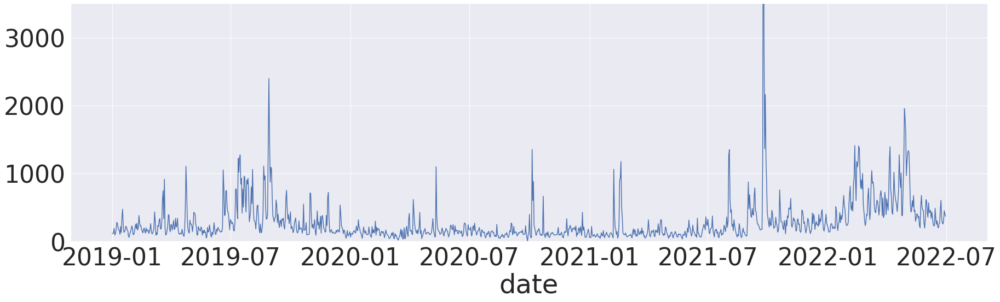

In [ ]:
plt.figure(figsize=(30,8))
sns.lineplot(df_text_dei_brand.groupby('date').count().text.sort_values().index,df_text_dei_brand.groupby('date').count().text.sort_values().values)
plt.ylim(0,3500)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(0.0, 800.0)

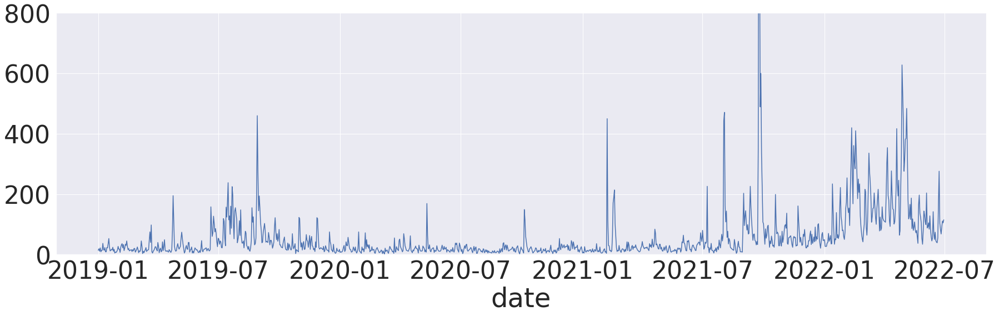

In [ ]:
plt.figure(figsize=(30,8))
sns.lineplot(df_hashtag_dei.groupby('date').count().text.sort_values().index,df_hashtag_dei.groupby('date').count().text.sort_values().values)
plt.ylim(0,800)


In [ ]:
len(df_hashtag_dei.groupby('date').count().text.sort_values().index)

1277

In [ ]:
len(list(set(df_hashtag_dei.date)))

1277

In [ ]:
def extract_sentiment_over_time(dataset, which_brand, start_date, end_date,choice):# datetime.date(2020,3,1),datetime.date(2020,12,1))
  if choice == True:
    brand = dataset[dataset.query_name == which_brand].sort_values('date')#.drop(["createdate"], axis=1)
    brand = brand.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True)
    plt.figure(figsize=(30, 5))
    sns.set(font_scale = 4)
    ax = plt.scatter( x = list(set(brand.date)), y = brand.groupby('date').count().text, marker='o', color='red')
    sns.lineplot(x = list(set(brand.date)), y = brand.groupby('date').count().text)
    plt.title(f"Volume Curve Behavior for brand without retweets: {which_brand}", fontsize = 40, weight = 'bold')
    plt.ylabel("Volume", fontsize = 20)
    plt.tick_params(rotation = 45)
    plt.xlim(start_date,end_date)
    plt.ylim(0,800)
  else:
    brand = dataset[dataset.query_name == which_brand].sort_values('date')#.drop(["createdate"], axis=1)
    plt.figure(figsize=(30, 5))
    sns.set(font_scale = 4)
    ax = plt.scatter( x = list(set(brand.date)), y = brand.groupby('date').value_counts().text, marker='o', color='red')
    sns.lineplot(x = list(set(brand.date)), y = brand.groupby('date').value_counts().text)
    plt.title(f"Volume Curve Behavior for brand with retweets: {which_brand}", fontsize = 40, weight = 'bold')
    plt.ylabel("Volume", fontsize = 20)
    plt.ylim(0,20)
    plt.tick_params(rotation = 45)
    plt.xlim(start_date,end_date)
  return plt.show()

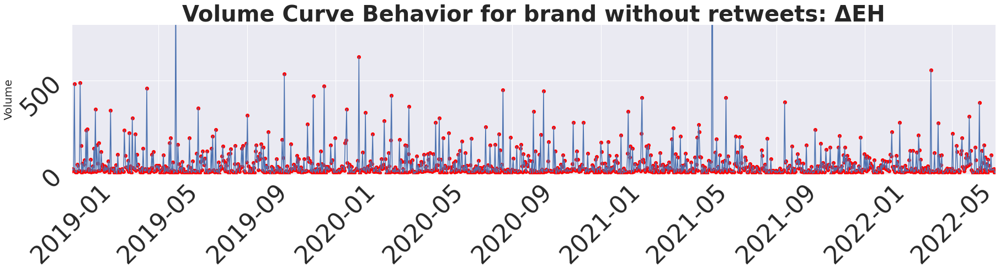

In [ ]:
extract_sentiment_over_time(df_hashtag_dei, df_hashtag_dei.query_name.value_counts().index[0], datetime.date(2019,1,1), datetime.date(2022,6,30), True)

## Trellis plot

In [ ]:
df_social

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,"Στο Μικρολίμανο, ευχαριστούμε πολύ1",Διαγωνισμοί,neutral,Watt & Volt,facebook,2020-10-23 09:01:11,0,2020-10-23,Electrical_Energy_dataset
1,Τον θυμάστε τον Μηλιώνη που άλλαξε τα φώτα τη...,Χρεοκοπία,negative,ΔΕΗ,twitter,2021-03-31 16:27:53,-1,2021-03-31,Electrical_Energy_dataset
2,@AdalHarry @teleftheriadou Συνταξιούχος ΔΕΗ επ...,Εκπτώσεις,negative,ΔΕΗ,twitter,2021-01-25 09:10:20,-1,2021-01-25,Electrical_Energy_dataset
3,Κόλλησα τον λογαριασμό της ΔΕΗ στον τοίχο του...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2020-07-10 09:58:17,-1,2020-07-10,Electrical_Energy_dataset
4,"Η Πυροσβεστική Υπηρεσία βρίσκεται επί ποδός, ε...",Ατυχήματα,negative,ΔΕΗ,facebook,2019-03-22 10:43:40,-1,2019-03-22,Electrical_Energy_dataset
...,...,...,...,...,...,...,...,...,...
41500,Ότι ο Βαγγέλης Μαρινάκης έχει την δυνατότητα ...,SDA,negative,Shopflix.gr,twitter,2022-04-14 22:29:26,-1,2022-04-14,Retail_&_e-shops_Tech_Products_dataset
41501,Ευτυχώς πρόλαβα και έγινα μέλος στο skroutz pl...,Corporate,neutral,Skroutz.gr,twitter,2022-04-15 09:55:50,0,2022-04-15,Retail_&_e-shops_Tech_Products_dataset
41502,"Το skroutz το ξεκινησαν 3 παιδιά με ορεξη, μυ...",Corporate,positive,Skroutz.gr,twitter,2022-04-14 23:43:05,1,2022-04-14,Retail_&_e-shops_Tech_Products_dataset
41503,Ούτε 1 € σε επιχείρηση του βαγγου. #cancel_s...,Corporate,negative,Shopflix.gr,twitter,2022-04-14 09:12:40,-1,2022-04-14,Retail_&_e-shops_Tech_Products_dataset


In [ ]:
df_social.dataset.value_counts()

DEI_dataset             1536854
NESTLE_dataset          1034264
COSMOTE_dataset          470948
LOREAL_dataset           332103
EUROBANK_dataset         300854
OLYMPIA_ODOS_dataset     238485
KOTSOVOLOS_dataset        41505
ELPE_dataset              20409
Name: dataset, dtype: int64

In [ ]:
totals = df_social.dataset.value_counts().sort_values(ascending=False)
totals

Electrical_Energy_dataset                 1536854
Food_&_Beverages_dataset                  1034264
Technology_&_Telecom_dataset               470948
Hygiene_&_Care_Products_dataset            332103
economics_dataset                          300854
Highways_&_Public_Works_dataset            238485
Retail_&_e-shops_Tech_Products_dataset      41505
Enegy_&_Telecom_dataset                     20409
Name: dataset, dtype: int64

In [ ]:
 dataframe_sent = df_social.groupby('dataset')['sentiment'].value_counts().to_frame()


In [ ]:
 dataframe_sent = dataframe_sent.reset_index().sort_values(['dataset','level_1'])
 #dataframe_sent = dataframe_sent.reset_index()

In [ ]:
ordered_list_datasets_counts=['Economics','Electrical_Energy','Energy_&_Telecom','Food_&_Beverages','Highways_&_Public_Works','Hygiene_&_Care_Products','Retail_&_e-shops_Tech_Products','Technology_&_Telecom']
ordered_list_datasets_sentiment = ['negative', 'neutral', 'positive']

In [ ]:
mapping = {dataset_size: i for i, dataset_size in enumerate(ordered_list_datasets_counts)}
mapping_2 = {sentiment_series: i for i, sentiment_series in enumerate(ordered_list_datasets_sentiment)}

key = dataframe_sent['dataset'].map(mapping)
#key2 = dataframe_sent['level_1'].map(mapping_2)

In [ ]:
dataframe_sent = dataframe_sent.iloc[key.argsort()]
#dataframe_sent = dataframe_sent.iloc[key2.argsort()]



In [ ]:
dataframe_sent

,dataset,level_1,sentiment
0,Economics,neutral,202367
1,Economics,negative,83659
2,Economics,positive,14828
4,Electrical_Energy,neutral,526006
3,Electrical_Energy,negative,994852
5,Electrical_Energy,positive,15996
7,Energy_&_Telecom,neutral,5160
8,Energy_&_Telecom,negative,4842
6,Energy_&_Telecom,positive,10407
9,Food_&_Beverages,neutral,788644


In [ ]:
dataframe_sent = dataframe_sent.reset_index(drop=True)#.sort_values(['dataset','level_1'])

In [ ]:
dataframe_sent = pd.DataFrame(dataframe_sent)

In [ ]:
dataframe_sent["sentiment_polarity"] = dataframe_sent["level_1"].map(sentiment_pol).astype('int')


In [ ]:
set(dataframe_sent.dataset)

0                          Economics_dataset
1                          Economics_dataset
2                          Economics_dataset
4                  Electrical_Energy_dataset
3                  Electrical_Energy_dataset
5                  Electrical_Energy_dataset
7                    Enegy_&_Telecom_dataset
8                    Enegy_&_Telecom_dataset
6                    Enegy_&_Telecom_dataset
9                   Food_&_Beverages_dataset
10                  Food_&_Beverages_dataset
11                  Food_&_Beverages_dataset
13           Highways_&_Public_Works_dataset
12           Highways_&_Public_Works_dataset
14           Highways_&_Public_Works_dataset
15           Hygiene_&_Care_Products_dataset
17           Hygiene_&_Care_Products_dataset
16           Hygiene_&_Care_Products_dataset
18    Retail_&_e-shops_Tech_Products_dataset
19    Retail_&_e-shops_Tech_Products_dataset
20    Retail_&_e-shops_Tech_Products_dataset
21              Technology_&_Telecom_dataset
22        

In [ ]:
#dataframe_sent[dataframe_sent.dataset=='Economics_dataset'].sentiment[0]
dataframe_sent[dataframe_sent.dataset== 'Food_&_Beverages']['sentiment']

10    132226
11    113394
9     788644
Name: sentiment, dtype: int64

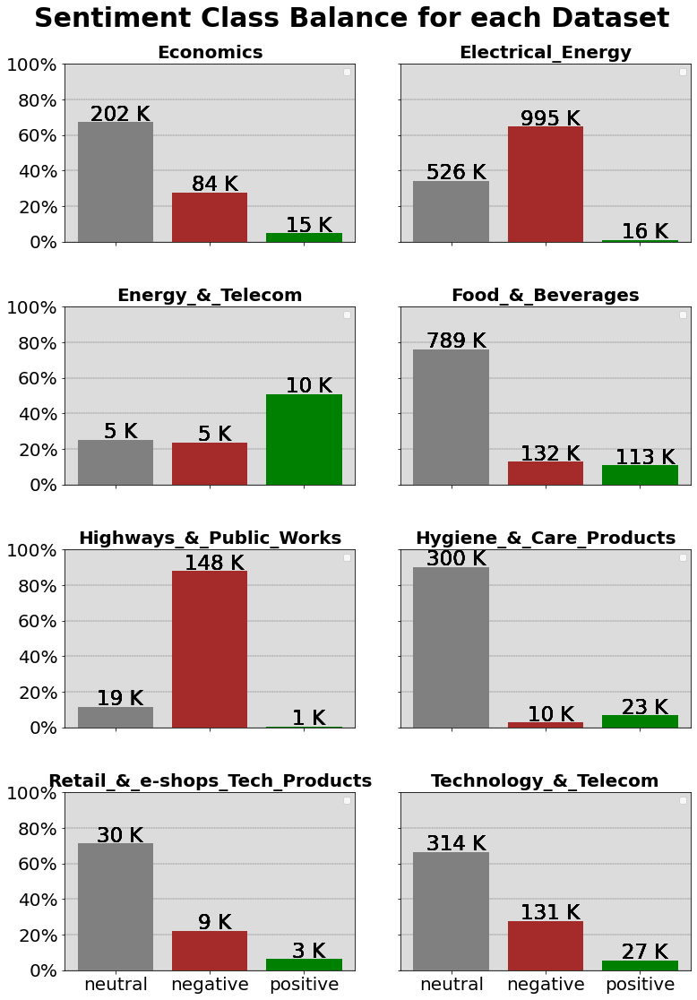

In [ ]:
list_of_colors = ['grey','brown','green']
ordered_list_datasets_counts=['Economics','Electrical_Energy','Energy_&_Telecom','Food_&_Beverages','Highways_&_Public_Works','Hygiene_&_Care_Products','Retail_&_e-shops_Tech_Products','Technology_&_Telecom']
ordered_list_datasets_sentiment = ['neutral', 'negative', 'positive']

fig,ax = plt.subplots(4,2,figsize=(11,15), sharex=True, sharey=True)
cntx=0
cnty=0
for z in range(8):

  for dataset in ordered_list_datasets_counts:
    total = sum(dataframe_sent[dataframe_sent.dataset == ordered_list_datasets_counts[z]]['sentiment'].values[i] for i in range(3))
    ax[cntx,cnty].grid(zorder=0, axis = 'y',color = 'black', linestyle = '--', linewidth = 0.3)
    #for i in range(3):
    ax[cntx,cnty].bar(ordered_list_datasets_sentiment[0],dataframe_sent[dataframe_sent.dataset == ordered_list_datasets_counts[z]]['sentiment'].values[0]/total*100, color = list_of_colors[0],zorder=3)
    ax[cntx,cnty].bar(ordered_list_datasets_sentiment[1],dataframe_sent[dataframe_sent.dataset == ordered_list_datasets_counts[z]]['sentiment'].values[1]/total*100, color = list_of_colors[1],zorder=3)
    ax[cntx,cnty].bar(ordered_list_datasets_sentiment[2],dataframe_sent[dataframe_sent.dataset == ordered_list_datasets_counts[z]]['sentiment'].values[2]/total*100, color = list_of_colors[2],zorder=3)

    ax[cntx,cnty].set_facecolor('gainsboro')
    ylabels = ['{:,.0f}'.format(x) + '%' for x in ax[cntx,cnty].get_yticks()]
    ax[cntx,cnty].set_yticklabels(ylabels, fontsize = 20)
    ax[cntx,cnty].set_ylim([0, 100])
    cnt=0
    for p in ax[cntx,cnty].patches:
      if cnt<3:
        percentage = dataframe_sent[dataframe_sent.dataset== ordered_list_datasets_counts[z]].sentiment.values[cnt]
        x = p.get_x() - 0.43 + p.get_width() + 0.08
        y = p.get_height() + 0.8
        ax[cntx,cnty].annotate('{:,.0f}'.format(percentage/1000)+' K', (x, y),ha='center',fontsize=23)
        cnt+=1
      else:
        continue

  ax[cntx,cnty].legend()
  ax[cntx,cnty].set_title('')
  ax[cntx,cnty].set_xlabel('')
  #ax[cntx,cnty].set_facecolor('#FFF2FF')
  ax[cntx,cnty].set_title(ordered_list_datasets_counts[z],size = 20, weight = 'bold')
  ax[cntx,cnty].tick_params(axis='x', labelsize=20)

  cnty+=1
  if cnty>=2:
    cnty=0
    cntx+=1

#fig.subplots_adjust(top=0.9, pad =2)
fig.tight_layout(w_pad = 0.51, h_pad = 4)
fig.suptitle('Sentiment Class Balance for each Dataset',fontsize=30, weight = 'bold', y=1.03)

plt.show()


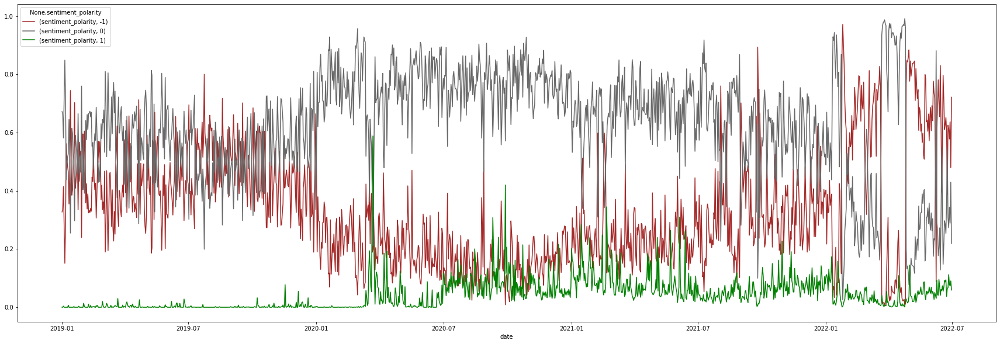

In [ ]:
vc = df_social.groupby('date')['sentiment_polarity'].value_counts('percentage').to_frame()
ax = vc.unstack(level=1).fillna(0).plot(kind='bar', figsize=(30, 10),color=['brown','dimgrey','green'])

Text(0.5, 0.98, 'Sentiment Class Balance for each Dataset')

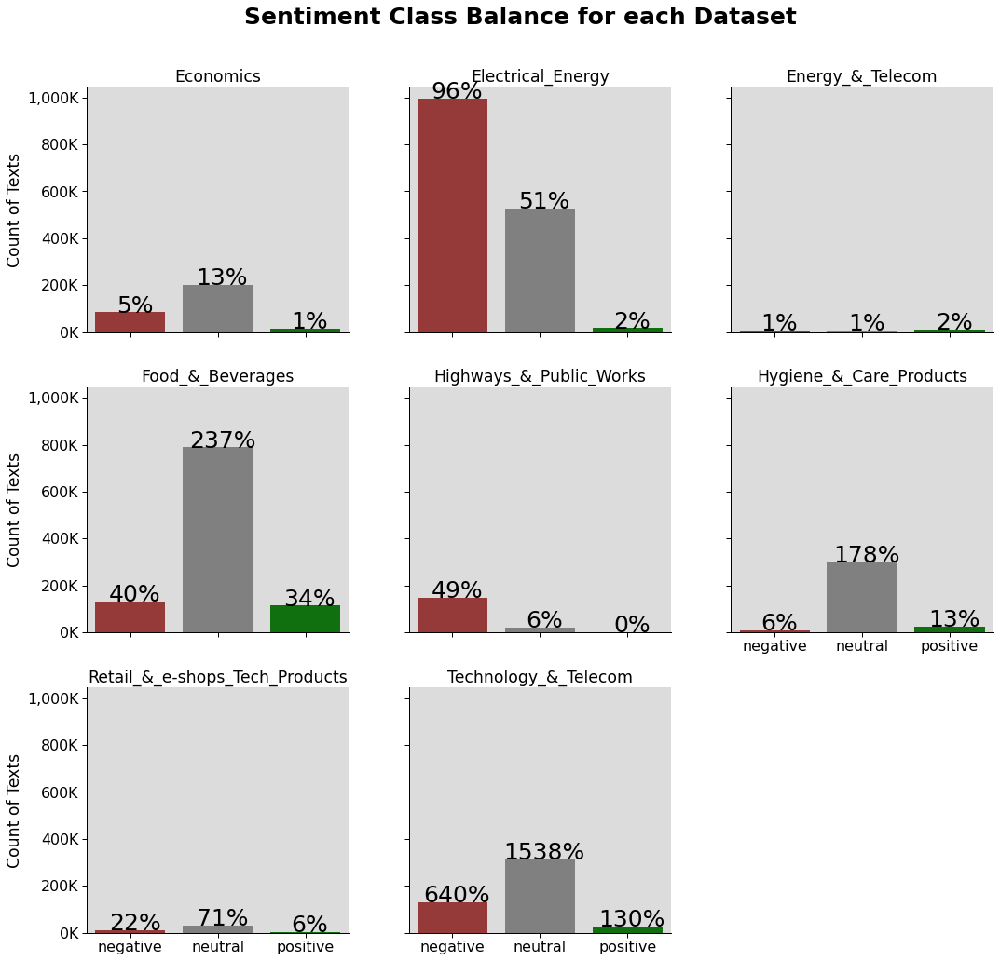

In [ ]:
#ordered_list_datasets_counts=['DEI_dataset','NESTLE_dataset','COSMOTE_dataset','LOREAL_dataset','EUROBANK_dataset','OLYMPIA_ODOS_dataset','KOTSOVOLOS_dataset','ELPE_dataset']
#ordered_list_datasets_counts=['Electrical_Energy','Food_&_Beverages','Technology_&_Telecom','Hygiene_&_Care_Products','Economics','Highways_&_Public_Works','Retail_&_e-shops_Tech_Products','Energy_&_Telecom']

with sns.plotting_context('paper', font_scale = 1.8):
  plot = sns.catplot(x='sentiment',
                   col='dataset',
                   #hue='sentiment_polarity',
                   kind='count',
                   col_wrap=3,
                   palette = ['brown','grey','green'],
                   data=df_social,col_order = ordered_list_datasets_counts,order= ['negative','neutral','positive'])
  plot.set_titles(col_template = '{col_name}')
  plot.set_ylabels('Count of Texts')
  plot.set_xlabels('')
  plot.axes[0].yaxis.get_major_formatter().set_scientific(False)
#sns.countplot(x=dataset.sentiment, ax=ax,data=dataset,palette=colors,order = ['neutral','negative','positive'])
for i in np.arange(8):
  ax1 = plot.facet_axis(0,i)
  ax1.set_facecolor('gainsboro')
  #ylabels = ['{:,.0f}'.format(x) + '%' for x in ax1.get_yticks()/10000]
  ylabels = ['{:,.0f}'.format(x) + 'K' for x in ax1.get_yticks()/1000]
  ax1.set_yticklabels(ylabels)
  for p in ax1.patches:
    percentage = '{:.0f}%'.format(100 * p.get_height()/df_social.dataset.value_counts()[i])
    x = p.get_x() - 0.43 + p.get_width() + 0.08
    y = p.get_height()
    ax1.annotate(percentage, (x, y),ha='center',fontsize=25)
#ax1.ticklabel_format(useOffset=False)

plot.fig.subplots_adjust(top=0.9)
plot.fig.suptitle('Sentiment Class Balance for each Dataset',fontsize=25, weight = 'bold')


In [ ]:
test =df_social.head()

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset
0,"Στο Μικρολίμανο, ευχαριστούμε πολύ1",Διαγωνισμοί,neutral,Watt & Volt,facebook,2020-10-23 09:01:11,0,2020-10-23,Electrical_Energy_dataset
1,Τον θυμάστε τον Μηλιώνη που άλλαξε τα φώτα τη...,Χρεοκοπία,negative,ΔΕΗ,twitter,2021-03-31 16:27:53,-1,2021-03-31,Electrical_Energy_dataset
2,@AdalHarry @teleftheriadou Συνταξιούχος ΔΕΗ επ...,Εκπτώσεις,negative,ΔΕΗ,twitter,2021-01-25 09:10:20,-1,2021-01-25,Electrical_Energy_dataset
3,Κόλλησα τον λογαριασμό της ΔΕΗ στον τοίχο του...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2020-07-10 09:58:17,-1,2020-07-10,Electrical_Energy_dataset
4,"Η Πυροσβεστική Υπηρεσία βρίσκεται επί ποδός, ε...",Ατυχήματα,negative,ΔΕΗ,facebook,2019-03-22 10:43:40,-1,2019-03-22,Electrical_Energy_dataset


Text(0.5, 0.98, 'Sentiment Class Balance(%) among Channels for each Dataset')

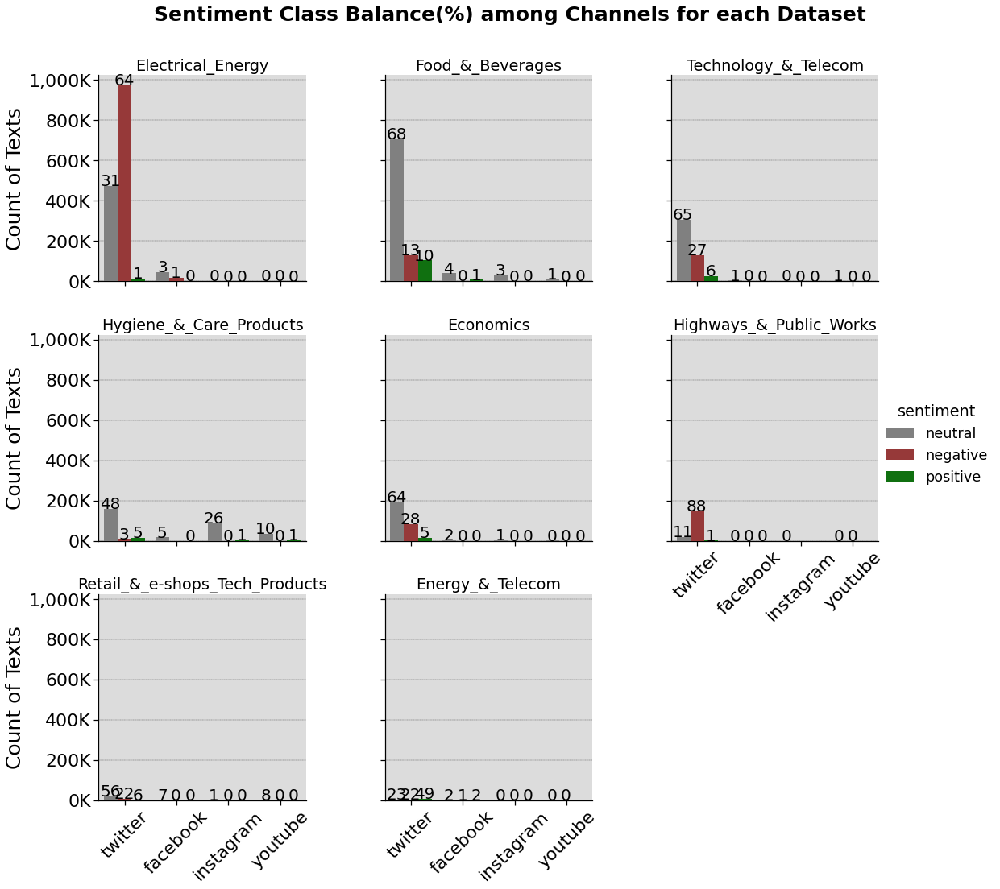

In [ ]:
#ordered_list_datasets_counts=['DEI_dataset','NESTLE_dataset','COSMOTE_dataset','LOREAL_dataset','EUROBANK_dataset','OLYMPIA_ODOS_dataset','KOTSOVOLOS_dataset','ELPE_dataset']
ordered_list_datasets_counts=['Electrical_Energy','Food_&_Beverages','Technology_&_Telecom','Hygiene_&_Care_Products','Economics','Highways_&_Public_Works','Retail_&_e-shops_Tech_Products','Energy_&_Telecom']

with sns.plotting_context('notebook', font_scale = 1.6):
  plot = sns.catplot(x='channel',
                   col='dataset',
                   hue='sentiment',
                   kind='count',
                   col_wrap=3,
                   palette = ['grey','brown','green'],
                   data=df_social,col_order = ordered_list_datasets_counts, order = ['twitter', 'facebook', 'instagram', 'youtube'], hue_order= ['neutral','negative','positive'],zorder=3)
  plot.set_titles(col_template = '{col_name}')
  plot.set_xlabels('')
  plot.set_ylabels('Count of Texts', fontsize = 25)
  plot.axes[0].yaxis.get_major_formatter().set_scientific(False)


#sns.countplot(x=dataset.sentiment, ax=ax,data=dataset,palette=colors,order = ['neutral','negative','positive'])
for i in np.arange(8):
  ax1 = plot.facet_axis(0,i)
  ax1.grid(zorder=0, axis = 'y',color = 'black', linestyle = '--', linewidth = 0.3)
  ylabels = ['{:,.0f}'.format(x) + 'K' for x in ax1.get_yticks()/1000]
  ax1.set_yticklabels(ylabels, fontsize = 22)
  ax1.set_facecolor('gainsboro')
  ax1.tick_params(axis='x', rotation = 45, labelsize = 22)
  for p in ax1.patches:
    percentage = '{:.0f}'.format(100 * p.get_height()/df_social.dataset.value_counts()[i])
    x = p.get_x() - 0.22 + p.get_width() + 0.08
    y = p.get_height()
    ax1.annotate(percentage, (x, y),ha='center',fontsize=20)
plot.fig.subplots_adjust(top=0.9)
plot.fig.suptitle('Sentiment Class Balance(%) among Channels for each Dataset', size = 25, weight = 'bold')

## Data Exploratory

In [ ]:
#df_dei.sentiment.unique(), df_elpe.sentiment.unique(), df_eurobank.sentiment.unique(), df_loreal.sentiment.unique(), df_nestle.sentiment.unique(), df_cosmote.sentiment.unique(), df_olympiaodos.sentiment.unique(),df_kotsovolos.sentiment.unique()

### Dei-Dataset

In [ ]:
print(f"The number of NaNs in the text for dei_dataset {df_dei.text.isna().sum()}, the number of NaNs in sentiment {df_dei.sentiment.isna().sum()}, the number of NaNs in tag {df_dei.tag.isna().sum()}, the number of NaNs in query_name {df_dei.query_name.isna().sum()}, the number of NaNs in date {df_dei.date.isna().sum()}.")
df_dei.sentiment.value_counts()

The number of NaNs in the text for dei_dataset 299, the number of NaNs in sentiment 0, the number of NaNs in tag 188927, the number of NaNs in query_name 0, the number of NaNs in date 0.


negative    994852
neutral     526006
positive     15996
Name: sentiment, dtype: int64

In [ ]:
df_dei.channel.isna().sum()

0

In [ ]:
# df_dei['tag'] = df_dei['tag'].replace("Φυσικό αέριο", 'Φυσικό Αέριο')

In [ ]:
df_dei.tag.value_counts().head()

Λογαριασμοί (γενικό)    296590
Νέα Δημοκρατία          126383
Εξυγείανση/Πώληση        94633
ΣΥΡΙΖΑ                   63153
Αυξήσεις                 60078
Name: tag, dtype: int64

In [ ]:
#df_dei[df_dei.tag=="Ιδιωτικοποίηση ΔΕΗ"].head(5)

In [ ]:
print(f"Number of Tags Dei Dataset is {len(df_dei.tag.unique())} and the number of Brands is {len(df_dei.query_name.unique())}")

Number of Tags Dei Dataset is 59 and the number of Brands is 10


In [ ]:
ordered_list_datasets_counts=['Electrical_Energy','Food_&_Beverages','Technology_&_Telecom','Hygiene_&_Care_Products','Economics','Highways_&_Public_Works','Retail_&_e-shops_Tech_Products','Enegy_&_Telecom']


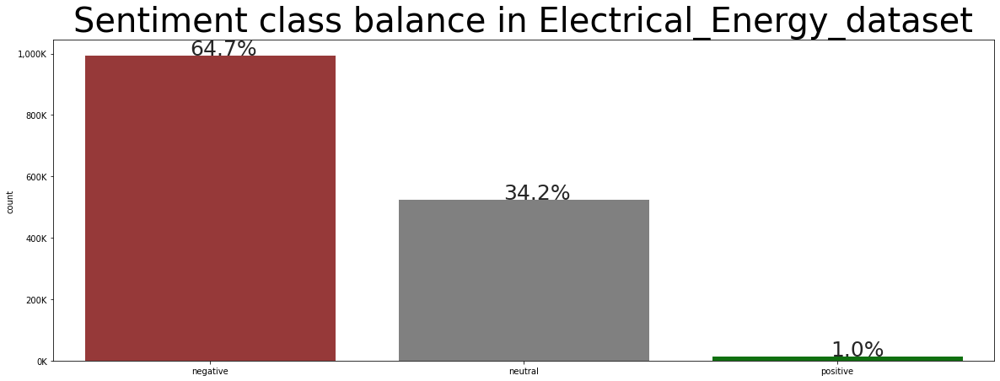

In [ ]:
extract_sentiment_balance(ordered_list_datasets_counts[0], df_dei, True)

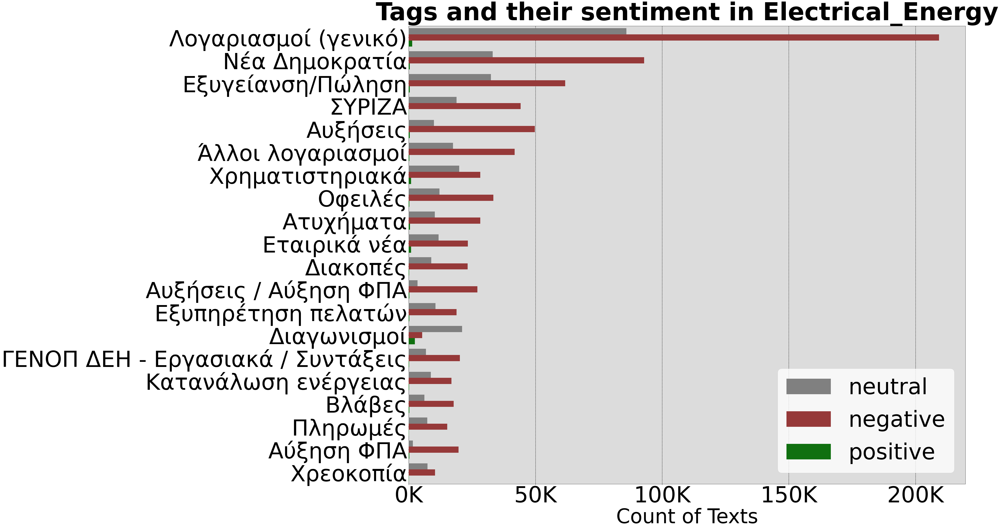

In [ ]:
extract_sentiment_balance_foreach_tag(ordered_list_datasets_counts[0], df_dei, True)

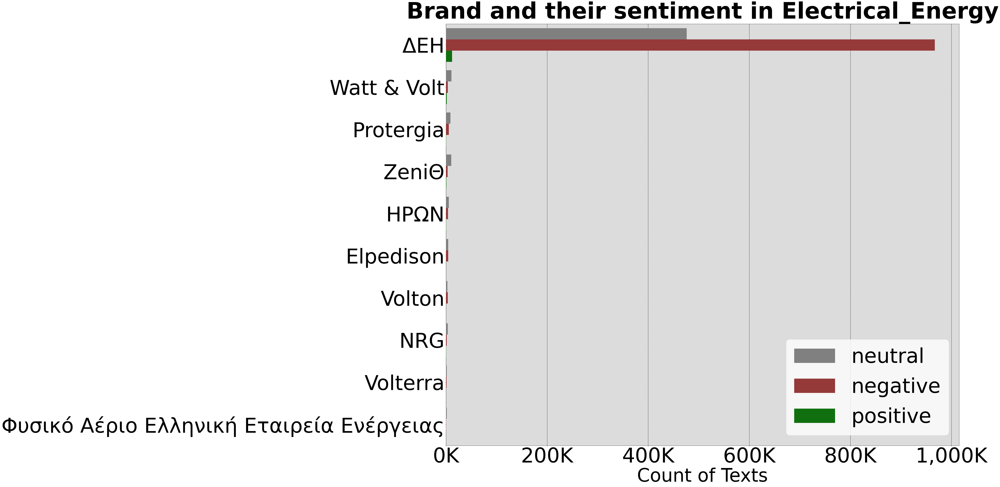

In [ ]:
extract_sentiment_balance_foreach_brand(ordered_list_datasets_counts[0], df_dei, True)

In [ ]:
# brand_dei = brand_dei.drop_duplicates(
#   subset = ['date', 'text'],
#   keep = 'last').reset_index(drop = True)

In [ ]:
df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[0]].date.value_counts().head(10)

2021-09-24    48875
2021-09-25    25887
2022-02-17    14289
2022-04-28    12445
2022-02-18    11441
2022-04-29    11082
2022-04-30    10769
2021-09-27    10470
2022-05-05    10414
2022-02-11    10033
Name: date, dtype: int64

In [ ]:
#vc = df_dei.groupby('date')['sentiment_polarity'].value_counts('percentage').to_frame()

In [ ]:
#vc

In [ ]:
ts = brand.groupby('date').count().text

(738034.0, 738276.0)

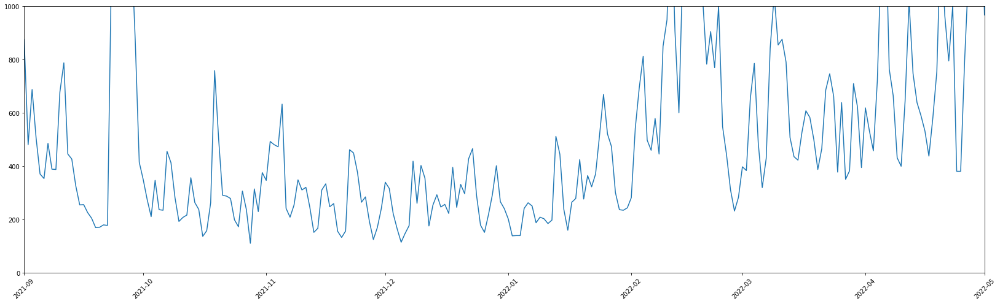

In [ ]:
plt.figure(figsize=(28,8))
plt.plot(ts)
plt.ylim(0,1000)
plt.tick_params('x',rotation = 45)

plt.xlim(pd.to_datetime('2021-09-01').date(), pd.to_datetime('2022-05-01').date())

In [ ]:
ts = df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[0]].sort_values('date').drop(["createdate"], axis=1).groupby('date')['sentiment_polarity'].mean()

In [ ]:
import matplotlib.patches as mpatches


(738034.0, 738276.0)

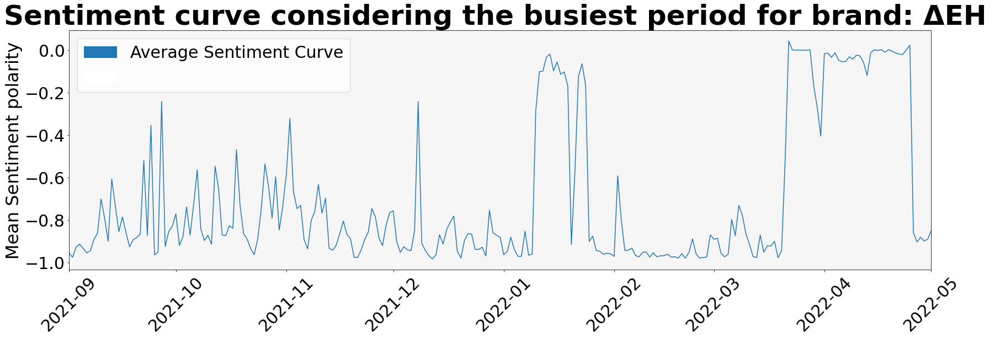

In [ ]:
plt.figure(figsize=(28,8))
#brand = df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[0]].sort_values('date').drop(["createdate"], axis=1)
#brand = brand.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True)
ax = plt.gca()
ax.patch.set_facecolor('whitesmoke')
plt.title(f"Sentiment curve considering the busiest period for brand: {df_dei.query_name.value_counts().index[0]} ", fontsize = 50, weight = 'bold')
plt.ylabel("Mean Sentiment polarity", fontsize = 32)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
plt.tick_params('x',rotation = 45)
acg_sent_ts = mpatches.Patch(label='Average Sentiment Curve')
segments = mpatches.Patch(color= 'white',linestyle='--', label='')
plt.legend(handles=[acg_sent_ts, segments],loc='upper left', fontsize=30)

#plt.legend(handles=[red_patch])
plt.plot(ts)
plt.xlim(pd.to_datetime('2021-09-01'), pd.to_datetime('2022-05-01'))

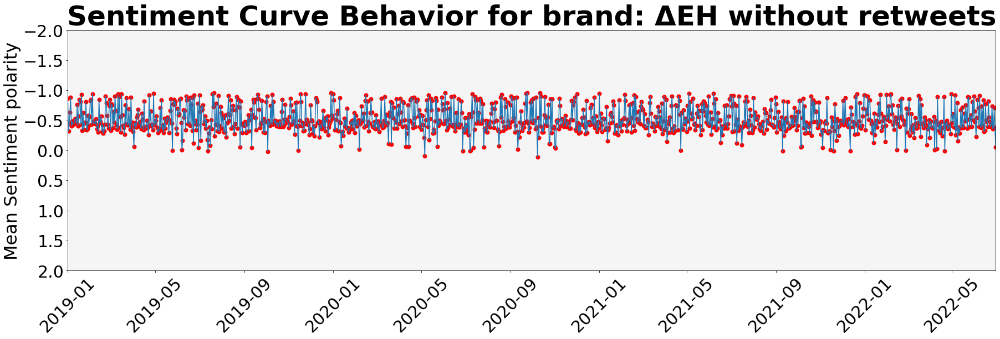

In [ ]:
extract_sentiment_over_time(df_dei, df_dei.query_name.value_counts().index[0], datetime.date(2019,1,1), datetime.date(2022,6,30), True)

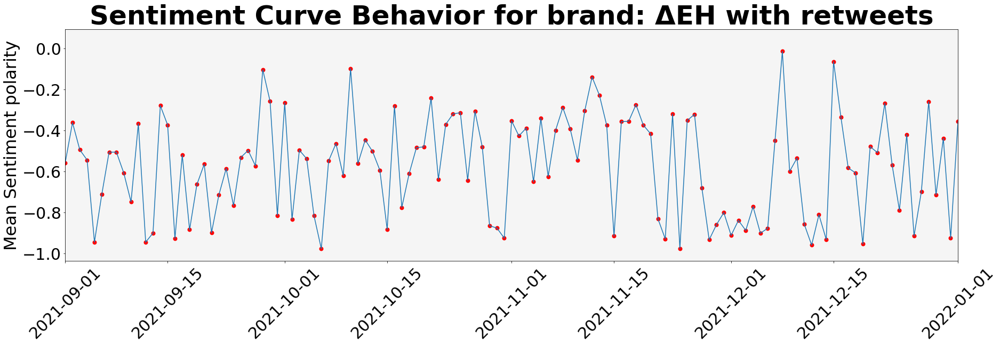

In [ ]:
extract_sentiment_over_time(df_dei, df_dei.query_name.value_counts().index[0], datetime.date(2021,9,1), datetime.date(2022,1,1), False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: Unrecognized location 'middle right'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


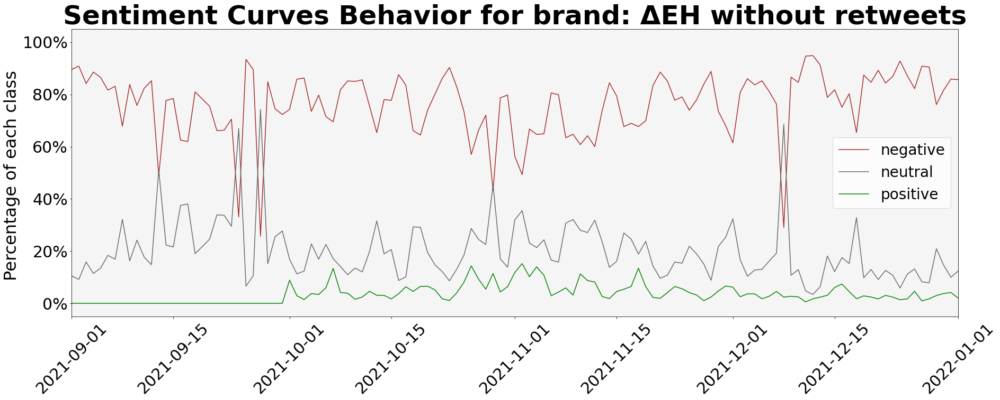

In [ ]:
extract_sentiment_time_series(df_dei, df_dei.query_name.value_counts().index[0], datetime.date(2021,9,1), datetime.date(2022,1,1),True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: MatplotlibDeprecationWarning: Unrecognized location 'middle right'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


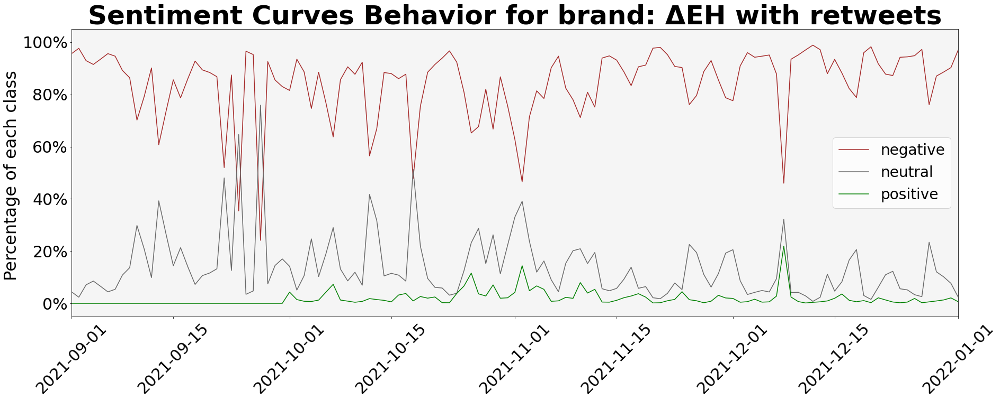

In [ ]:
extract_sentiment_time_series(df_dei, df_dei.query_name.value_counts().index[0], datetime.date(2021,9,1), datetime.date(2022,1,1),False)

In [ ]:
df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[1]].date.value_counts().head()

2020-07-13    1241
2020-10-23    1073
2020-06-15     768
2020-07-06     725
2020-08-24     700
Name: date, dtype: int64

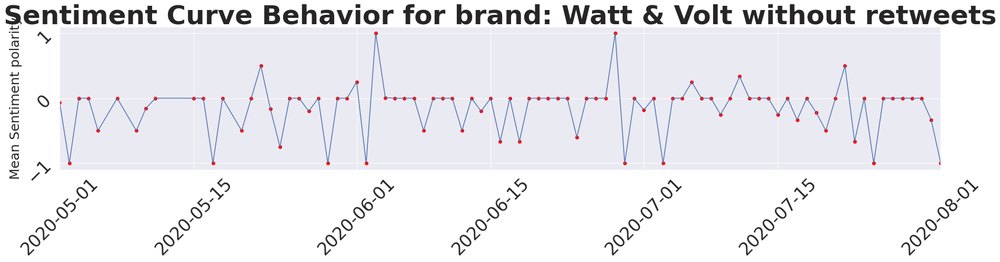

In [ ]:
extract_sentiment_over_time(df_dei, df_dei.query_name.value_counts().index[1], datetime.date(2020,5,1), datetime.date(2020,8,1),True)

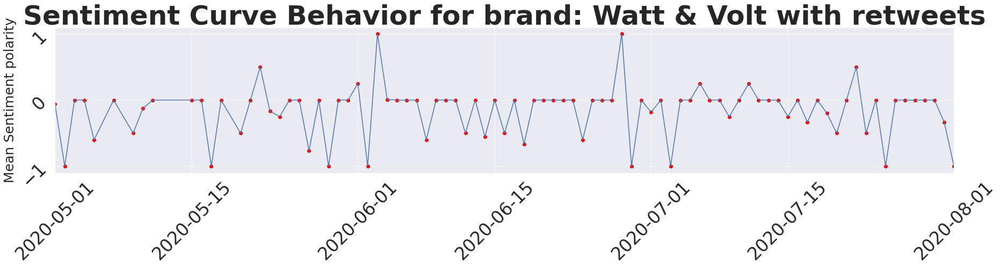

In [ ]:
extract_sentiment_over_time(df_dei, df_dei.query_name.value_counts().index[1], datetime.date(2020,5,1), datetime.date(2020,8,1),False)

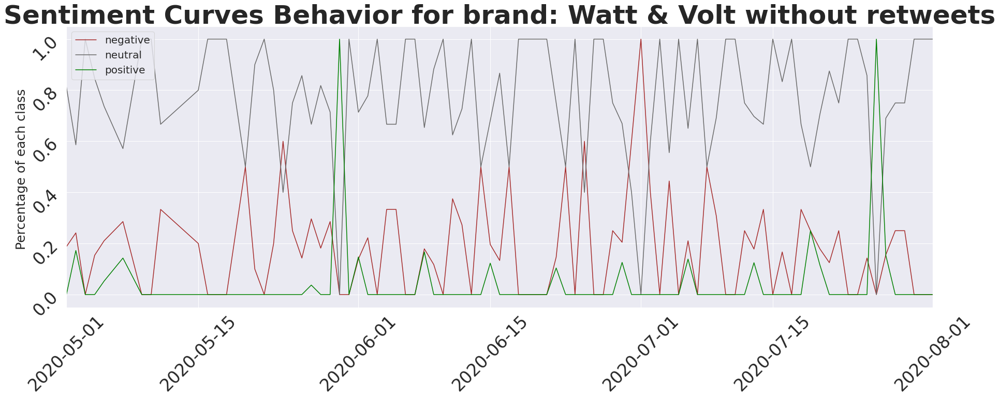

In [ ]:
extract_sentiment_time_series(df_dei, df_dei.query_name.value_counts().index[1], datetime.date(2020,5,1), datetime.date(2020,8,1),True)

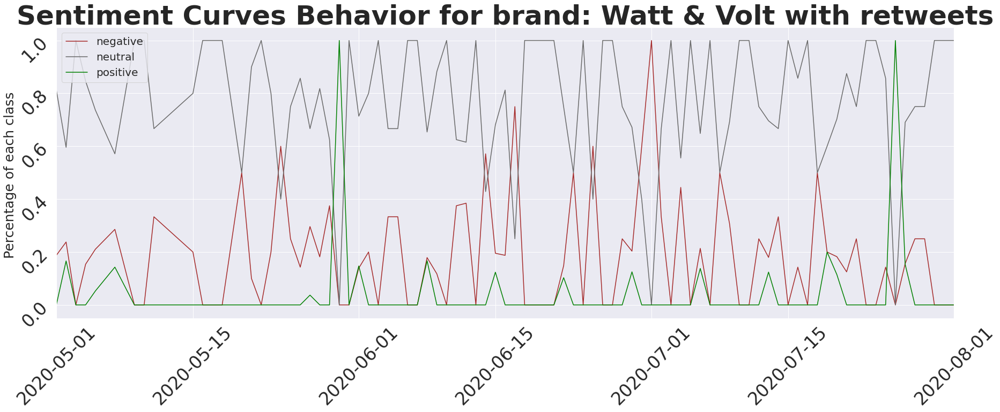

In [ ]:
extract_sentiment_time_series(df_dei, df_dei.query_name.value_counts().index[1], datetime.date(2020,5,1), datetime.date(2020,8,1),False)

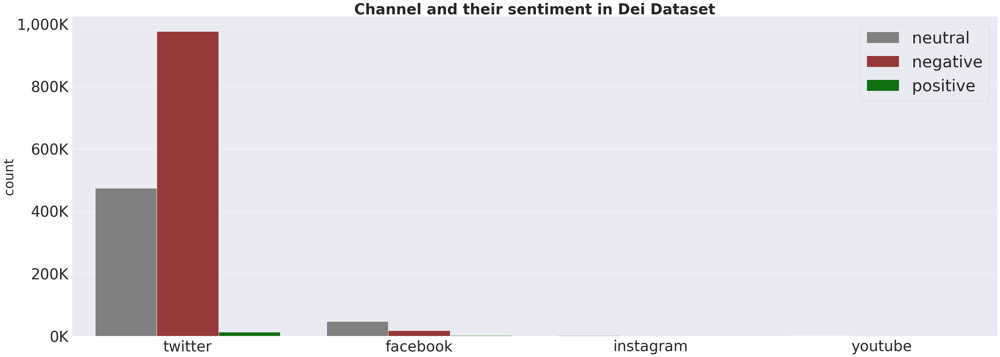

In [ ]:
extract_sentiment_balance_foreach_channel("Dei Dataset", df_dei, True)

### Elpe-Dataset

In [ ]:
print(f"The number of NaNs in the text for elpe_dataset {df_elpe.text.isna().sum()}, the number of NaNs in sentiment {df_elpe.sentiment.isna().sum()}, the number of NaNs in tag {df_elpe.tag.isna().sum()}, the number of NaNs in createdate {df_elpe.createdate.isna().sum()}, the number of NaNs in query_name {df_elpe.query_name.isna().sum()}, the number of NaNs in date {df_elpe.date.isna().sum()}.")
df_elpe.sentiment.value_counts()

The number of NaNs in the text for elpe_dataset 1, the number of NaNs in sentiment 0, the number of NaNs in tag 0, the number of NaNs in createdate 0, the number of NaNs in query_name 0, the number of NaNs in date 0.


positive    10407
neutral      5160
negative     4842
Name: sentiment, dtype: int64

In [ ]:
len(df_elpe.tag.value_counts())

101

In [ ]:
df_elpe.query_name.value_counts().head(10)

ΙΣΝ                4017
PAPASTRATOS        3860
ΟΤΕ                3088
ΕΛΠΕ               2316
ΔΕΗ                2209
MOTOR OIL          1869
VODAFONE            801
AEGEAN AIRLINES     752
ΜΥΤΙΛΗΝΑΙΟΣ         317
ΕΥΔΑΠ               254
Name: query_name, dtype: int64

In [ ]:
print(f"Number of Tags Elpe Dataset is {len(df_elpe.tag.unique())} and the number of Brands is {len(df_elpe.query_name.unique())}")

Number of Tags Elpe Dataset is 101 and the number of Brands is 21


In [ ]:
ordered_list_datasets_counts=['Electrical_Energy_dataset','Food_&_Beverages_dataset','Technology_&_Telecom_dataset','Hygiene_&_Care_Products_dataset','Economics_dataset','Highways_&_Public_Works_dataset','Retail_&_e-shops_Tech_Products_dataset','Enegy_&_Telecom_dataset']


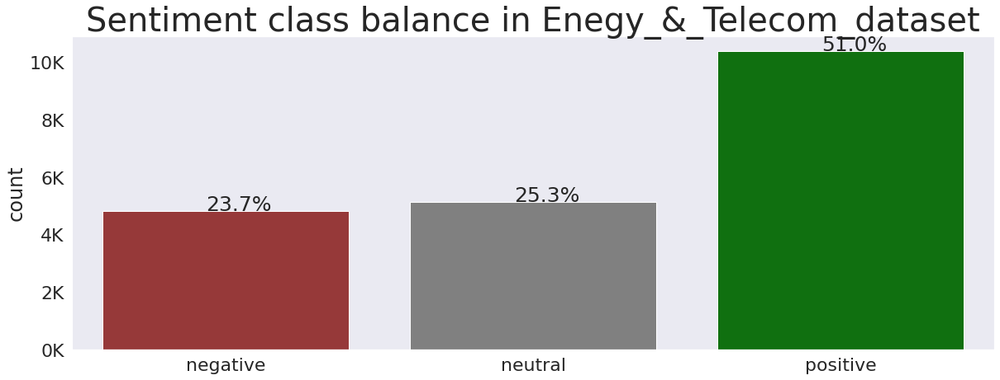

In [ ]:
extract_sentiment_balance(ordered_list_datasets_counts[7], df_elpe, True)

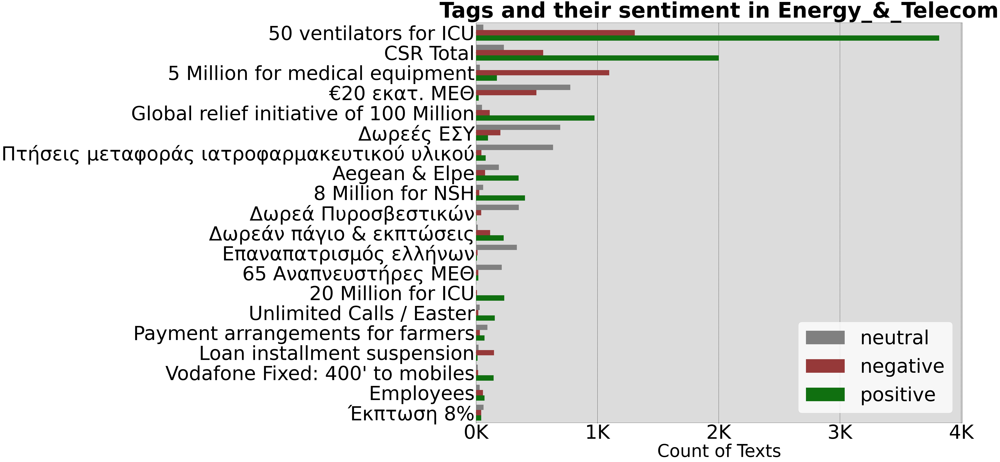

In [ ]:
extract_sentiment_balance_foreach_tag(ordered_list_datasets_counts[7], df_elpe, True)

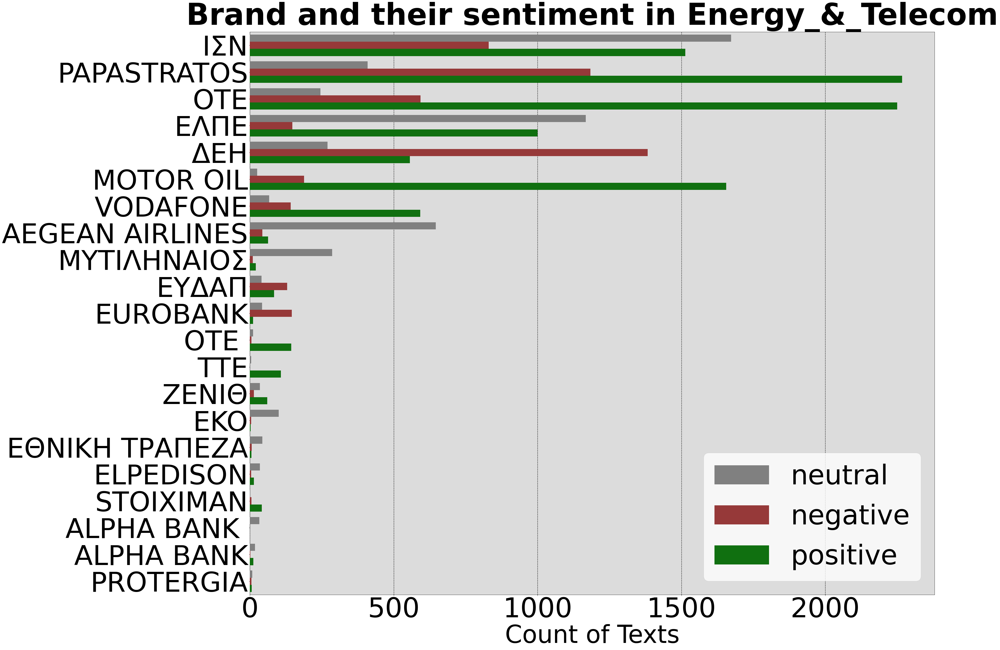

In [ ]:
extract_sentiment_balance_foreach_brand(ordered_list_datasets_counts[7], df_elpe, False)

In [ ]:
df_elpe[df_elpe.query_name == df_elpe.query_name.value_counts().index[0]].date.value_counts().head()

2020-04-07    789
2020-04-11    322
2020-09-21    265
2020-07-01    211
2020-11-27    199
Name: date, dtype: int64

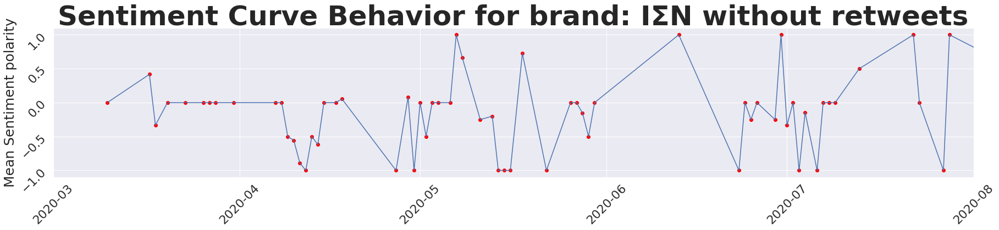

In [ ]:
extract_sentiment_over_time(df_elpe, df_elpe.query_name.value_counts().index[0], datetime.date(2020,3,1), datetime.date(2020,8,1),True)

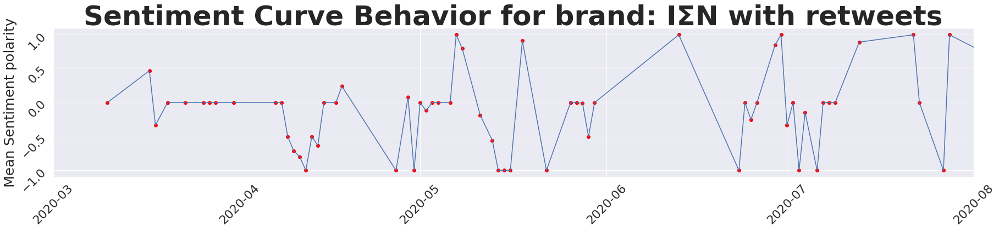

In [ ]:
extract_sentiment_over_time(df_elpe, df_elpe.query_name.value_counts().index[0], datetime.date(2020,3,1), datetime.date(2020,8,1),False)

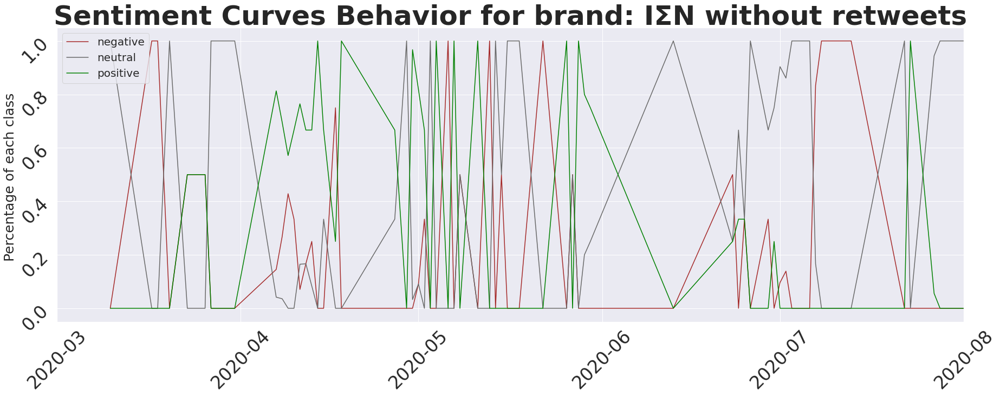

In [ ]:
extract_sentiment_time_series(df_elpe, df_elpe.query_name.value_counts().index[0], datetime.date(2020,3,1), datetime.date(2020,8,1),True)

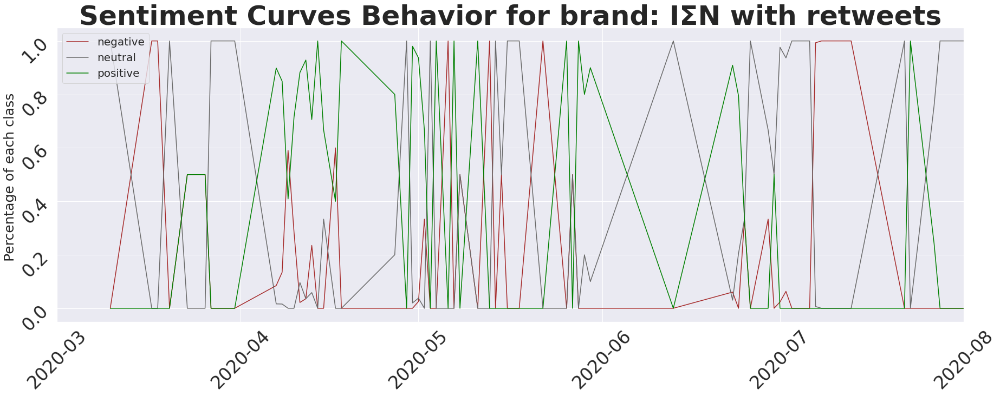

In [ ]:
extract_sentiment_time_series(df_elpe, df_elpe.query_name.value_counts().index[0], datetime.date(2020,3,1), datetime.date(2020,8,1),False)

In [ ]:
df_elpe[df_elpe.query_name == df_elpe.query_name.value_counts().index[1]].date.value_counts().head()

2020-03-18    857
2020-03-17    848
2020-03-22    844
2020-03-21    434
2020-06-19    216
Name: date, dtype: int64

In [ ]:
extract_sentiment_time_series(df_elpe, df_elpe.query_name.value_counts().index[1], datetime.date(2020,3,1), datetime.date(2020,7,1))

In [ ]:
extract_sentiment_balance_foreach_channel("Elpe Dataset", df_elpe, True)

# Phase 2

## CPD Change Point Detection

### Install Libraries

In [ ]:
!pip install ruptures

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 6.6 MB/s 


In [ ]:
import ruptures as rpt

### Function to detect the changing points in a time series and extraction of dates of interest

In [ ]:
CPD_Method = [rpt.Pelt, rpt.Binseg, rpt.Window, rpt.Dynp]
CPD_Method_Title = ["Pruned Exact Linear Time (PELT) search method", "Binary segmentation search method","Window-based search method", "Dynamic programming search method"]

def change_point_detection(dataset, which_brand, Method, n_breaks_or_pen, Method_Title):
  dataset = dataset.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True) # drop dublicates and keep the usefull columnds set index the date
  brand = dataset[dataset.query_name == which_brand].sort_values('date')#.drop(["createdate"], axis=1)  # select the brand and keep only the sentiment polarity column
  #brand.drop('date', axis=1)                                                                           # because we got the date as index and
  ts = brand.groupby('date')['sentiment_polarity'].mean()
  #ts = brand.groupby('date').count().text
  ts1 = np.array(ts.to_list())
# Detect the change points
  if Method == rpt.Pelt:
    algo1 = Method(model="rbf", min_size=3, jump=5).fit(ts1)
    change_location1 = algo1.predict(pen=n_breaks_or_pen)
  elif Method == rpt.Binseg:
    algo1 = Method(model= "rbf").fit(ts1)
    change_location1 = algo1.predict(n_bkps=n_breaks_or_pen-1)
  elif Method == rpt.Window:
    algo1 = Method(width=40, model="rbf").fit(ts1)
    change_location1 = algo1.predict(n_bkps=n_breaks_or_pen-1)
  else:
    algo1 = Method(model="l1", min_size=3, jump=5).fit(ts1)
    change_location1 = algo1.predict(n_bkps=n_breaks_or_pen-1)
  breaks_rpt = []
  for i in change_location1:
    if i in change_location1[:-1]:
      breaks_rpt.append(ts.index[i])
    else:
      breaks_rpt.append(ts.index[i-1])
  breaks_rpt = pd.to_datetime(breaks_rpt)

  params = {
    'axes.titlesize': 25,
    'axes.labelsize': 12,
    'axes.titleweight':'bold'
  }

# # Point the change points:
  def plot_change_points(ts,ts_change_loc):
    plt.figure(figsize=(28,8))
    plt.rcParams.update(params)
    plt.rcParams['font.size'] = '16'
    sns.set(font_scale=2.5)
    #plt.title(f"Changepoint Detection analysis for Average Sentiment Time Series on brand: {which_brand}")
    plt.title(f"Change Point Detection analysis for Average Sentiment Time Series on brand: {which_brand}", fontsize = 30)
    plt.suptitle(f"Method: {Method_Title}",fontsize=25)
    plt.plot(ts)
    for x in ts_change_loc:
      if x in ts_change_loc[:-1]:
        plt.axvline(x,lw=2, color='red',linestyle='dashed')
      else:
        plt.axvline(x,lw=2, alpha=0,linestyle='dashed')
    plt.ylabel('Average Sentiment',fontsize=25)
    #plt.ylim(0,1300)
    plt.xlabel('Observations',fontsize=25)
    plt.legend(['Avg Sentiment Curve','CPD line'],fontsize=22)

  return(plot_change_points(ts1,change_location1),pd.DataFrame({'Dates of Interest':breaks_rpt}), print(f"##############################################\n{pd.DataFrame({'Dates of Interest':breaks_rpt})}\n##############################################"), ts1, change_location1)

In [ ]:
def extract_all_dates(df1,df2,df3,df4):
  df_exact_solutions = pd.merge(df1, df4, how='inner', on=['Dates of Interest'])
  df_approximations = pd.merge(df2, df3, how='inner', on=['Dates of Interest'])
  return(df_exact_solutions, df_approximations)

### hastag sentiment time series

##############################################
   Dates of Interest
0         2019-06-05
1         2019-09-18
2         2020-12-31
3         2021-07-24
4         2021-10-27
5         2021-11-21
6         2022-01-10
7         2022-01-25
8         2022-03-21
9         2022-04-25
10        2022-06-30
##############################################


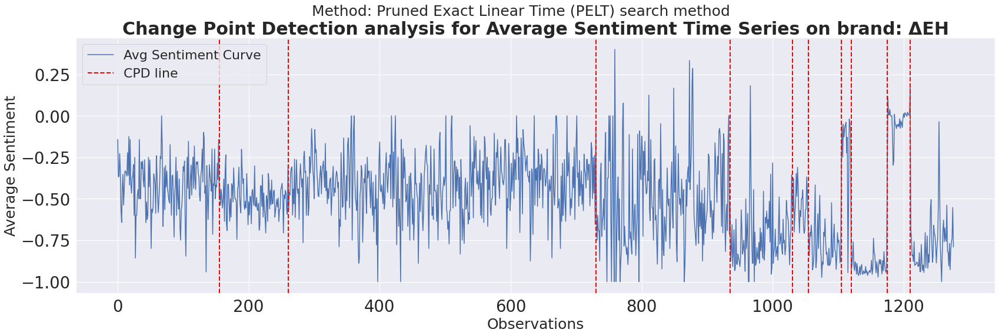

In [ ]:
plot, df_PELT_dates, dates, pelt_ts, change_loc_pelt = change_point_detection(df_hashtag_dei, df_hashtag_dei.query_name.value_counts().index[0],CPD_Method[0],4,CPD_Method_Title[0])

### Detect the changing points in curve of top Brand belonging to Dei Dataset volume time series

In [ ]:
ts = df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[0]].sort_values('date').drop(["createdate"], axis=1).groupby('date')['sentiment_polarity'].mean()
ts

date
2019-01-01   -0.335366
2019-01-02   -0.350318
2019-01-03   -0.418502
2019-01-04   -0.281081
2019-01-05   -0.150190
                ...   
2022-06-26   -0.911130
2022-06-27   -0.667620
2022-06-28   -0.831504
2022-06-29   -0.766181
2022-06-30   -0.956981
Name: sentiment_polarity, Length: 1277, dtype: float64

##############################################
  Dates of Interest
0        2019-06-20
1        2019-10-03
2        2019-12-02
3        2021-06-24
4        2021-09-02
5        2021-09-12
6        2022-02-04
7        2022-05-15
8        2022-06-30
##############################################


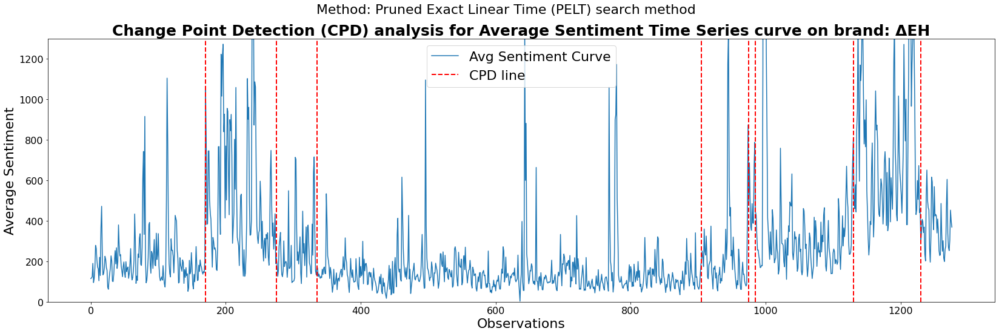

In [ ]:
plot, df_PELT_dates, dates, pelt_ts, change_loc_pelt = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[0],4,CPD_Method_Title[0])

##############################################
  Dates of Interest
0        2019-06-20
1        2019-10-03
2        2019-12-07
3        2021-05-30
4        2021-09-02
5        2021-09-12
6        2022-02-04
7        2022-05-15
8        2022-06-30
##############################################


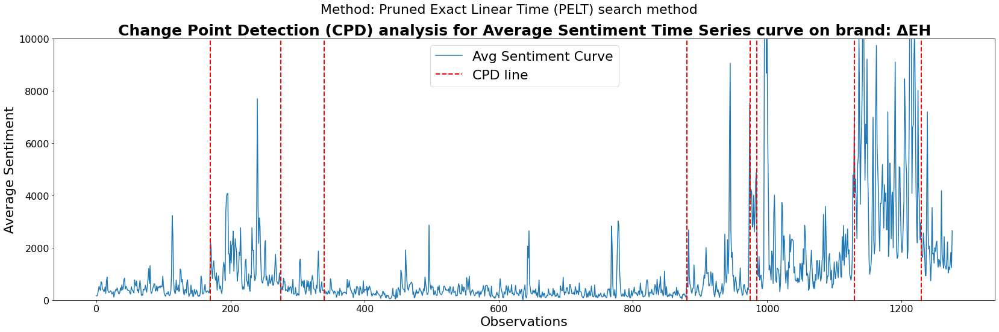

In [ ]:
plot, df_PELT_dates, dates, pelt_ts, change_loc_pelt = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[0],4,CPD_Method_Title[0])

### Detect the changing points in curve of top Brand belonging to Dei Dataset

In [ ]:
ts = df_dei[df_dei.query_name == df_dei.query_name.value_counts().index[0]].sort_values('date').drop(["createdate"], axis=1).groupby('date')['sentiment_polarity'].mean()
ts

date
2019-01-01   -0.335366
2019-01-02   -0.350318
2019-01-03   -0.418502
2019-01-04   -0.281081
2019-01-05   -0.150190
                ...   
2022-06-26   -0.911130
2022-06-27   -0.667620
2022-06-28   -0.831504
2022-06-29   -0.766181
2022-06-30   -0.956981
Name: sentiment_polarity, Length: 1277, dtype: float64

##############################################
  Dates of Interest
0        2020-12-31
1        2021-07-24
2        2022-01-10
3        2022-01-25
4        2022-03-21
5        2022-04-25
6        2022-06-30
##############################################


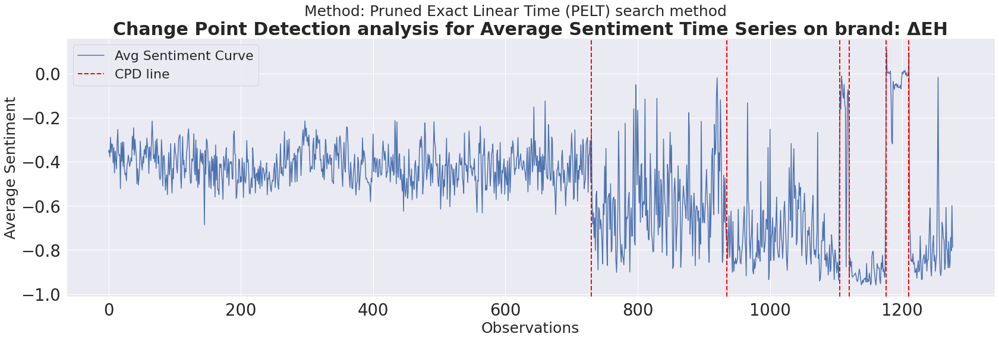

In [ ]:
plot, df_PELT_dates, dates, pelt_ts, change_loc_pelt = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[0],6,CPD_Method_Title[0])

##############################################
  Dates of Interest
0        2020-12-31
1        2021-07-24
2        2022-01-10
3        2022-01-25
4        2022-03-21
5        2022-04-25
6        2022-06-30
##############################################


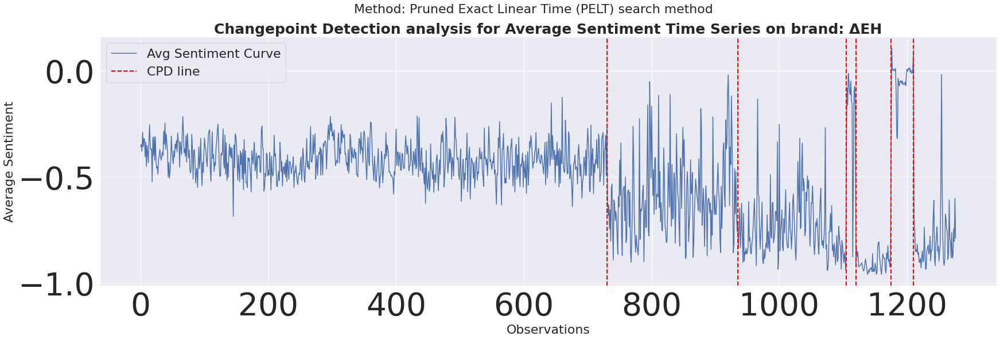

In [ ]:
plot, df_PELT_dates, dates, pelt_ts, change_loc_pelt = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[0],10,CPD_Method_Title[0])

##############################################
  Dates of Interest
0        2020-12-31
1        2021-07-24
2        2021-12-06
3        2022-03-21
4        2022-04-25
5        2022-06-30
##############################################


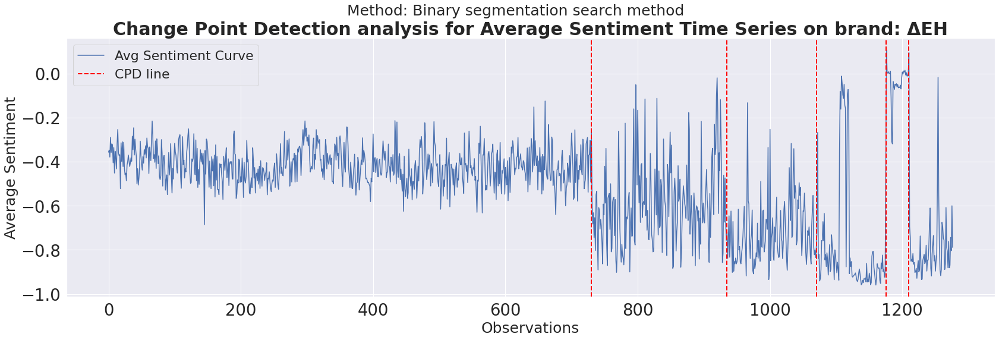

In [ ]:
plot, df_binseg_dates, dates, binseg_ts, change_loc_binseg = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[1],6,CPD_Method_Title[1])

##############################################
  Dates of Interest
0        2020-12-31
1        2021-07-24
2        2022-01-30
3        2022-03-21
4        2022-04-25
5        2022-06-30
##############################################


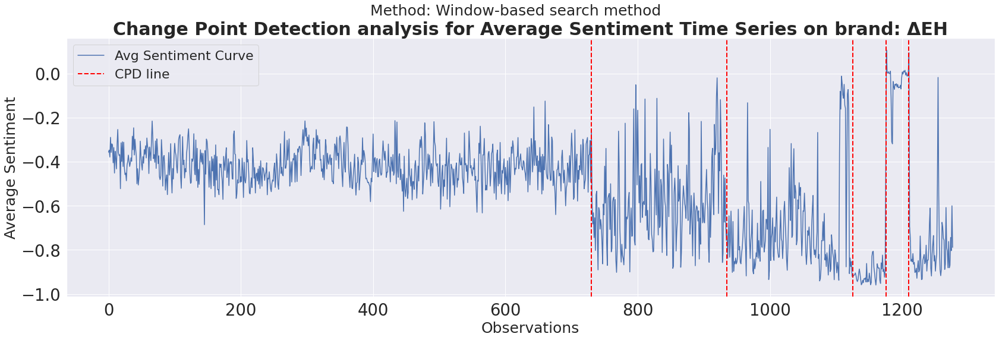

In [ ]:
plot, df_Window_dates, dates, window_ts, change_loc_window = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[2],6,CPD_Method_Title[2])

##############################################
  Dates of Interest
0        2020-12-31
1        2022-01-10
2        2022-01-25
3        2022-03-21
4        2022-04-25
5        2022-06-30
##############################################


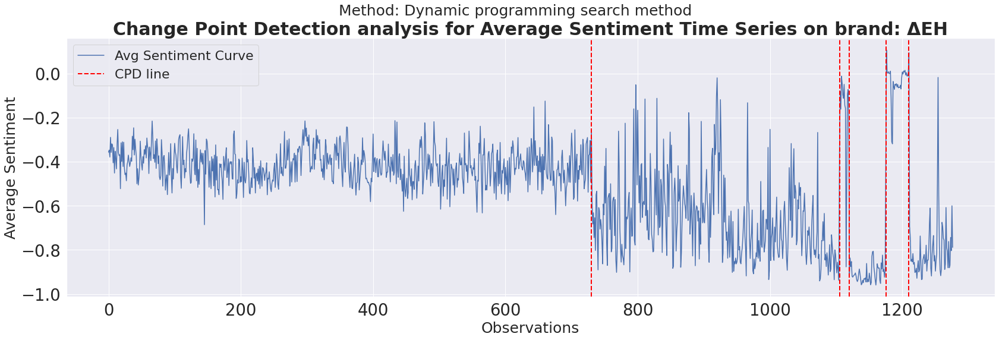

In [ ]:
plot, df_Dynp_dates, dates, dynp_ts, change_loc_dynp = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[3],6,CPD_Method_Title[3])

##############################################
  Dates of Interest
0        2020-12-31
1        2021-07-24
2        2022-01-10
3        2022-01-25
4        2022-03-21
5        2022-04-25
6        2022-06-30
##############################################


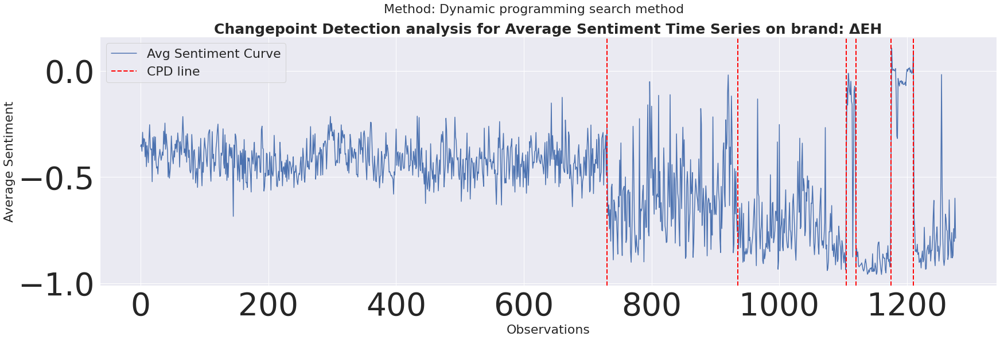

In [ ]:

plot, df_Dynp_dates, dates, dynp_ts, change_loc_dynp = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[3],7,CPD_Method_Title[3])

##############################################
  Dates of Interest
0        2019-03-27
1        2020-12-31
2        2021-07-24
3        2021-10-27
4        2021-11-21
5        2022-01-10
6        2022-01-25
7        2022-03-21
8        2022-04-25
9        2022-06-30
##############################################


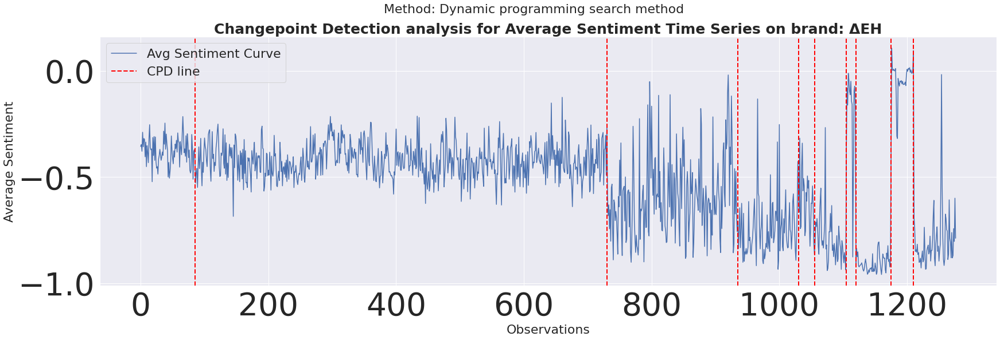

In [ ]:
plot, df_Dynp_dates, dates, dynp_ts, change_loc_dynp = change_point_detection(df_dei, df_dei.query_name.value_counts().index[0],CPD_Method[3],10,CPD_Method_Title[3])

In [ ]:
Exact_solutions, Approximations = extract_all_dates(df_PELT_dates,df_binseg_dates,df_Window_dates,df_Dynp_dates)

In [ ]:
def plot_ensemble_methods(brand_name):
  params = {
    'axes.titlesize': 25,
    'axes.labelsize': 12,
    'axes.titleweight':'bold'}
  def plot_change_points(ts,ts_change_loc):
    plt.figure(figsize=(28,8))
    plt.rcParams.update(params)
    plt.rcParams['font.size'] = '16'
    plt.title(f"Change Point Detection analysis for Average Sentiment Time Series curve on brand: {brand_name}",fontsize=30)
    plt.suptitle("Method: Ensemble the Exacts Methods, Pelt and Dynamic Programming",fontsize=25)
    plt.plot(ts)
    sns.set(font_scale=3)
    for x in ts_change_loc:
      plt.axvline(x,lw=2, color='red',linestyle='dashed')

    plt.ylabel('Average Sentiment', fontsize=25)
    plt.xlabel('Observations',fontsize=25)
    plt.legend(['Avg Sentiment Curve','CPD line'],fontsize=22)
  return(plot_change_points(dynp_ts, list(set(change_loc_pelt) & set(change_loc_dynp))))

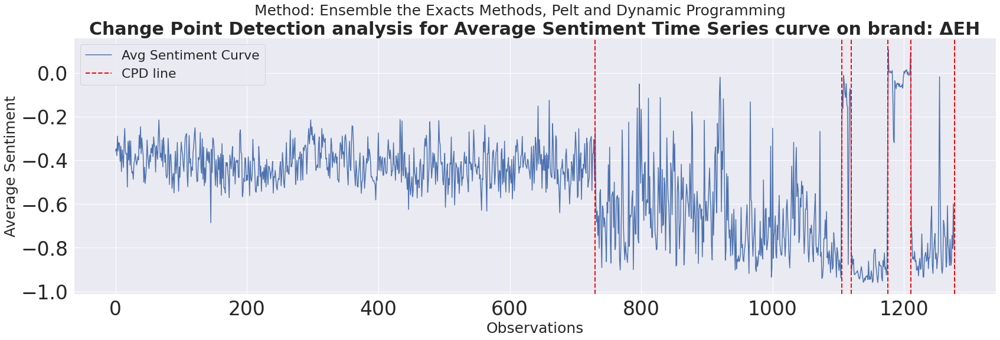

In [ ]:
plot_ensemble_methods(df_dei.query_name.value_counts().index[0])

# Phase 3

## LDA Topic Modelling on Change point dates and Practice


### install libraries

In [ ]:
pip uninstall nltK


Found existing installation: nltk 3.8.1
Uninstalling nltk-3.8.1:
  Would remove:
    /usr/local/bin/nltk
    /usr/local/lib/python3.10/dist-packages/nltk-3.8.1.dist-info/*
    /usr/local/lib/python3.10/dist-packages/nltk/*
Proceed (Y/n)? Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/uninstall.py", line 105, in run
    uninstall_pathset = req.uninstall(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/req/req_install.py", line 680, in uninstall
    uninstalled_pathset.remove(auto_confirm, verbose)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/req/req_uninstall.py", line 375, in remove
    if auto_confirm or self._allowed_to_proceed(verbose):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/req/req_uninstall.py", line 415, in _allowed_to_procee

In [ ]:
pip install -U nltk

In [ ]:
pip install pyLDAvis==2.1.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97718 sha256=2944e2998d0a1681e4f6d4585555410bd3491bcb0b510c684a43ce24bad4866a
  Stored in directory: /root/.cache/pip/wheels/d9/93/d6/16c95da19c32f037fd75135ea152d0df37254c25cd1a8b4b6c
Successfully built pyLDAvis


In [ ]:
pip install adjustText

In [ ]:
pip install colorama

In [ ]:
pip install stopwordsiso

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 2.9 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade gensim

In [ ]:
!python -m spacy download el_core_news_sm

2023-09-13 15:34:06.906178: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-13 15:34:07.923485: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 65.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [ ]:
!pip install gensim==4.1.0

  Using cached gensim-4.1.0.tar.gz (23.2 MB)
  Preparing metadata (setup.py) ... done
  Created wheel for gensim: filename=gensim-4.1.0-cp310-cp310-linux_x86_64.whl size=25996762 sha256=124cc5b1f91a090235c81a6824cd502d8c375b2133f8b790ac8c6f2e353fb963
  Stored in directory: /root/.cache/pip/wheels/9c/bf/07/ff115a906f00f4538a66ababeeca5f87275e6de03889c077ff
Successfully built gensim
  Attempting uninstall: gensim
    Found existing installation: gensim 4.3.2
    Uninstalling gensim-4.3.2:
      Successfully uninstalled gensim-4.3.2


In [ ]:
pip install annoy

  Using cached annoy-1.17.3.tar.gz (647 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=551931 sha256=77edbb119d69d4b6f228a9d7faa6eafa665891a2a990c82877e006a4cb62e501
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy


### import libraries and modules

In [ ]:
import nltk
import gensim
from gensim.test.utils import common_texts
from gensim.corpora.dictionary import Dictionary
from sklearn.decomposition import LatentDirichletAllocation
#from __future__ import division
from nltk.corpus import stopwords
import spacy
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import pyLDAvis
import stopwordsiso as stopwords
from pprint import pprint
import warnings
import pyLDAvis.gensim
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from matplotlib import pyplot
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import matplotlib.colors as mcolors
from gensim.similarities.annoy import AnnoyIndexer
import gensim.models
from colorama import Fore, Style
from adjustText import adjust_text
import plotly
import plotly.graph_objs as go




warnings.filterwarnings("ignore",category=DeprecationWarning)

pyLDAvis.enable_notebook()

In [ ]:
nltk.download("stopwords")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

### Functions

#### Functions to extract Dates of Interest and prepare the corpus from tweets, respectively, for topic modelling

**Without retweets**

In [ ]:
# Extraction of dates of interest tweets
def extract_dates_of_interest(dataset, which_brand, start_date, end_date):
  dataset = dataset.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True) # drop dublicates and keep the usefull columnds set index the date
  brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
  df_brand_with_dates = brand[((brand['date'] >= pd.to_datetime(start_date).date()) & (brand['date'] < pd.to_datetime(end_date).date()))]
  return(df_brand_with_dates)
# Extraction of dates after the event in order to compare best words from topics after LDA
def extract_dates_after_event(dataset, which_brand, start_date, end_date):
  dataset = dataset.drop_duplicates(subset = ['date', 'text'], keep = 'last').reset_index(drop = True) # drop dublicates and keep the usefull columnds set index the date
  brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
  df_brand_with_dates = brand[((brand['date'] >= pd.to_datetime(start_date).date()) & (brand['date'] < pd.to_datetime(end_date).date()))]
  return(df_brand_with_dates)

**With retweets**

In [ ]:
# # Extraction of dates of interest tweets with retweet
# def extract_dates_of_interest(dataset, which_brand, start_date, end_date):
#   dataset = dataset[['date','query_name', 'text',"createdate",'sentiment_polarity']]#.reset_index(drop = True) # drop dublicates and keep the usefull columnds set index the date
#   brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
#   df_brand_with_dates = brand[((brand['date'] >= pd.to_datetime(start_date).date()) & (brand['date'] < pd.to_datetime(end_date).date()))]
#   return(df_brand_with_dates)

# # Extraction of dates after the event in order to compare best words from topics after LDA
# def extract_dates_after_event(dataset, which_brand, start_date, end_date):
#   dataset = dataset[['date','query_name', 'text',"createdate",'sentiment_polarity']]#.reset_index(drop = True) # drop dublicates and keep the usefull columnds set index the date
#   brand = dataset[dataset.query_name == which_brand].sort_values('date').drop(["createdate"], axis=1)
#   df_brand_with_dates = brand[((brand['date'] >= pd.to_datetime(start_date).date()) & (brand['date'] < pd.to_datetime(end_date).date()))]
#   return(df_brand_with_dates)

#### Function to preprocess and clean the corpus

In [ ]:
# prepare the corpus
def corpus_preparation(dataset):
  #stop_words = stopwords.stopwords('el')
  stop_words_corp = stopwords.stopwords('el')
  stop_words_corp = stop_words_corp.union(set(['γιατι', 'δεη', ' γιατι', ' γιατί','γιατί', ' γιατι ','ειπε','δειτε','ηρθε','πηγε','πεις','πας','δεις','ειδα','   λεει','λεει', 'λεει', 'λεει ', ' λεει', ' λεει ', 'λεμε', ' λεμε']))

  reports  = dataset
  removal= ['ADV','PRON','CCONJ','PUNCT','PART','DET','ADP','SPACE', 'NUM', 'SYM', 'VERB']
  tokens = []
  nlp = spacy.load("el_core_news_sm")

  for summary in nlp.pipe(reports['text']):
    proj_tok = [token.lemma_.lower() for token in summary if token.pos_ not in removal and not token.is_stop and token.is_alpha]
    tokens.append(proj_tok)

# Add tokens to new column
  reports['tokens'] = tokens

  data = reports['tokens'].astype('str')
  # Remove Emails
  data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

  # Remove new line characters
  data = [re.sub('\s+', ' ', sent) for sent in data]

  # Remove distracting single quotes
  data = [re.sub("\'", "", sent) for sent in data]
  data = [re.sub("γιατι", "", sent) for sent in data]
  def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

  data_words = list(sent_to_words(data))
  bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
  trigram = gensim.models.Phrases(bigram[data_words], threshold=100)
# Faster way to get a sentence clubbed as a trigram/bigram
  bigram_mod = gensim.models.phrases.Phraser(bigram)
  trigram_mod = gensim.models.phrases.Phraser(trigram)

  def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words_corp] for doc in texts]

  def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

  def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

  def lemmatization(texts, allowed_postags=['NOUN','ADJ','VERB','ADV']):
    """https://spacy.io/api/annotation"""
    nlp = spacy.load("el_core_news_sm")
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent))
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out
  # Remove Stop Words
  data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
  data_words_bigrams = make_bigrams(data_words_nostops)
  # Initialize spacy 'el_core_news_sm' model, keeping only tagger component (for efficiency)

# Do lemmatization keeping only noun
  data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN','ADJ','VERB','ADV'])
  # Create Dictionary

  id2word = corpora.Dictionary(data_lemmatized)
  id2word.filter_extremes(no_below=5, no_above=0.5, keep_n=50000)
# Create Corpus
  texts = data_lemmatized

# Term Document Frequency
  corpus = [id2word.doc2bow(text) for text in texts]
  return(corpus, id2word, data_lemmatized)

#### Function to build the LDA Model and visualize the topics

In [ ]:
# creation of lda model and visualize the produced topics
def LDA_model_and_Visualization(Corpus, Id2word, Nunmber_of_topics, number_of_passes):
  LDA_model = gensim.models.ldamodel.LdaModel(corpus=Corpus,
                                           id2word=Id2word,
                                           num_topics=Nunmber_of_topics,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=300,
                                           passes=number_of_passes,
                                           alpha='auto',
                                           per_word_topics=True)
  pyLDAvis.enable_notebook()

  visualization = pyLDAvis.gensim.prepare(LDA_model, Corpus, Id2word)

  return(LDA_model, LDA_model.print_topics(),visualization)

### Extract the dates

In [ ]:
#first event exploration
# brand_dei_first_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2020-12-26', '2020-12-30')
# brand_dei_check_after_event = extract_dates_after_event(df_dei, df_dei.query_name.value_counts().index[0], '2020-12-30', '2021-01-03')
#third event exploration
# brand_dei_third_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-03-17', '2022-03-20')
# brand_dei_check_after_third_event = extract_dates_after_event(df_dei, df_dei.query_name.value_counts().index[0], '2022-03-20', '2022-03-22')
#fourth event exploration

brand_dei_fourth_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-19', '2022-04-26')
brand_dei_check_after_fourt_event = extract_dates_after_event(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-26', '2022-05-02')

#brand_netflix_fourth_event = extract_dates_of_interest(df_cosmote, df_cosmote.query_name.value_counts().index[0], '2022-04-19', '2022-04-26')
#brand_netflix_check_after_fourt_event = extract_dates_after_event(df_cosmote, df_cosmote.query_name.value_counts().index[0], '2022-04-26', '2022-05-02')

In [ ]:
brand_dei_fourth_event

,text,tag,sentiment,query_name,channel,sentiment_polarity,date,dataset
382367,"ΤΟ ΔΙΑΧΡΟΝΙΚΟ ΣΚΑΝΔΑΛΟ ΔΙΑΛΥΣΗΣ, ΕΞΑΡΘΡΩΣΗΣ ΚΑ...",Εξυγείανση/Πώληση,neutral,ΔΕΗ,twitter,0,2022-04-19,Electrical_Energy
335053,Πληρώσαμε τη #ΔΕΗ δεν έχουμε ούτε για φαγητό ο...,Βλάβες,neutral,ΔΕΗ,twitter,0,2022-04-19,Electrical_Energy
146129,Στην τελική ευθεία για τον ΔΕΗ Ποδηλατικό Γύρο...,Χορηγίες,positive,ΔΕΗ,twitter,1,2022-04-19,Electrical_Energy
288418,Μου ήρθε ο #λογαριασμός της #ΔΕΗ. Βρήκα σε έν...,Λογαριασμοί (γενικό),neutral,ΔΕΗ,twitter,0,2022-04-19,Electrical_Energy
304433,ΔΕΗ: Τρίτεκνος πατέρας έλαβε λογαριασμό 3.051 ...,Λογαριασμοί (γενικό),neutral,ΔΕΗ,twitter,0,2022-04-19,Electrical_Energy
...,...,...,...,...,...,...,...,...
293068,Έχεις δίκαιο. Πρώτος πρέπει να φύγεις εσύ. Μετ...,Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,0,2022-04-25,Electrical_Energy
348334,Θα αναψω και τα φωτα στις βεράντες. Αυτο το αν...,NaN,neutral,ΔΕΗ,twitter,0,2022-04-25,Electrical_Energy
22919,Καλά όλοι αυτοί βρήκαν λεφτά να πληρώσουν την ...,Λογαριασμοί (γενικό),neutral,ΔΕΗ,twitter,0,2022-04-25,Electrical_Energy
342510,#Κιλκίς 🌱Ξεκινά η υπογείωση καλωδίων της #ΔΕΗ ...,Έργα,neutral,ΔΕΗ,twitter,0,2022-04-25,Electrical_Energy


In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-23', '2022-04-24')
brand_dei_event_eda_after = extract_dates_after_event(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-26', '2022-04-27')

In [ ]:
brand_dei_first_eventbrand_dei_fourth_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-01-23', '2022-01-24')


## Brand Dei EDA on Change point dates from DEI Dataset

### EDA on 24/04/2022 after Eda the actual date is **26-04-2022**

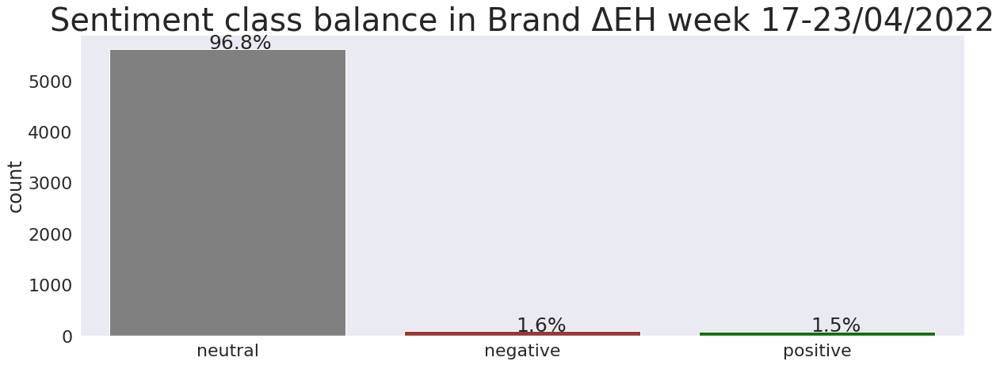

In [ ]:
brand_dei_first_eventbrand_dei_fourth_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-17', '2022-04-24')
extract_sentiment_balance("Brand ΔΕΗ week 17-23/04/2022", brand_dei_first_eventbrand_dei_fourth_event, False)

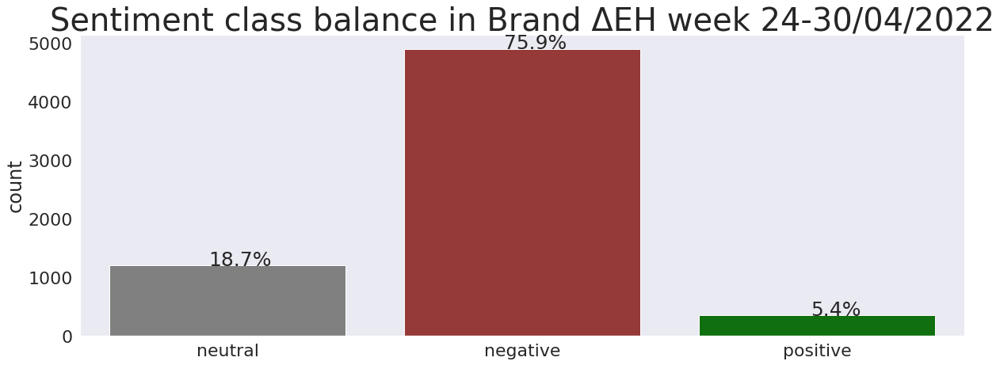

In [ ]:
brand_dei_first_eventbrand_dei_fourth_event = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-24', '2022-04-30')
extract_sentiment_balance("Brand ΔΕΗ week 24-30/04/2022", brand_dei_first_eventbrand_dei_fourth_event, False)

**EDA FOR 24-04-2022 change point date**

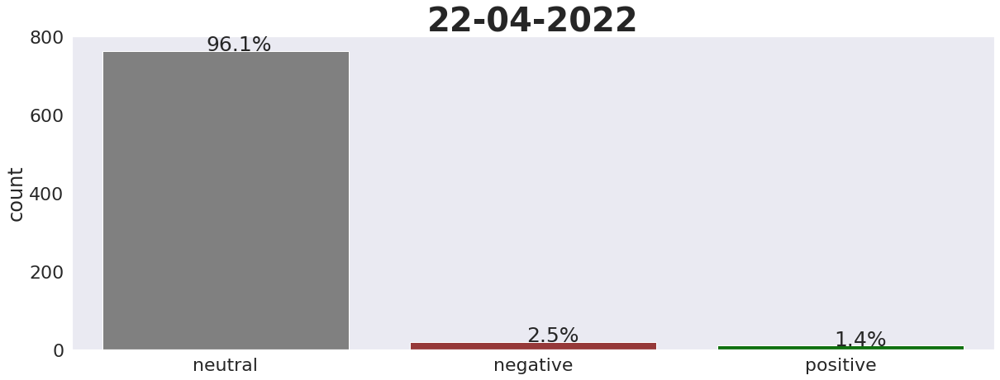

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-22', '2022-04-23')
extract_sentiment_balance("22-04-2022", brand_dei_event_eda, False)

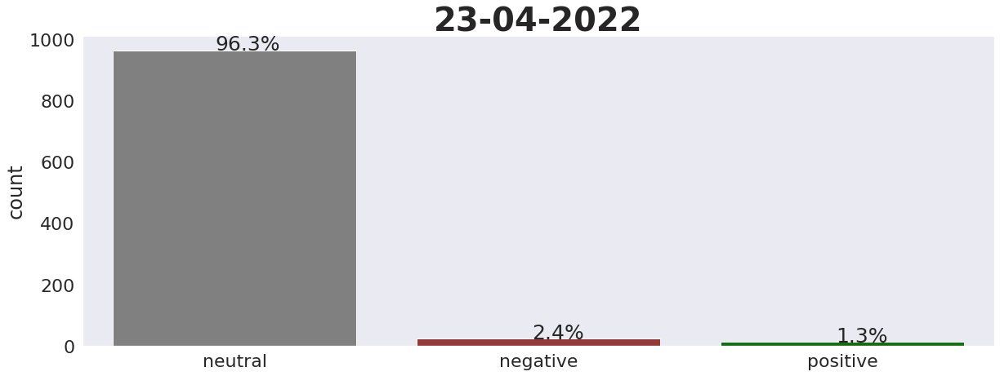

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-23', '2022-04-24')
extract_sentiment_balance("23-04-2022", brand_dei_event_eda, False)

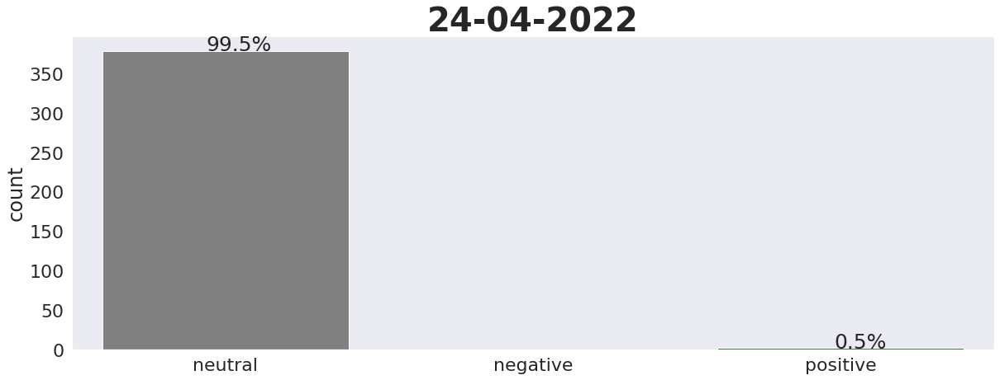

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-24', '2022-04-25')
extract_sentiment_balance("24-04-2022", brand_dei_event_eda, False)

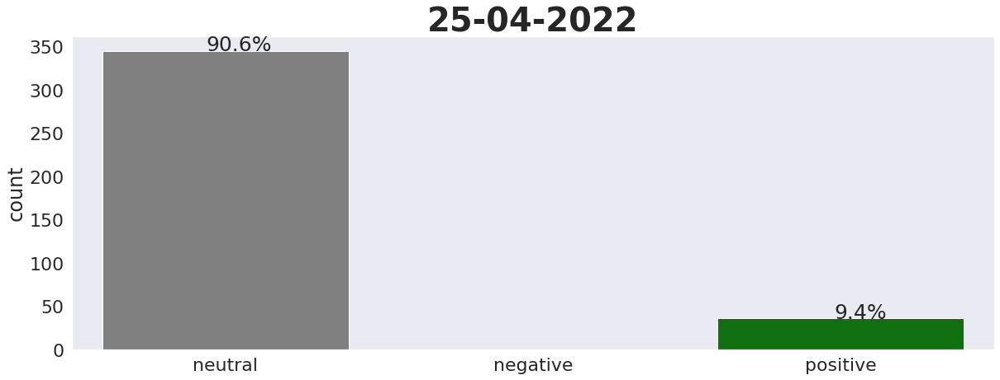

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-25', '2022-04-26')
extract_sentiment_balance("25-04-2022", brand_dei_event_eda, False)

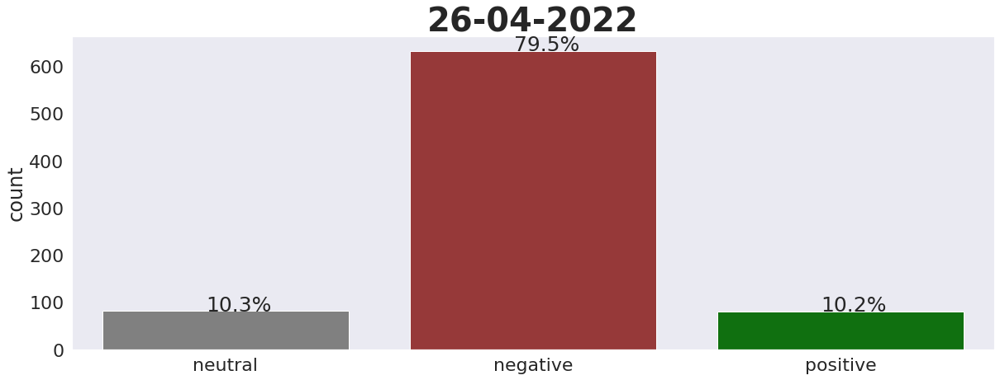

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-26', '2022-04-27')
extract_sentiment_balance("26-04-2022", brand_dei_event_eda, False)

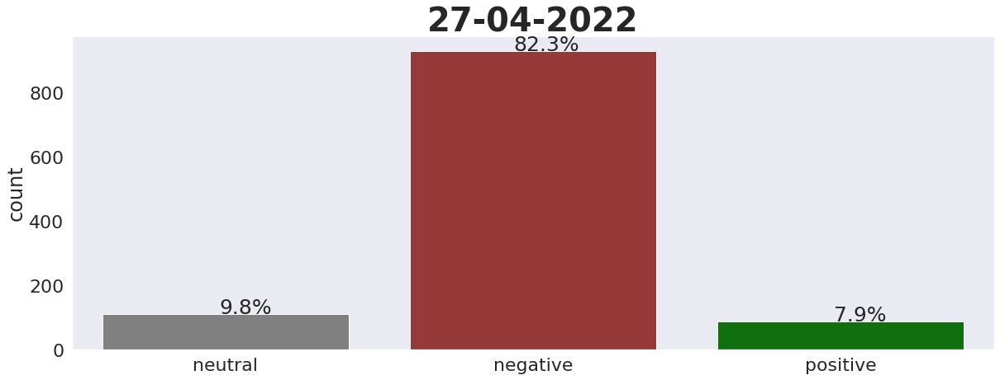

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-27', '2022-04-28')
extract_sentiment_balance("27-04-2022", brand_dei_event_eda, False)

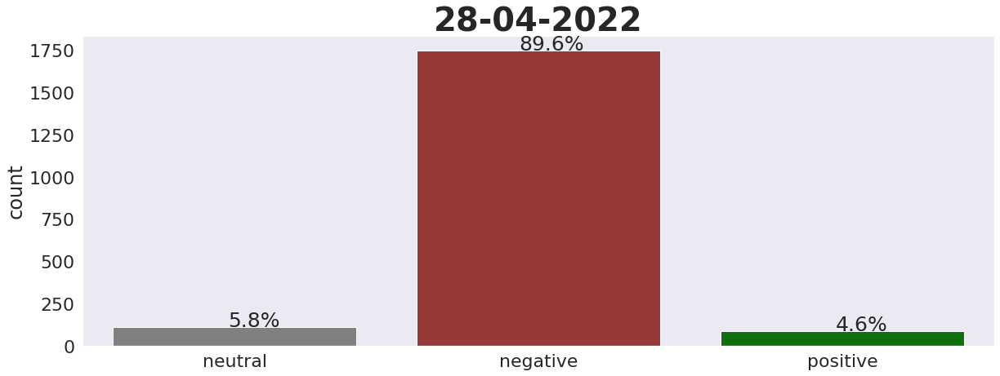

In [ ]:
brand_dei_event_eda = extract_dates_of_interest(df_dei, df_dei.query_name.value_counts().index[0], '2022-04-28', '2022-04-29')
extract_sentiment_balance("28-04-2022", brand_dei_event_eda, False)

## Preprocessing of the given dataset

In [ ]:
brand_dei_fourth_event

In [ ]:
#corp_begin, id2word_begin, data_lemmatized_begin = corpus_preparation(brand_dei_first_event)
#corp_end, id2word_end, data_lemmatized_end = corpus_preparation(brand_dei_check_after_event)

# corp_begin, id2word_begin, data_lemmatized_begin = corpus_preparation(brand_dei_third_event)
# corp_end, id2word_end, data_lemmatized_end = corpus_preparation(brand_dei_check_after_third_event)

corp_begin, id2word_begin, data_lemmatized_begin = corpus_preparation(brand_dei_fourth_event)
corp_end, id2word_end, data_lemmatized_end = corpus_preparation(brand_dei_check_after_fourt_event)

# Baseline model based on Hashtag dataset

In [ ]:
#Hashtag dataset preparation
corp_hashtag, id2word_hashtag, data_lemmatized_hashtag = corpus_preparation(df_hashtag_dei)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
model_hashtag, produced_topics_hashtag, topics_visualization_hashtag=LDA_model_and_Visualization(corp_hashtag, id2word_hashtag, 10, 100)


/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:232: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  head(R).drop('saliency', 1)


In [ ]:
from gensim.test.utils import datapath
from gensim import  models
from google.colab import drive
drive.mount('/content/drive')
temp_file_hashtag = datapath("/content/drive/MyDrive/model_hashtag")
#temp_file_hashtag_20 = datapath("/content/drive/MyDrive/model_hashtag")
#save model
#model_hashtag.save(temp_file_hashtag)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
model_hashtag.save(temp_file_hashtag)
#model_hashtag.save(temp_file_hashtag_20)

In [ ]:
# load model
#model_hashtag = models.ldamodel.LdaModel.load(temp_file_hashtag_20)
model_hashtag = models.ldamodel.LdaModel.load(temp_file_hashtag)

In [ ]:
visualization = pyLDAvis.gensim.prepare(model_hashtag, corp_hashtag, id2word_hashtag)

In [ ]:
visualization

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.455828  0.000228       1        1  26.408599
6      0.049611 -0.428108       2        1  10.493210
8      0.054255  0.090544       3        1   9.887919
1      0.046593  0.139438       4        1   9.558962
9      0.047186  0.073062       5        1   9.176471
4      0.053516  0.034220       6        1   8.177506
0      0.051596  0.025759       7        1   7.447630
5      0.051909  0.023293       8        1   6.947662
2      0.053042  0.023751       9        1   6.589327
3      0.048119  0.017812      10        1   5.312715, topic_info=             Term         Freq        Total Category  logprob  loglift
64    λογαριασμος  8694.000000  8694.000000  Default  30.0000  30.0000
48          ρευμα  9956.000000  9956.000000  Default  29.0000  29.0000
2552     ακριβεια  6311.000000  6311.000000  Default  28.0000  28.0000
88       ενεργεια  4543.000000  4543.000000  Default  27.0000  27.0000
262     μητσοτακη  4283.000000  4283.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
154      εβδομαδα   187.945121   188.985244  Topic10  -4.8146   2.9295
1995    εκπτωσεις   173.302600   174.342701  Topic10  -4.8957   2.9291
1299      πολιτος   159.225796   160.265889  Topic10  -4.9805   2.9286
1528  φουσκωμενος   155.531473   156.571603  Topic10  -5.0039   2.9284
7353        efood   144.595760   145.635850  Topic10  -5.0768   2.9279

[330 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
808       8  0.997784  agriesmelisses
963       7  0.997910           bonus
7353     10  0.995634           efood
1481     10  0.995706    fosstotounel
6381      5  0.998427       fuel_pass
...     ...       ...             ...
510       4  0.997078           χρονο
223       1  0.999354          χρονος
301       1  0.999690            χωρα
2891      7  0.995779       ψηφοφορος
637       7  0.999176             ωρα

[300 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 7, 9, 2, 10, 5, 1, 6, 3, 4])

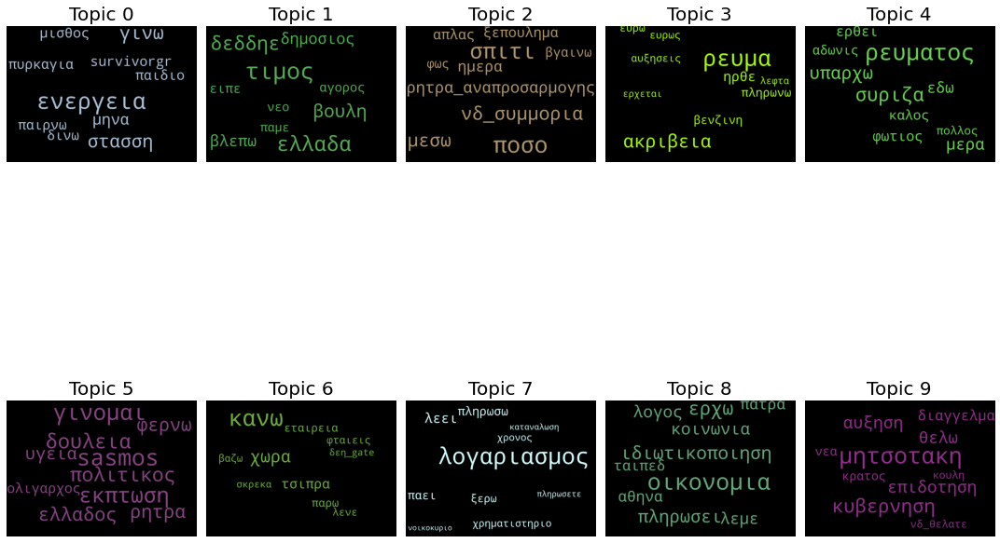

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stopwords.stopwords('el'),
                  background_color='black',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = model_hashtag.show_topics(formatted=False, num_topics=40)

fig, axes = plt.subplots(2, 5, figsize=(15,15), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=20))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
num_of_words_in_topc=20
topic_words=[]
for topic in range(num_of_words_in_topc):
  for row in range(10):
    topic_words.append(model_hashtag.show_topic(topic, topn=10)[row][0])

In [ ]:
topics=[ topic_words[:10], topic_words[10:20], topic_words[20:30], topic_words[30:40], topic_words[40:50],
        topic_words[50:60], topic_words[60:70], topic_words[70:80], topic_words[80:90], topic_words[90:100],
        topic_words[100:110], topic_words[110:120], topic_words[120:130], topic_words[130:140], topic_words[140:150],
        topic_words[150:160], topic_words[160:170], topic_words[170:180], topic_words[180:190], topic_words[190:200]
        ]

In [ ]:
# word embedding space before event
model_hash = gensim.models.Word2Vec(sentences=data_lemmatized_hashtag, window=4, min_count=4, workers=4)
word_vectors_hashtag_dataset = model_hash.wv

In [ ]:
def centroid_calculation(topic_w):
  centroid_calc = np.average([word_vectors_hashtag_dataset[w] for w in  topic_w], axis=0)
  centroid = word_vectors_hashtag_dataset.similar_by_vector(centroid_calc)
  return centroid

In [ ]:
## calculate centroid for 10 top words
topic1_centroid = centroid_calculation(topic_words[:10])
topic2_centroid = centroid_calculation(topic_words[10:20])
topic3_centroid = centroid_calculation(topic_words[20:30])
topic4_centroid = centroid_calculation(topic_words[30:40])
topic5_centroid = centroid_calculation(topic_words[40:50])
topic6_centroid = centroid_calculation(topic_words[50:60])
topic7_centroid = centroid_calculation(topic_words[60:70])
topic8_centroid = centroid_calculation(topic_words[70:80])
topic9_centroid = centroid_calculation(topic_words[80:90])
topic10_centroid = centroid_calculation(topic_words[90:100])
topic11_centroid = centroid_calculation(topic_words[100:110])
topic12_centroid = centroid_calculation(topic_words[110:120])
topic13_centroid = centroid_calculation(topic_words[120:130])
topic14_centroid = centroid_calculation(topic_words[130:140])
topic15_centroid = centroid_calculation(topic_words[140:150])
topic16_centroid = centroid_calculation(topic_words[150:160])
topic17_centroid = centroid_calculation(topic_words[160:170])
topic18_centroid = centroid_calculation(topic_words[170:180])
topic19_centroid = centroid_calculation(topic_words[180:190])
topic20_centroid = centroid_calculation(topic_words[190:200])

In [ ]:
topics = list([topic1_centroid,topic2_centroid,topic3_centroid,topic4_centroid,topic5_centroid,topic6_centroid,topic7_centroid,topic8_centroid,topic9_centroid,topic10_centroid,topic11_centroid,topic12_centroid,topic13_centroid,topic14_centroid,
              topic15_centroid,topic16_centroid,topic17_centroid,topic18_centroid,topic19_centroid,topic20_centroid])

In [ ]:
most_similar_centroid_df_hashtag = pd.DataFrame([topic1_centroid[0][0],topic2_centroid[0][0],topic3_centroid[0][0],topic4_centroid[0][0],topic5_centroid[0][0],topic6_centroid[0][0],topic7_centroid[0][0],topic8_centroid[1][0],topic9_centroid[0][0],topic10_centroid[0][0],
                                                 topic11_centroid[0][0], topic12_centroid[0][0], topic13_centroid[0][0],topic14_centroid[0][0],topic15_centroid[0][0],topic16_centroid[0][0],topic17_centroid[0][0],topic18_centroid[0][0],topic19_centroid[0][0],topic20_centroid[0][0]])
most_similar_centroid_df_hashtag.rename(columns = {0 : 'ceontroid_word'}, inplace = True)
most_similar_centroid_df_hashtag.drop_duplicates(ignore_index=True,inplace=True)

In [ ]:
most_similar_centroid_df_hashtag

,ceontroid_word
0,ενεργεια
1,ακριβεια
2,λογαριασμος
3,στασση
4,χρονος
5,επιπτωση
6,αντικειμενικος
7,λογικος
8,προτεραιοτητα
9,καταρρευση


## EDA on word representatives sentiment for *baseline*

In [ ]:
df_hashtag_dei

,text,sentiment_polarity,tokens
9,#καλές_οι_120_δόσεις_αρκεί_να_βρεις_τα_χρήματα...,0,"[δόσεις, δεη, δόσεις, νερό, ασφάλειεςς, ενφια,..."
19,"Διελυσαν, ρημαξαν κ κομματιασαν τη ΔΕΗ για ν ...",-1,"[δεη, αδηφαγος, εργολαβος, κομματι, ψιχουλα, σ..."
29,Μειώνεται το αφορολογητο με αποτέλεσμα αυξήσε...,-1,"[αφορολογητος, αποτέλεσμα, αυξήσεις, φόρος, μι..."
40,Τώρα στην #Βουλη σφυροκόπημα από @SFamellos σ...,-1,"[βουλη, σφυροκόπημα, δεη, τιμολόγια, καταναλωτ..."
50,#ΕΠΙΧΕΙΡΗΣΕΙΣ Παγώνει η ΔΕΗ την επιβάρυνση κατ...,-1,"[επιχειρησεις, δεη, επιβάρυνση, καταναλωτών, έ..."
...,...,...,...
1536725,Μήπως η εμφάνιση του είναι κόλπο της ΔΕΗ ώστε ...,0,"[εμφάνιση, δεη, τηλεοράσεις, πλαίσιο, οικολογι..."
1536762,ΔΕΗ: Αυξάνονται κατά ένα δισ. οι επενδύσεις (9...,1,"[δεη, επενδύσεις, επιτυχής, αύξηση, κεφαλαίου,..."
1536767,Ρόδος – ΔΕΗ: Επιχειρηματίας κάνει απεργία πείν...,-1,"[ρόδος, δεη, επιχειρηματία, απεργία, πείνα, λο..."
1536775,🤣🤣🤣 Τα νούμερα οι ανιψιές μου εχουν βγει απο ...,0,"[νούμερα, ανιψιές, παράθυρο, λογαριασμός, δεη,..."


In [ ]:
# clean text from punctuation
def sent_to_words(sentences):
  for sentence in sentences:
    yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words_hashtag= list(sent_to_words(df_hashtag_dei.text))

df_hashtag_dei['new_text'] = [" ".join(i) for i in data_words_hashtag]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_hashtag_dei


,text,sentiment_polarity,tokens,new_text
9,#καλές_οι_120_δόσεις_αρκεί_να_βρεις_τα_χρήματα...,0,"[δόσεις, δεη, δόσεις, νερό, ασφάλειεςς, ενφια,...",καλες_οι_ δοσεις δεη δοσεις νερο ασφαλειες ενφ...
19,"Διελυσαν, ρημαξαν κ κομματιασαν τη ΔΕΗ για ν ...",-1,"[δεη, αδηφαγος, εργολαβος, κομματι, ψιχουλα, σ...",διελυσαν ρημαξαν κομματιασαν τη δεη για ταισου...
29,Μειώνεται το αφορολογητο με αποτέλεσμα αυξήσε...,-1,"[αφορολογητος, αποτέλεσμα, αυξήσεις, φόρος, μι...",μειωνεται το αφορολογητο με αποτελεσμα αυξησει...
40,Τώρα στην #Βουλη σφυροκόπημα από @SFamellos σ...,-1,"[βουλη, σφυροκόπημα, δεη, τιμολόγια, καταναλωτ...",τωρα στην βουλη σφυροκοπημα απο sfamellos στον...
50,#ΕΠΙΧΕΙΡΗΣΕΙΣ Παγώνει η ΔΕΗ την επιβάρυνση κατ...,-1,"[επιχειρησεις, δεη, επιβάρυνση, καταναλωτών, έ...",επιχειρησεις παγωνει δεη την επιβαρυνση κατανα...
...,...,...,...,...
1536725,Μήπως η εμφάνιση του είναι κόλπο της ΔΕΗ ώστε ...,0,"[εμφάνιση, δεη, τηλεοράσεις, πλαίσιο, οικολογι...",μηπως εμφανιση του ειναι κολπο της δεη ωστε να...
1536762,ΔΕΗ: Αυξάνονται κατά ένα δισ. οι επενδύσεις (9...,1,"[δεη, επενδύσεις, επιτυχής, αύξηση, κεφαλαίου,...",δεη αυξανονται κατα ενα δισ οι επενδυσεις δισ ...
1536767,Ρόδος – ΔΕΗ: Επιχειρηματίας κάνει απεργία πείν...,-1,"[ρόδος, δεη, επιχειρηματία, απεργία, πείνα, λο...",ροδος δεη επιχειρηματιας κανει απεργια πεινας ...
1536775,🤣🤣🤣 Τα νούμερα οι ανιψιές μου εχουν βγει απο ...,0,"[νούμερα, ανιψιές, παράθυρο, λογαριασμός, δεη,...",τα νουμερα οι ανιψιες μου εχουν βγει απο τα πα...


In [ ]:
def extract_representatives_subset(dataframe, word_to_find):
  df_word_sentiment_exploration = dataframe.loc[dataframe.new_text.str.contains(word_to_find)]
  return df_word_sentiment_exploration

In [ ]:
def retrieve_representatives_sentiment(dataframe, word):
  average = extract_representatives_subset(dataframe, word)['sentiment_polarity'].mean()
  avg_sent = round(average,2)
  return avg_sent

In [ ]:
most_similar_centroid_df_hashtag

,ceontroid_word
0,ενεργεια
1,ακριβεια
2,λογαριασμος
3,στασση
4,χρονος
5,επιπτωση
6,αντικειμενικος
7,λογικος
8,προτεραιοτητα
9,καταρρευση


In [ ]:
input_word = ['ενεργεια', 'ακριβεια', 'λογαριασμος', 'στασση','χρονος','επιπτωση','αντικειμενικος','λογικος','προτεραιοτητα','καταρρευση','λαθος','αντιπολιτευση','εισοδημα','μεγαβατωρα']


In [ ]:
representative1_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[0])
representative2_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[1])
representative3_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[2])
representative4_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[3])
representative5_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[4])
representative6_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[5])
representative7_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, 'αντικειμ')
representative8_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[7])
representative9_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[8])
representative10_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[9])
representative11_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[10])
representative12_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[11])
representative13_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[12])
representative14_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[13])


In [ ]:
baseline_representatives_sentiment = pd.DataFrame({'baseline_representatives':[input_word[0], input_word[1], input_word[2], input_word[3], input_word[4], input_word[5], input_word[6], input_word[7], input_word[8], input_word[9],
                                                                               input_word[10],input_word[11],input_word[12],input_word[13]],
              'avg_sentiment':[representative1_sentiment, representative2_sentiment, representative3_sentiment, representative4_sentiment, representative5_sentiment, representative6_sentiment, representative7_sentiment, representative8_sentiment,
                               representative9_sentiment, representative10_sentiment, representative11_sentiment, representative12_sentiment, representative13_sentiment, representative14_sentiment]})

In [ ]:
baseline_representatives_sentiment

,baseline_representatives,avg_sentiment
0,ενεργεια,-0.45
1,ακριβεια,-0.65
2,λογαριασμος,-0.71
3,στασση,-0.59
4,χρονος,-0.50
5,επιπτωση,-0.33
6,αντικειμενικος,-0.57
7,λογικος,-0.73
8,προτεραιοτητα,-0.33
9,καταρρευση,-0.67


In [ ]:
def final_sent(avg_sentiment):
    if avg_sentiment <= -0.34:
        return -1
    else:
        return 0

baseline_representatives_sentiment['normalized_avg_sent'] = baseline_representatives_sentiment.avg_sentiment.apply(final_sent)

In [ ]:
baseline_representatives_sentiment

,baseline_representatives,avg_sentiment,normalized_avg_sent
0,ενεργεια,-0.45,-1
1,ακριβεια,-0.65,-1
2,λογαριασμος,-0.71,-1
3,στασση,-0.59,-1
4,χρονος,-0.50,-1
5,επιπτωση,-0.33,0
6,εκπτωση_συνεπεις,-0.53,-1
7,λογικος,-0.73,-1
8,προτεραιοτητα,-0.33,0
9,καταρρευση,-0.67,-1


## Baseline topic represenatives analysis

In [ ]:
input_word = ['ενεργεια', 'ακριβεια', 'λογαριασμος', 'στασση','χρονος','επιπτωση','αντικειμενικος','λογικος','προτεραιοτητα','καταρρευση','λαθος','αντιπολιτευση','εισοδημα','μεγαβατωρα']
sentiment_color = ['grey','red','green']
color_list = ['violet','blue','brown','olive','yellow','black','pink','turquoise','orange', 'purple', 'yellowgreen', 'orchid','salmon', 'seagreen']
def prepare_vis(giv_word):
  def append_list(sim_words, words):
    list_of_words = []
    for i in range(len(sim_words)):
      sim_words_list = list(sim_words[i])
      sim_words_list.append(words)
      sim_words_tuple = tuple(sim_words_list)
      list_of_words.append(sim_words_tuple)
    return list_of_words


  user_input = [x.strip() for x in giv_word.split(',')]

  result_word = []

  for words in user_input:

    sim_words = word_vectors_hashtag_dataset.most_similar(words, topn = 10)
    sim_words = append_list(sim_words, words)

  result_word.extend(sim_words)

  similar_word = [word[0] for word in result_word]
  similarity = [word[1] for word in result_word]
  similar_word.extend(user_input)
  labels = [word[2] for word in result_word]
  label_dict = dict([(y,x+1) for x,y in enumerate(set(labels))])
  color_map = [label_dict[x] for x in labels]
  return(user_input, result_word, similar_word, similarity, labels, label_dict, color_map)

In [ ]:
def display_tsne_scatterplot_2D(given_word,color,sent_color,how_much_sentiment, model, user_input=None, words=None, label=None, color_map=None, perplexity = 8, learning_rate = 0, iteration = 0, topn=10, sample=500):

    if words == None:
        if sample > 0:
            words = np.random.choice(list(model.index_to_key()), sample)
        else:
            words = [ word for word in model.index_to_key ]

    word_vectors = np.array([model[w] for w in words])


    # For 2D, change the three_dim variable into something like two_dim like the following:
    two_dim = TSNE(n_components = 2, random_state=0, perplexity = perplexity, learning_rate = learning_rate, n_iter = iteration).fit_transform(word_vectors)[:,:2]

    data = []


    count = 0
    if (given_word == user_input[0] or given_word == user_input[1] or given_word == user_input[2] or given_word == user_input[3] or given_word == user_input[4] or given_word == user_input[5] or given_word == user_input[6]
        or given_word == user_input[7] or given_word == user_input[7] or given_word == user_input[8] or given_word == user_input[9] or given_word == user_input[10] or given_word == user_input[11] or given_word == user_input[12]
        or given_word == user_input[13] or given_word == user_input[14]):
      for i in range (len(user_input)):

                trace = go.Scatter(
                    x = two_dim[count:count+topn,0],
                    y = two_dim[count:count+topn,1],
                    text = words[count:count+topn],
                    name = user_input[i],
                    textposition = "top center",
                    textfont_size = 30,
                    mode = 'markers+text',
                    marker = {
                        'size': 10,
                        'opacity': 1,
                        'color': color
                    }

                )

                # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable. Also, instead of using
                # variable three_dim, use the variable that we have declared earlier (e.g two_dim)

                data.append(trace)
                count = count+topn

    trace_input = go.Scatter(
                    x = two_dim[count:,0],
                    y = two_dim[count:,1],
                    text = words[count:],
                    name = 'Topic Representative',
                    textposition = "top right",
                    textfont_size = 40,
                    mode = 'markers+text',
                    marker = {
                        'size': 30,
                        'opacity': how_much_sentiment,
                        'color': sent_color
                    }
                    )

    # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable.  Also, instead of using
    # variable three_dim, use the variable that we have declared earlier (e.g two_dim)
    data.append(trace_input)

# Configure the layout

    layout = go.Layout(
        margin = {'l': 0, 'r': 0, 'b': 0, 't': 0},
        showlegend=True,
        legend=dict(
        x=1,
        y=0.5,
        font=dict(
            family="Times New Roman",
            size=35,
            color="black"
        )),
        font = dict(
            family = "Times New Roman",
            size = 20, color="black"),
        autosize = False,
        width = 1300,
        height = 650
        )


    plot_figure = go.Figure(data = data, layout = layout)
    return plot_figure.show()

In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[0])
display_tsne_scatterplot_2D(input_word[0],color_list[0],sentiment_color[1],0.45,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[1])
display_tsne_scatterplot_2D(input_word[1],color_list[1],sentiment_color[1], 0.65,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[2])
display_tsne_scatterplot_2D(input_word[2],color_list[2],sentiment_color[1],0.71,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[3])
display_tsne_scatterplot_2D(input_word[3],color_list[3],sentiment_color[1],0.59,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[4])
display_tsne_scatterplot_2D(input_word[4],color_list[4],sentiment_color[1],0.50,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[5])
display_tsne_scatterplot_2D(input_word[5],color_list[5],sentiment_color[1],0.33,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[6])
display_tsne_scatterplot_2D(input_word[6],color_list[6],sentiment_color[1],0.53,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[7])
display_tsne_scatterplot_2D(input_word[7],color_list[7],sentiment_color[1],0.73,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 13, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[8])
display_tsne_scatterplot_2D(input_word[8],color_list[8],sentiment_color[1],0.33,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[9])
display_tsne_scatterplot_2D(input_word[9],color_list[9],sentiment_color[1],0.67,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[10])
display_tsne_scatterplot_2D(input_word[10],color_list[10],sentiment_color[1],0.65,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[11])
display_tsne_scatterplot_2D(input_word[11],color_list[11],sentiment_color[1],0.67,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[12])
display_tsne_scatterplot_2D(input_word[12],color_list[12],sentiment_color[1],0.57,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[13])
display_tsne_scatterplot_2D(input_word[13],color_list[13],sentiment_color[1],0.50,word_vectors_hashtag_dataset, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



# Summarize the above procedure and apply the folllowing steps <br>

1) Run LDA with (c_v) measure and tune the number of topics. <br>

2) Choose the optimal number of topic based on the highest c_v score, observing also if the given number of topic produce topics with overlapping descriptive words.<br>

3) Visualize with word cloud graph the produced topics an take a intuitively first idea about the quality of the topics by comparing the overlapping on the same words over the topics. <br>

4) Retrieve the top 10 words for each topic
 <br>

5)  For each topic calculate the centroid produced by the top 10 topic word. Pick the closest word to the centroid. This word become the representative of the topic. <br>

6) For the representative word, visualize the Nearest Neighbors before and after the event.



## Step 1: Run LDA with (c_v) measure and tune the number of topics.

In [ ]:
#function
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=2):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word_begin, chunksize = 100, passes = 100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
#model_list, coherence_values = compute_coherence_values(dictionary=id2word_begin, corpus=corp_begin, texts=data_lemmatized_begin, start=2, limit=20, step=2)

## Step 2: Choose the optimal number of topic based on the highest c_v score, observing also if the given number of topic produce topics with overlapping descriptive words.

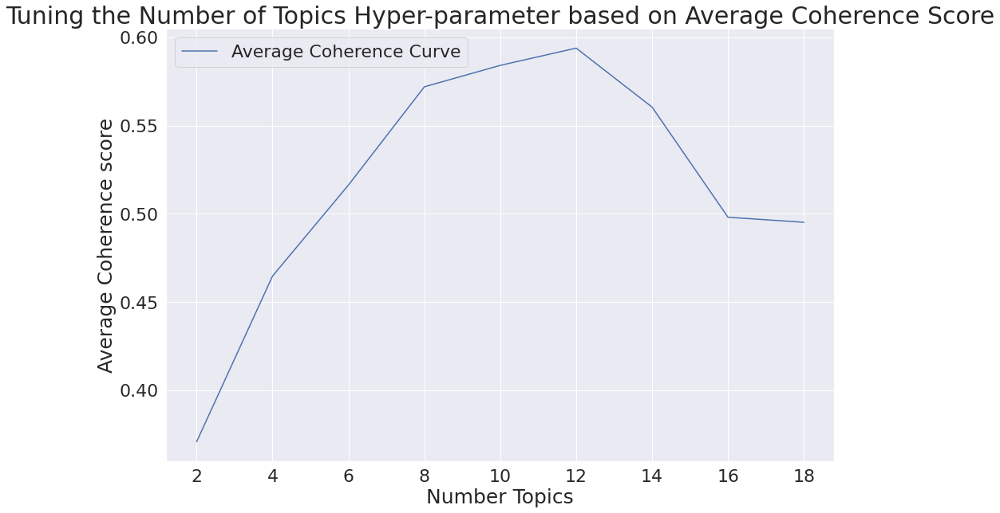

In [ ]:
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.figure(figsize=(15, 10))
sns.set(font_scale=2)
plt.plot(x, coherence_values)
plt.title("Tuning the Number of Topics Hyper-parameter based on Average Coherence Score",fontsize=30)
plt.xlabel("Number Topics", fontsize= 25)
plt.ylabel("Average Coherence score", fontsize= 25)
plt.legend(["Average Coherence Curve"])
plt.show()

## Step 3: Visualize with word cloud graph the produced topics and take an intuitively first view about the quality of the topics by comparing the overlapping on the same words over the topics.

In [ ]:
## BEFORE EVENT
#model_lda_begin_4, produced_topics_begin_4, topics_visualization_begin_4=LDA_model_and_Visualization(corp_begin, id2word_begin, 4, 100)#num topics, passes
#model_lda_begin_6, produced_topics_begin_6, topics_visualization_begin_6=LDA_model_and_Visualization(corp_begin, id2word_begin, 6, 100)#num topics, passes
model_lda_begin_10, produced_topics_begin_10, topics_visualization_begin_10=LDA_model_and_Visualization(corp_begin, id2word_begin, 12, 100)#num topics, passes

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:232: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  head(R).drop('saliency', 1)


In [ ]:
## BEFORE EVENT
topics_visualization_begin_10

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.095713 -0.306147       1        1  11.923822
2      0.303343  0.063986       2        1  10.731750
1      0.200110 -0.081950       3        1  10.423657
3     -0.083952 -0.139854       4        1   9.668198
5     -0.033548 -0.016912       5        1   9.300421
0     -0.081180  0.045868       6        1   8.668814
7     -0.048999 -0.036753       7        1   7.853199
6     -0.123172  0.214070       8        1   7.667961
10    -0.075086 -0.000211       9        1   7.515651
11    -0.125770  0.187352      10        1   6.265951
4      0.145344  0.046578      11        1   5.458459
8      0.018623  0.023972      12        1   4.522117, topic_info=             Term        Freq       Total Category  logprob  loglift
18    λογαριασμος  922.000000  922.000000  Default  30.0000  30.0000
660        στασση  539.000000  539.000000  Default  29.0000  29.0000
32      μητσοτακη  374.000000  374.000000  Default  28.0000  28.0000
34         συριζα  380.000000  380.000000  Default  27.0000  27.0000
280        αυξηση  296.000000  296.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
589      καταντια   11.683696   12.552300  Topic12  -4.5717   3.0245
392          κανε   11.267456   12.136059  Topic12  -4.6080   3.0219
591       πληρωσω   11.203916   12.072509  Topic12  -4.6137   3.0215
1256       αποριο   11.050134   11.918731  Topic12  -4.6275   3.0205
140        μικρος   11.004365   11.872962  Topic12  -4.6316   3.0202

[400 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
1220     11  0.976928  agriesmelisses
1323      3  0.970631            enel
797       4  0.978945           αγιος
329       9  0.979200          αγορος
1172     11  0.958794  αγωνας_ηπειρος
...     ...       ...             ...
166       7  0.980284           χωριο
768      10  0.959007          χωριος
378      12  0.930716           ψηφος
104       5  0.966359       ψηφοφορος
35       10  0.992123             ωρα

[376 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 3, 2, 4, 6, 1, 8, 7, 11, 12, 5, 9])

In [ ]:
## AFTER EVENT
model_lda_begin_10, produced_topics_begin_10, topics_visualization_begin_10=LDA_model_and_Visualization(corp_end, id2word_end, 12, 100)#num topics, passes

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:228: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info  = pd.DataFrame({'saliency': saliency, 'Term': vocab, \


In [ ]:
## AFTER EVENT
topics_visualization_begin_10

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.297443 -0.326798       1        1  17.699253
1     -0.039294  0.131486       2        1  10.548372
8      0.268188 -0.179045       3        1  10.528137
3      0.236985 -0.150075       4        1  10.040569
10    -0.024587  0.107217       5        1   9.631096
4     -0.018289  0.081392       6        1   7.859379
11    -0.014923  0.086328       7        1   7.782927
2     -0.020560  0.063421       8        1   6.007728
7     -0.010987  0.066690       9        1   5.766376
5     -0.008582  0.061890      10        1   5.345929
0     -0.007347  0.056589      11        1   4.482658
6     -0.063162  0.000905      12        1   4.307576, topic_info=                  Term         Freq        Total Category  logprob  loglift
154        λογαριασμος  1023.000000  1023.000000  Default  30.0000  30.0000
51               ρευμα  1170.000000  1170.000000  Default  29.0000  29.0000
35           μητσοτακη   796.000000   796.000000  Default  28.0000  28.0000
187             στασση   584.000000   584.000000  Default  27.0000  27.0000
58               ρητρα   557.000000   557.000000  Default  26.0000  26.0000
...                ...          ...          ...      ...      ...      ...
2025            εβαλος    14.593829    15.497430  Topic12  -4.8718   3.0847
1707        προσπαθεια    14.195507    15.099086  Topic12  -4.8994   3.0831
369             αναγκη    13.869186    14.772766  Topic12  -4.9227   3.0817
21    ποδηλατικου_γυρο    39.015367    50.867379  Topic12  -3.8884   2.8795
366          πολιτικος    27.174341   105.752026  Topic12  -4.2501   1.7860

[395 rows x 6 columns], token_table=      Topic      Freq                  Term
term                                       
2014     12  0.942917                 black
642       3  0.996591                 bonus
2         6  0.983783                   boy
41        3  0.997668                  boys
576       8  0.959468             exofitsio
...     ...       ...                   ...
1895      4  0.986346  χρωσταει_εκατομμυρια
212       6  0.986421              χρωστανε
162       7  0.993788                  χωρα
952       5  0.964232             ψηφοφορος
561       2  0.987280                   ωρα

[366 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 2, 9, 4, 11, 5, 12, 3, 8, 6, 1, 7])

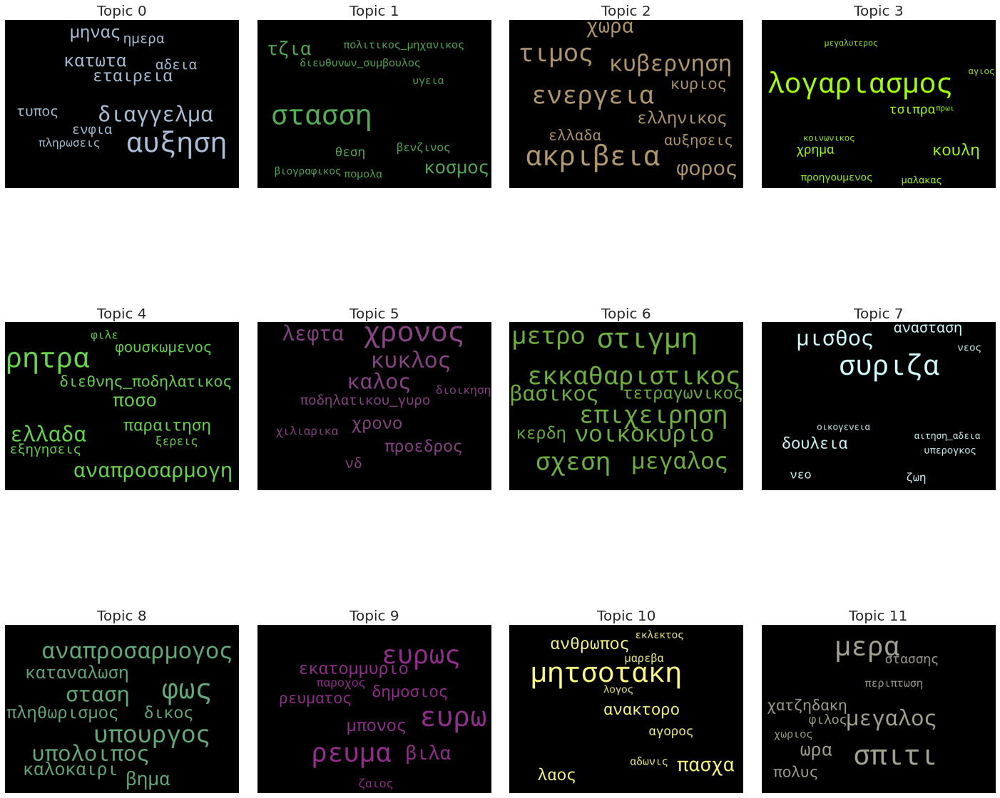

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stopwords.stopwords('el'),
                  background_color='black',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = model_lda_begin_10.show_topics(formatted=False, num_topics=40)

fig, axes = plt.subplots(3, 4, figsize=(20,20), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=20))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

## Step 4: Retrieve the top 10 words for each topic

In [ ]:
num_of_words_in_topc=12
topic_words=[]
for topic in range(num_of_words_in_topc):
  for row in range(10):
    topic_words.append(model_lda_begin_10.show_topic(topic, topn=10)[row][0])

In [ ]:
topics=[topic_words[:10], topic_words[10:20], topic_words[20:30], topic_words[30:40], topic_words[40:50],
        topic_words[50:60], topic_words[60:70], topic_words[70:80], topic_words[80:90], topic_words[90:100]]#,topic_words[100:110]]

## Step 5: For each topic calculate the centroid produced by the top 10 topic word. Pick the closest word to the centroid. This word become the representative of the topic.

In [ ]:
# word embedding space before event
model_before_event = gensim.models.Word2Vec(sentences=data_lemmatized_begin, window=4, min_count=2,  workers=4)
word_vectors_begin = model_before_event.wv
# word embedding space after event
model_after_event = gensim.models.Word2Vec(sentences=data_lemmatized_end, window=4, min_count=1, workers=4)
word_vectors_after = model_after_event.wv

In [ ]:
def centroid_calculation(topic_w):
  centroid_calc = np.average([word_vectors_begin[w] for w in  topic_w], axis=0)
  centroid = word_vectors_begin.similar_by_vector(centroid_calc)
  return centroid

In [ ]:
def centroid_calculation(topic_w):
  centroid_calc = np.average([word_vectors_after[w] for w in  topic_w], axis=0)
  centroid = word_vectors_after.similar_by_vector(centroid_calc)
  return centroid

In [ ]:
topic1_centroid = centroid_calculation(topic_words[:10])
topic2_centroid = centroid_calculation(topic_words[10:20])
topic3_centroid = centroid_calculation(topic_words[20:30])
topic4_centroid = centroid_calculation(topic_words[30:40])
topic5_centroid = centroid_calculation(topic_words[40:50])
topic6_centroid = centroid_calculation(topic_words[50:60])
topic7_centroid = centroid_calculation(topic_words[60:70])
topic8_centroid = centroid_calculation(topic_words[70:80])
topic9_centroid = centroid_calculation(topic_words[80:90])
topic10_centroid = centroid_calculation(topic_words[90:100])
topic11_centroid = centroid_calculation(topic_words[100:110])
topic12_centroid = centroid_calculation(topic_words[110:120])

In [ ]:
topic11_centroid

[('λογαριασμος', 0.9997696876525879),
 ('κυβερνηση', 0.999740719795227),
 ('χρονος', 0.9997372031211853),
 ('κοσμος', 0.9997293949127197),
 ('μισθος', 0.9997223019599915),
 ('μεγαλος', 0.9997033476829529),
 ('καλος', 0.9996991157531738),
 ('χωρα', 0.9996965527534485),
 ('συριζα', 0.9996883869171143),
 ('αυξηση', 0.9996735453605652)]

In [ ]:
most_similar_centroid_df = pd.DataFrame([topic1_centroid[0][0],topic2_centroid[0][0],topic3_centroid[0][0],topic4_centroid[0][0],topic5_centroid[0][0],topic6_centroid[0][0],topic7_centroid[0][0],topic8_centroid[0][0],topic9_centroid[0][0],topic10_centroid[0][0],topic11_centroid[0][0]
                                         , topic12_centroid[0][0]])
most_similar_centroid_df.rename(columns = {0 : 'centroid_word'}, inplace = True)
most_similar_centroid_df.drop_duplicates(ignore_index=True,inplace=True)

In [ ]:
most_similar_centroid_df

,centroid_word
0,χρονος
1,ενεργεια
2,μισθος
3,ρευμα
4,στασση
5,αυξηση


## EDA on word representatives sentiment for *baseline*

In [ ]:
df_hashtag_dei

,text,sentiment_polarity
9,#καλές_οι_120_δόσεις_αρκεί_να_βρεις_τα_χρήματα...,0
19,"Διελυσαν, ρημαξαν κ κομματιασαν τη ΔΕΗ για ν ...",-1
29,Μειώνεται το αφορολογητο με αποτέλεσμα αυξήσε...,-1
40,Τώρα στην #Βουλη σφυροκόπημα από @SFamellos σ...,-1
50,#ΕΠΙΧΕΙΡΗΣΕΙΣ Παγώνει η ΔΕΗ την επιβάρυνση κατ...,-1
...,...,...
1536725,Μήπως η εμφάνιση του είναι κόλπο της ΔΕΗ ώστε ...,0
1536762,ΔΕΗ: Αυξάνονται κατά ένα δισ. οι επενδύσεις (9...,1
1536767,Ρόδος – ΔΕΗ: Επιχειρηματίας κάνει απεργία πείν...,-1
1536775,🤣🤣🤣 Τα νούμερα οι ανιψιές μου εχουν βγει απο ...,0


In [ ]:
# clean text from punctuation
def sent_to_words(sentences):
  for sentence in sentences:
    yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words_hashtag= list(sent_to_words(df_hashtag_dei.text))

df_hashtag_dei['new_text'] = [" ".join(i) for i in data_words_hashtag]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_hashtag_dei


,text,sentiment_polarity,new_text
9,#καλές_οι_120_δόσεις_αρκεί_να_βρεις_τα_χρήματα...,0,καλες_οι_ δοσεις δεη δοσεις νερο ασφαλειες ενφ...
19,"Διελυσαν, ρημαξαν κ κομματιασαν τη ΔΕΗ για ν ...",-1,διελυσαν ρημαξαν κομματιασαν τη δεη για ταισου...
29,Μειώνεται το αφορολογητο με αποτέλεσμα αυξήσε...,-1,μειωνεται το αφορολογητο με αποτελεσμα αυξησει...
40,Τώρα στην #Βουλη σφυροκόπημα από @SFamellos σ...,-1,τωρα στην βουλη σφυροκοπημα απο sfamellos στον...
50,#ΕΠΙΧΕΙΡΗΣΕΙΣ Παγώνει η ΔΕΗ την επιβάρυνση κατ...,-1,επιχειρησεις παγωνει δεη την επιβαρυνση κατανα...
...,...,...,...
1536725,Μήπως η εμφάνιση του είναι κόλπο της ΔΕΗ ώστε ...,0,μηπως εμφανιση του ειναι κολπο της δεη ωστε να...
1536762,ΔΕΗ: Αυξάνονται κατά ένα δισ. οι επενδύσεις (9...,1,δεη αυξανονται κατα ενα δισ οι επενδυσεις δισ ...
1536767,Ρόδος – ΔΕΗ: Επιχειρηματίας κάνει απεργία πείν...,-1,ροδος δεη επιχειρηματιας κανει απεργια πεινας ...
1536775,🤣🤣🤣 Τα νούμερα οι ανιψιές μου εχουν βγει απο ...,0,τα νουμερα οι ανιψιες μου εχουν βγει απο τα πα...


In [ ]:
def extract_representatives_subset(dataframe, word_to_find):
  df_word_sentiment_exploration = dataframe.loc[dataframe.new_text.str.contains(word_to_find)]
  return df_word_sentiment_exploration

In [ ]:
def retrieve_representatives_sentiment(dataframe, word):
  average = extract_representatives_subset(dataframe, word)['sentiment_polarity'].mean()
  avg_sent = round(average,2)
  return avg_sent

In [ ]:
ayxisi_baseline = df_hashtag_dei.loc[df_hashtag_dei.new_text.str.contains('αυξ')& df_hashtag_dei.new_text.str.contains('εκπτωσ')& df_hashtag_dei.new_text.str.contains('επιβαρ')]

In [ ]:
kerdos_baseline = df_hashtag_dei.loc[df_hashtag_dei.new_text.str.contains('κερδος')& df_hashtag_dei.new_text.str.contains('χαμηλ')]# & df_hashtag_dei.new_text.str.contains('ηλεκτ')]

In [ ]:
kerdos_baseline

,text,sentiment_polarity,sentiment,date,query_name,new_text
77463,@DimKairidis: Επι #ΣΥΡΙΖΑ η ΔΕΗ πουλούσε κάτω ...,0,neutral,2022-04-20,ΔΕΗ,dimkairidis επι συριζα δεη πουλουσε κατω του κ...
1059046,"""Οι εταιρείες ενέργειας με πρωτοβουλία Σκρέκα...",0,neutral,2022-06-29,ΔΕΗ,οι εταιρειες ενεργειας με πρωτοβουλια σκρεκα μ...
1375002,"""Οι εταιρείες ενέργειας με πρωτοβουλία Σκρέκα,...",0,neutral,2022-06-29,ΔΕΗ,οι εταιρειες ενεργειας με πρωτοβουλια σκρεκα μ...


In [ ]:
kerdos_baseline


,text,sentiment_polarity,sentiment,date,query_name,new_text
279,600 εκατ. έχει χάσει η #ΔΕΗ πουλώντας ρεύμα σ...,-1,negative,2019-07-20,ΔΕΗ,εκατ εχει χασει δεη πουλωντας ρευμα στους αντα...
333,ΔΕΗ myHome Enter. Αποκτήστε το μέχρι και τις ...,-1,negative,2020-12-23,ΔΕΗ,δεη myhome enter αποκτηστε το μεχρι και τις κα...
19306,600 εκατ. έχει χάσει η #ΔΕΗ πουλώντας ρεύμα σ...,-1,negative,2019-07-19,ΔΕΗ,εκατ εχει χασει δεη πουλωντας ρευμα στους αντα...
21024,"Θέλεις τα μεγαλύτερα οφέλη, με τον πιο εύκολο ...",0,neutral,2021-06-11,ΔΕΗ,θελεις τα μεγαλυτερα οφελη με τον πιο ευκολο τ...
38555,600 εκατ. έχει χάσει η #ΔΕΗ πουλώντας ρεύμα σ...,-1,negative,2019-07-19,ΔΕΗ,εκατ εχει χασει δεη πουλωντας ρευμα στους αντα...
54881,"Οι 4 όμιλοι #ηλεκτροπαραγωγής, συν τη #ΔΕΗ που...",0,neutral,2022-04-09,ΔΕΗ,οι ομιλοι συν τη δεη που εντωμεταξυ επιδοθηκαν...
75789,Μπορεί να εξηγήσει καμιά νέο φιλελεύθερη μαϊμ...,-1,negative,2022-03-14,ΔΕΗ,μπορει να εξηγησει καμια νεο φιλελευθερη μαιμο...
77463,@DimKairidis: Επι #ΣΥΡΙΖΑ η ΔΕΗ πουλούσε κάτω ...,0,neutral,2022-04-20,ΔΕΗ,dimkairidis επι συριζα δεη πουλουσε κατω του κ...
80313,Το ελληνικό δημόσιο είναι το μόνο κερδισμένο α...,0,neutral,2021-10-07,ΔΕΗ,το ελληνικο δημοσιο ειναι το μονο κερδισμενο α...
118080,Το περιεχόμενο των φακέλων που έδωσε ο Μητσοτά...,0,neutral,2019-07-10,ΔΕΗ,το περιεχομενο των φακελων που εδωσε μητσοτακη...


In [ ]:
stirixi_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[0])
kausimo_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[1])
eulogia_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[2])
lianikos_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, 'λιανικ')
mme_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[4])
xamiloteros_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[5])
katanalwti_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[6])
misthou_sentiment = retrieve_representatives_sentiment(df_hashtag_dei, input_word[7])

In [ ]:
baseline_representatives_sentiment = pd.DataFrame({'baseline_representatives':[input_word[0], input_word[1], input_word[2], input_word[3], input_word[4], input_word[5], input_word[6], input_word[7]],
              'avg_sentiment':[stirixi_sentiment, kausimo_sentiment, eulogia_sentiment, lianikos_sentiment, mme_sentiment, xamiloteros_sentiment, katanalwti_sentiment, misthou_sentiment]})

In [ ]:
baseline_representatives_sentiment

,baseline_representatives,avg_sentiment
0,στηριξη,-0.32
1,καυσιμο,-0.60
2,ευλογια,-0.71
3,λιανικος,-0.53
4,μμε,-0.67
5,χαμηλοτερος,-0.33
6,καταναλωτη,-0.65
7,μισθου,-0.74


In [ ]:
def final_sent(avg_sentiment):
    if avg_sentiment <= -0.34:
        return -1
    else:
        return 0

baseline_representatives_sentiment['normalized_avg_sent'] = baseline_representatives_sentiment.avg_sentiment.apply(final_sent)

In [ ]:
baseline_representatives_sentiment

,baseline_representatives,avg_sentiment,normalized_avg_sent
0,στηριξη,-0.32,0
1,καυσιμο,-0.60,-1
2,ευλογια,-0.71,-1
3,λιανικος,-0.53,-1
4,μμε,-0.67,-1
5,χαμηλοτερος,-0.33,0
6,καταναλωτη,-0.65,-1
7,μισθου,-0.74,-1


In [ ]:
most_similar_centroid_df

,centroid_word
0,αυξηση
1,στασση
2,ρευμα
3,ενεργεια
4,χρονος
5,μισθος


# Step 6: Plot topic clusters within word embeddings with closest neighbours

## Thesis approach model topic represenatives analysis

In [ ]:
most_similar_centroid_df

,centroid_word
0,αυξηση
1,στασση
2,ρευμα
3,ενεργεια
4,χρονος
5,μισθος


In [ ]:
input_word = ['αυξηση', 'στασση', 'ρευμα', 'ενεργεια', 'χρονος', 'μισθος']
sentiment_color = ['grey','red','green']
color_list = ['brown','violet', 'seagreen', 'peru', 'orange', 'blue']
#representatives_text_size = [0.08, 0.2, 0.08, 0.06, 0.07]

def prepare_vis(giv_word, model):# model= word_vectors_begin
  def append_list(sim_words, words):
    list_of_words = []
    for i in range(len(sim_words)):
      sim_words_list = list(sim_words[i])
      sim_words_list.append(words)
      sim_words_tuple = tuple(sim_words_list)
      list_of_words.append(sim_words_tuple)
    return list_of_words


  user_input = [x.strip() for x in giv_word.split(',')]

  result_word = []

  for words in user_input:

    sim_words = model.most_similar(words, topn = 10)
    sim_words = append_list(sim_words, words)

  result_word.extend(sim_words)

  similar_word = [word[0] for word in result_word]
  similarity = [word[1] for word in result_word]
  similar_word.extend(user_input)
  labels = [word[2] for word in result_word]
  label_dict = dict([(y,x+1) for x,y in enumerate(set(labels))])
  color_map = [label_dict[x] for x in labels]

  def retrieve_representatives_nn(resulted_nn_words):#just for visualization to add "+" next to word-nearest neighbors
    before_list=[]
    for i in range(10):
      before_list.append(resulted_nn_words[i][0])
    return before_list
  bfre_list_nn_words = retrieve_representatives_nn(result_word)

  return(bfre_list_nn_words, user_input, result_word, similar_word, similarity, labels, label_dict, color_map)

In [ ]:
def display_tsne_scatterplot_2D(given_word,color,sent_color,how_much_sentiment, model, user_input=None, words=None, label=None, color_map=None, perplexity = 5, learning_rate = 0, iteration = 0, topn=10, sample=500):
#### change how_much_sentiment to sentiment_intensity
    if words == None:
        if sample > 0:
            words = np.random.choice(list(model.index_to_key()), sample)
        else:
            words = [ word for word in model.index_to_key ]

    word_vectors = np.array([model[w] for w in words])


    # For 2D, change the three_dim variable into something like two_dim like the following:
    two_dim = TSNE(n_components = 2, random_state=0, perplexity = perplexity, learning_rate = learning_rate, n_iter = iteration).fit_transform(word_vectors)[:,:2]

    data = []


    count = 0
    if (given_word == user_input[0] or given_word == user_input[1] or given_word == user_input[2] or given_word == user_input[3]
        or given_word == user_input[4] or given_word == user_input[5]):
      for i in range (len(user_input)):

                trace = go.Scatter(
                    x = two_dim[count:count+topn,0],
                    y = two_dim[count:count+topn,1],
                    text = words[count:count+topn],
                    name = user_input[i],
                    textposition = "top center",
                    textfont_size = 30,
                    mode = 'markers+text',
                    marker = {
                        'size': 10,
                        'opacity': 1,
                        'color': color
                    }

                )

                # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable. Also, instead of using
                # variable three_dim, use the variable that we have declared earlier (e.g two_dim)

                data.append(trace)
                count = count+topn

    trace_input = go.Scatter(
                    x = two_dim[count:,0],
                    y = two_dim[count:,1],
                    text = words[count:],
                    name = 'Topic Representative',
                    textposition = "bottom center",
                    textfont_size = 40,
                    mode = 'markers+text',
                    marker = {
                        'size': 30,
                        'opacity': how_much_sentiment,
                        'color': sent_color
                    }
                    )

    # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable.  Also, instead of using
    # variable three_dim, use the variable that we have declared earlier (e.g two_dim)
    data.append(trace_input)

# Configure the layout

    layout = go.Layout(
        margin = {'l': 0, 'r': 0, 'b': 0, 't': 0},
        showlegend=True,
        legend=dict(
        x=1,
        y=0.5,
        font=dict(
            family="Times New Roman",
            size=25,
            color="black"
        )),
        font = dict(
            family = "Times New Roman",
            size = 35, color="black"),
        autosize = False,
        width = 1300,
        height = 650
        )


    plot_figure = go.Figure(data = data, layout = layout)
    return plot_figure.show()

In [ ]:
before_list_representative1_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[0], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[0],color_list[0],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 7, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
before_list_representative2_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[1], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[1],color_list[1],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
before_list_representative3_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[2], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[2],color_list[2],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
before_list_representative4_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[3], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[3],color_list[3],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
before_list_representative5_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[4], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[4],color_list[4],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
before_list_representative6_nn, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[5], word_vectors_begin)
display_tsne_scatterplot_2D(input_word[5],color_list[5],sentiment_color[0],1,word_vectors_begin, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



## after event topic exploration

In [ ]:
def display_tsne_scatterplot_2D(given_word, old_list, color,sent_color,how_much_sentiment, model, user_input=None, words=None, label=None, color_map=None, perplexity = 5, learning_rate = 0, iteration = 0, topn=10, sample=500):

    if words == None:
        if sample > 0:
            words = np.random.choice(list(model.index_to_key()), sample)
        else:
            words = [ word for word in model.index_to_key ]

    word_vectors = np.array([model[w] for w in words])


    # For 2D, change the three_dim variable into something like two_dim like the following:
    two_dim = TSNE(n_components = 2, random_state=0, perplexity = perplexity, learning_rate = learning_rate, n_iter = iteration).fit_transform(word_vectors)[:,:2]

    data = []


    count = 0
    if (given_word == user_input[0] or given_word == user_input[1] or given_word == user_input[2] or given_word == user_input[3] or given_word == user_input[4]
        or given_word == user_input[5]):
      for i in range (len(user_input)):

                trace = go.Scatter(
                    x = two_dim[count:count+topn,0],
                    y = two_dim[count:count+topn,1],
                    text = [f"+{i}" if i not in old_list else i for i in words[count:count+topn]],
                    name = user_input[i],
                    textposition = "top center",
                    textfont_size = 30,
                    mode = 'markers+text',
                    marker = {
                        'size': 10,
                        'opacity': 1,
                        'color': color
                    }

                )

                # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable. Also, instead of using
                # variable three_dim, use the variable that we have declared earlier (e.g two_dim)

                data.append(trace)
                count = count+topn

    trace_input = go.Scatter(
                    x = two_dim[count:,0],
                    y = two_dim[count:,1],
                    text = words[count:],
                    name = 'Topic Representative',
                    textposition = "middle right",
                    textfont_size = 40,
                    mode = 'markers+text',
                    marker = {
                        'size': 30,
                        'opacity': how_much_sentiment,
                        'color': sent_color
                    }
                    )

    # For 2D, instead of using go.Scatter3d, we need to use go.Scatter and delete the z variable.  Also, instead of using
    # variable three_dim, use the variable that we have declared earlier (e.g two_dim)
    data.append(trace_input)

# Configure the layout

    layout = go.Layout(
        margin = {'l': 0, 'r': 0, 'b': 0, 't': 0},
        showlegend=True,
        legend=dict(
        x=1,
        y=0.5,
        font=dict(
            family="Times New Roman",
            size=25,
            color="black"
        )),
        font = dict(
            family = "Times New Roman",
            size = 35, color="black"),
        autosize = False,
        width = 1300,
        height = 650
        )


    plot_figure = go.Figure(data = data, layout = layout)
    return plot_figure.show()

In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[0], word_vectors_after)
display_tsne_scatterplot_2D(input_word[0], before_list_representative1_nn, color_list[0],sentiment_color[1],0.74,word_vectors_after, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[1], word_vectors_after)
display_tsne_scatterplot_2D(input_word[1], before_list_representative2_nn, color_list[1],sentiment_color[1],0.73,word_vectors_after, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[2], word_vectors_after)
display_tsne_scatterplot_2D(input_word[2], before_list_representative3_nn, color_list[2],sentiment_color[1],0.78,word_vectors_after, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[3], word_vectors_after)
display_tsne_scatterplot_2D(input_word[3], before_list_representative4_nn, color_list[3],sentiment_color[1],0.67,word_vectors_after, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[4], word_vectors_after)
display_tsne_scatterplot_2D(input_word[4], before_list_representative5_nn, color_list[4],sentiment_color[1],0.72,word_vectors_after, user_input, similar_word, labels, color_map, 10, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [ ]:
_, user_input, result_word, similar_word, similarity, labels, label_dict, color_map = prepare_vis(input_word[5], word_vectors_after)
display_tsne_scatterplot_2D(input_word[5], before_list_representative6_nn, color_list[5],sentiment_color[1],0.81,word_vectors_after, user_input, similar_word, labels, color_map, 8, 500, 10000)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



## EDA on word representatives sentiment for the dates of interest

In [ ]:
df_text_dei = df_dei.drop_duplicates(subset=['text','date'])
df_text_dei_brand = df_text_dei[df_text_dei.query_name == df_text_dei.query_name.value_counts().index[0]]

In [ ]:
# clean text from punctuation
def sent_to_words(sentences):
  for sentence in sentences:
    yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(df_text_dei_brand.text))

df_text_dei_brand['new_text'] = [" ".join(i) for i in data_words]

<ipython-input-43-accab1ad4b0f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text_dei_brand['new_text'] = [" ".join(i) for i in data_words]


In [ ]:
def extract_representatives_subset(before_event, word_to_find):
  if before_event == True:
    df_word_sentiment_exploration = df_text_dei_brand[((df_text_dei_brand['date'] >= pd.to_datetime('2022-04-19').date()) & (df_text_dei_brand['date'] < pd.to_datetime('2022-04-26').date()))]
    df_word_sentiment_exploration = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains(word_to_find)]
  else:
    df_word_sentiment_exploration = df_text_dei_brand[((df_text_dei_brand['date'] >= pd.to_datetime('2022-04-26').date()) & (df_text_dei_brand['date'] < pd.to_datetime('2022-05-02').date()))]
    df_word_sentiment_exploration = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains(word_to_find)]
  return df_word_sentiment_exploration

In [ ]:
def retrieve_representatives_sentiment(word):
  average_per_day_before = extract_representatives_subset(True, word).sort_values('date').groupby('date')['sentiment_polarity'].mean()
  average_per_day_after = extract_representatives_subset(False, word).sort_values('date').groupby('date')['sentiment_polarity'].mean()
  def avg_per_week(avg_p_d):
    count = 0
    for i, x in enumerate(avg_p_d):
      count+=x
    return(count/7)
  before_avg_sent = round(avg_per_week(average_per_day_before),2)
  after_avg_sent = round(avg_per_week(average_per_day_after),2)
  return(before_avg_sent, after_avg_sent)

In [ ]:
auxisi_before, auxisi_after = retrieve_representatives_sentiment('αυξ')
logariasmos_before, logariasmos_after = retrieve_representatives_sentiment('λογαρ')


In [ ]:
print(auxisi_before, auxisi_after)
print(logariasmos_before, logariasmos_after)


-0.02 -0.74
-0.0 -0.82


In [ ]:
auxisi_before, auxisi_after = retrieve_representatives_sentiment('αυξ')
stassi_before, stassi_after = retrieve_representatives_sentiment('στασσ')
reuma_before, reuma_after = retrieve_representatives_sentiment('ρευμ')
energeia_before, energeia_after = retrieve_representatives_sentiment('ενεργ')
xronos_before, xronos_after = retrieve_representatives_sentiment('χρον')
misthos_before, misthos_after = retrieve_representatives_sentiment('μισθ')


In [ ]:
print(auxisi_before, auxisi_after)
print(stassi_before, stassi_after)
print(reuma_before, reuma_after)
print(energeia_before, energeia_after)
print(xronos_before, xronos_after)
print(misthos_before, misthos_after)



-0.02 -0.74
-0.02 -0.73
-0.01 -0.78
0.0 -0.67
-0.01 -0.72
-0.07 -0.81


In [ ]:
df_word_sentiment_exploration = df_text_dei_brand[((df_text_dei_brand['date'] >= pd.to_datetime('2022-04-19').date()) & (df_text_dei_brand['date'] < pd.to_datetime('2022-04-26').date()))]
df_word_sentiment_exploration_after = df_text_dei_brand[((df_text_dei_brand['date'] >= pd.to_datetime('2022-04-26').date()) & (df_text_dei_brand['date'] < pd.to_datetime('2022-05-02').date()))]
#before
df_word_sentiment_exploration_auxisi = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('αυξ')]

df_word_sentiment_exploration_Stassis = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('στασσ')]
#df_word_sentiment_exploration_logariasmos = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('λογαρ')]
df_word_sentiment_exploration_reuma = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('ρευμ')]

df_word_sentiment_exploration_energeia = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('ενεργ')]
df_word_sentiment_exploration_xronos = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('χρον')]
df_word_sentiment_exploration_misthos = df_word_sentiment_exploration.loc[df_word_sentiment_exploration.new_text.str.contains('μισθο')]
#after
#df_word_sentiment_exploration_logariasmos_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('λογαρ')]
df_word_sentiment_exploration_auxisi_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('αυξ')]
df_word_sentiment_exploration_Stassis_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('στασσ')]
df_word_sentiment_exploration_reuma_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('ρευμ')]
df_word_sentiment_exploration_energeia_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('ενεργ')]
df_word_sentiment_exploration_xronos_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('χρον')]
df_word_sentiment_exploration_misthos_after = df_word_sentiment_exploration_after.loc[df_word_sentiment_exploration_after.new_text.str.contains('μισθο')]


In [ ]:
auxisi_size_before = len(df_word_sentiment_exploration_auxisi)
auxisi_size_after = len(df_word_sentiment_exploration_Stassis)

stassis_size_before =len(df_word_sentiment_exploration_Stassis)
stassis_size_after =len(df_word_sentiment_exploration_Stassis_after)

reuma_size_before =len(df_word_sentiment_exploration_reuma)
reuma_size_after =len(df_word_sentiment_exploration_reuma_after)

energeia_size_before =  len(df_word_sentiment_exploration_auxisi_after)
energeia_size_after = len(df_word_sentiment_exploration_energeia_after)

# logariasmos_size_before =len(df_word_sentiment_exploration_logariasmos)
# logariasmos_size_after =len(df_word_sentiment_exploration_logariasmos_after)


xronos_size_before = len(df_word_sentiment_exploration_xronos)
xronos_size_after = len(df_word_sentiment_exploration_xronos_after)

misthos_size_before = len(df_word_sentiment_exploration_misthos)
misthos_size_after = len(df_word_sentiment_exploration_misthos_after)


In [ ]:
print(f"stassis text size before and after :{stassis_size_before, stassis_size_after}")
#print(f"logariasmos text size before and after:{logariasmos_size_before ,logariasmos_size_after}")
print(f"auxisi text size before and after:{auxisi_size_before, auxisi_size_after}")
print(f"energeia text size before and after:{energeia_size_before, energeia_size_after}")
print(f"xronos text size before and after:{xronos_size_before, xronos_size_after}")
print(f"xronos text size before and after:{reuma_size_before, reuma_size_after}")
print(f"xronos text size before and after:{misthos_size_before, misthos_size_after}")

stassis text size before and after :(477, 690)
auxisi text size before and after:(466, 477)
energeia text size before and after:(357, 379)
xronos text size before and after:(393, 414)
xronos text size before and after:(393, 393)
xronos text size before and after:(486, 486)


In [ ]:
df_word_sentiment_exploration_auxisi.loc[df_word_sentiment_exploration_auxisi.new_text.str.contains('χρονος')| df_word_sentiment_exploration_auxisi.new_text.str.contains('κυβερν')].head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
56562,Ο καπιταλισμός και τα χαΐρια του. Ο σύγχρονος ...,NaN,neutral,ΔΕΗ,twitter,2022-04-21 06:58:31,0,2022-04-21,Electrical_Energy,καπιταλισμος και τα χαιρια του συγχρονος σταυρ...
65490,Ο καπιταλισμός και τα χαΐρια του. Ο σύγχρονος...,NaN,neutral,ΔΕΗ,twitter,2022-04-21 07:23:54,0,2022-04-21,Electrical_Energy,καπιταλισμος και τα χαιρια του συγχρονος σταυρ...
83119,Αναρωτιόμαστε αν θα ζηλεύουν την τρομερή αύξη...,Άλλοι λογαριασμοί,neutral,ΔΕΗ,twitter,2022-04-20 20:50:48,0,2022-04-20,Electrical_Energy,αναρωτιομαστε αν θα ζηλευουν την τρομερη αυξησ...
127354,@Marka2_ Για τους έξυπνους που κάνουν συγκρίσε...,Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,2022-04-20 19:12:13,0,2022-04-20,Electrical_Energy,marka για τους εξυπνους που κανουν συγκρισεις ...
414291,"Και εδώ θα κλείσω, με ένα σχόλιο από το the F...",Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,2022-04-20 18:38:57,0,2022-04-20,Electrical_Energy,και εδω θα κλεισω με ενα σχολιο απο το the faq...


In [ ]:
df_word_sentiment_exploration_auxisi_after.loc[df_word_sentiment_exploration_auxisi_after.new_text.str.contains('χρονος')| df_word_sentiment_exploration_auxisi_after.new_text.str.contains('λεφτ')].head(20)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
163290,@GiKostas @OmadaMnimis @koulnek Φασίστες είναι...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2022-04-27 17:25:41,-1,2022-04-27,Electrical_Energy,gikostas omadamnimis koulnek φασιστες ειναι αυ...
286879,@katerinaakribou Τα δουλεύει ?? Με ποιο κριτήρ...,NaN,negative,ΔΕΗ,twitter,2022-04-28 12:01:55,-1,2022-04-28,Electrical_Energy,katerinaakribou τα δουλευει με ποιο κριτηριο α...
431017,Μαριάννα Τουμασάτου: “Τους συμφέρει να ασχολο...,Αυξήσεις / Αύξηση ΦΠΑ,negative,ΔΕΗ,twitter,2022-04-30 08:13:20,-1,2022-04-30,Electrical_Energy,μαριαννα τουμασατου τους συμφερει να ασχολουμα...
503847,@EmyAimilia @kefalas77 @Athi_0907 μα τους υπε...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2022-04-29 05:59:18,-1,2022-04-29,Electrical_Energy,emyaimilia kefalas athi_ μα τους υπερφορολογησ...
515475,Ο πρόεδρος της ΔΕΗ με λεφτά της επιχείρησης κά...,Χρηματιστηριακά,negative,ΔΕΗ,twitter,2022-04-29 15:21:53,-1,2022-04-29,Electrical_Energy,προεδρος της δεη με λεφτα της επιχειρησης κανε...
557011,"@ChrisDarko39 Ναι, βέβαια, δεν θα ξεχάσω, 3 χρ...",Ατυχήματα,negative,ΔΕΗ,twitter,2022-04-28 11:54:00,-1,2022-04-28,Electrical_Energy,chrisdarko ναι βεβαια δεν θα ξεχασω χρονια τωρ...
669889,@nkaragiannakidi Ο Τσιπρας ακομα: Εβαλε ενοικι...,Άλλοι λογαριασμοί,negative,ΔΕΗ,twitter,2022-04-30 12:39:06,-1,2022-04-30,Electrical_Energy,nkaragiannakidi τσιπρας ακομα εβαλε ενοικιο στ...
889532,@EmyAimilia @kefalas77 @Athi_0907 μα τους υπερ...,Άλλοι λογαριασμοί,negative,ΔΕΗ,twitter,2022-04-29 05:57:34,-1,2022-04-29,Electrical_Energy,emyaimilia kefalas athi_ μα τους υπερφορολογησ...
1274412,Ο πρόεδρος της ΔΕΗ με λεφτά της επιχείρησης κ...,Χρηματιστηριακά,negative,ΔΕΗ,twitter,2022-04-29 15:22:49,-1,2022-04-29,Electrical_Energy,προεδρος της δεη με λεφτα της επιχειρησης κανε...
1378948,Μαριάννα Τουμασάτου: “Τους συμφέρει να ασχολού...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2022-04-29 20:55:14,-1,2022-04-29,Electrical_Energy,μαριαννα τουμασατου τους συμφερει να ασχολουμα...


In [ ]:
df_word_sentiment_exploration_Stassis.loc[df_word_sentiment_exploration_Stassis.new_text.str.contains('μεγαλο')| df_word_sentiment_exploration_Stassis.new_text.str.contains('μηνα')].head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
57363,@venetia_Ap ●Αγορά οικοπέδου 2018 (ΣΥΡΙΖΑ) ●Α...,ΣΥΡΙΖΑ,neutral,ΔΕΗ,twitter,2022-04-23 11:45:34,0,2022-04-23,Electrical_Energy,venetia_ap αγορα οικοπεδου συριζα αιτηση αδεια...
60749,"Να υπενθυμίσω ότι το golden boy της ΝΔ, Γιώργ...",Εξυγείανση/Πώληση,neutral,ΔΕΗ,twitter,2022-04-20 17:54:56,0,2022-04-20,Electrical_Energy,να υπενθυμισω οτι το golden boy της νδ γιωργος...
72563,●Αγορά οικοπέδου 2018 (ΣΥΡΙΖΑ) ●Αίτηση άδειας...,ΣΥΡΙΖΑ,neutral,ΔΕΗ,twitter,2022-04-22 19:57:36,0,2022-04-22,Electrical_Energy,αγορα οικοπεδου συριζα αιτηση αδειας τον μαιο ...
74451,"Να υπενθυμίσω ότι το golden boy της ΝΔ, Γιώργ...",Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,2022-04-21 17:03:25,0,2022-04-21,Electrical_Energy,να υπενθυμισω οτι το golden boy της νδ γιωργος...
79387,"Αποφοιτείτε από το ελληνικό πανεπιστήμιο, δου...",NaN,neutral,ΔΕΗ,twitter,2022-04-21 22:14:05,0,2022-04-21,Electrical_Energy,αποφοιτειτε απο το ελληνικο πανεπιστημιο δουλε...


In [ ]:
df_word_sentiment_exploration_Stassis_after.loc[df_word_sentiment_exploration_Stassis_after.new_text.str.contains('εκατ')& df_word_sentiment_exploration_Stassis_after.new_text.str.contains('τζ')].head(15).head(5)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
53435,Κάποιος να τον μαζέψει Αν δεν μπορεί ο κολλη...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-29 15:06:46,-1,2022-04-29,Electrical_Energy,καποιος να τον μαζεψει αν δεν μπορει κολλητος ...
57137,Χατζηδάκης: Με σταματούν στο δρόμο και μου λέ...,Λογαριασμοί (γενικό),negative,ΔΕΗ,twitter,2022-04-30 22:40:42,-1,2022-04-30,Electrical_Energy,χατζηδακης με σταματουν στο δρομο και μου λενε...
61008,Κάποιος να τον μαζέψει Αν δεν μπορεί ο κολλη...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-30 07:24:18,-1,2022-04-30,Electrical_Energy,καποιος να τον μαζεψει αν δεν μπορει κολλητος ...
130082,Δεν έχουν τέλος οι αποκαλύψεις για το golden ...,Εταιρικά νέα,negative,ΔΕΗ,twitter,2022-04-30 11:03:49,-1,2022-04-30,Electrical_Energy,δεν εχουν τελος οι αποκαλυψεις για το golden b...
347229,Δεν έχει τέλος το μεγάλο φαγοπότι στη ΔΕΗ καθ...,Εταιρικά νέα,negative,ΔΕΗ,twitter,2022-04-29 19:04:28,-1,2022-04-29,Electrical_Energy,δεν εχει τελος το μεγαλο φαγοποτι στη δεη καθω...


In [ ]:
df_word_sentiment_exploration_logariasmos_after[df_word_sentiment_exploration_logariasmos_after.tag=='ΣΥΡΙΖΑ'].head(2)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
60086,@myrtozax Αριστερή μιζέρια οι λογαριασμοί της ...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-04-29 10:07:00,-1,2022-04-29,DEI_dataset,myrtozax αριστερη μιζερια οι λογαριασμοι της δεη
60574,Θέλεις ν’αγιάσεις αλλά δεν σ’αφήνουν οι πολιτ...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-04-30 08:31:08,-1,2022-04-30,DEI_dataset,θελεις αγιασεις αλλα δεν αφηνουν οι πολιτικες ...


In [ ]:
df_word_sentiment_exploration_auxisi_after[df_word_sentiment_exploration_auxisi_after.tag=='ΣΥΡΙΖΑ'].head(5)


,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
49435,Το χρηματιστήριο ενέργειας και η ρήτρα αναπρο...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-05-01 06:50:44,-1,2022-05-01,DEI_dataset,το χρηματιστηριο ενεργειας και ρητρα αναπροσαρ...
57992,@VasilisChalk @merilin81450371 Το 2913 νόμος τ...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-05-01 17:14:11,-1,2022-05-01,DEI_dataset,vasilischalk merilin το νομος του κρατους ρητρ...
83852,Θα πάει ο Μητσοτάκης να μιλήσει στο Κογκρέσο....,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-04-29 06:10:49,-1,2022-04-29,DEI_dataset,θα παει μητσοτακης να μιλησει στο κογκρεσο εχε...
100811,@VasilisChalk @merilin81450371 Το 2913 νόμος ...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-05-01 18:50:55,-1,2022-05-01,DEI_dataset,vasilischalk merilin το νομος του κρατους ρητρ...
185212,Το χρηματιστήριο ενέργειας και η ρήτρα αναπρο...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-04-30 22:34:01,-1,2022-04-30,DEI_dataset,το χρηματιστηριο ενεργειας και ρητρα αναπροσαρ...


In [ ]:
df_word_sentiment_exploration_misthos_after[df_word_sentiment_exploration_misthos_after.sentiment=='negative'].loc[df_word_sentiment_exploration_misthos_after.new_text.str.contains('συρ')& df_word_sentiment_exploration_misthos_after.new_text.str.contains('ακρ')].head(15)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
587729,@malena_kll Ο μισθός του τσεο της ΔΕΗ κατά ΣΥ...,ΣΥΡΙΖΑ,negative,ΔΕΗ,twitter,2022-05-01 13:30:02,-1,2022-05-01,DEI_dataset,malena_kll μισθος του τσεο της δεη κατα συριζα...


In [ ]:
df_word_sentiment_exploration_reuma[df_word_sentiment_exploration_reuma.tag=='Εταιρικά νέα'].head(20)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
59935,Τη στιγμή που ο κόσμος στενάζει με τους λογαρ...,Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-23 16:27:04,0,2022-04-23,DEI_dataset,τη στιγμη που κοσμος στεναζει με τους λογαριασ...
61215,Χρειάζεται κάποια βίλα για να γίνει φύλλο και...,Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-25 12:43:20,0,2022-04-25,DEI_dataset,χρειαζεται καποια βιλα για να γινει φυλλο και ...
63676,#καταπληκτικη_ποιοτητα_ζωης είναι να φοβάσαι ...,Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-25 05:51:03,0,2022-04-25,DEI_dataset,ειναι να φοβασαι να μην σου κοψουν το ρευμα εν...
498515,"@Stinger_gr @Johnnyhoston_2 @Loukas_7 Ναι, για...",Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-20 19:57:35,0,2022-04-20,DEI_dataset,stinger_gr johnnyhoston_ loukas_ ναι γιατι δεη...
665083,Ο κόσμος παραμιλάει με τις χρεώσεις του ρεύμ...,Εταιρικά νέα,negative,ΔΕΗ,twitter,2022-04-23 12:22:36,-1,2022-04-23,DEI_dataset,κοσμος παραμιλαει με τις χρεωσεις του ρευματος...
665191,"Επειδή ο διευθύνων σύμβουλος της ΔΕΗ, με μισθ...",Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-23 12:35:55,0,2022-04-23,DEI_dataset,επειδη διευθυνων συμβουλος της δεη με μισθο ψω...
787082,"@Stinger_gr @Johnnyhoston_2 @Loukas_7 Ναι, για...",Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-20 19:57:18,0,2022-04-20,DEI_dataset,stinger_gr johnnyhoston_ loukas_ ναι γιατι δεη...
864115,«Χρυσός» μισθός για τον διευθύνοντα σύμβουλο τ...,Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-21 19:26:11,0,2022-04-21,DEI_dataset,χρυσος μισθος για τον διευθυνοντα συμβουλο της...
1096592,"Δείτε το Φαραωνικό εξοχικό των 759 τ.μ, που χτ...",Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-23 18:21:37,0,2022-04-23,DEI_dataset,δειτε το φαραωνικο εξοχικο των που χτιζει γιωρ...
1129062,I've just posted a new blog: Ο κόσμος υποφέρει...,Εταιρικά νέα,neutral,ΔΕΗ,twitter,2022-04-22 19:07:14,0,2022-04-22,DEI_dataset,ve just posted new blog κοσμος υποφερει για να...


In [ ]:
df_word_sentiment_exploration_reuma_after[df_word_sentiment_exploration_reuma_after.tag=='Νέα Δημοκρατία'].head(20)

,text,tag,sentiment,query_name,channel,createdate,sentiment_polarity,date,dataset,new_text
49289,ΕΝΩ Ο ΛΑΟΣ ΠΕΙΝΑΕΙ ΣΤΗ ΔΕΗ ΠΕΦΤΕΙ ΤΟ ΦΑΓΟΠΟΤΙ ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-28 10:28:18,-1,2022-04-28,DEI_dataset,ενω λαος πειναει στη δεη πεφτει το φαγοποτι το...
49731,Πρεπει να ξεκινήσει κίνημα δεν πληρώνω την #Δ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-29 05:10:01,-1,2022-04-29,DEI_dataset,πρεπει να ξεκινησει κινημα δεν πληρωνω την δεη...
49936,Τη μια μέρα η βουλευτής της ΝΔ Α.Καραμανλή λέ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-28 09:45:41,-1,2022-04-28,DEI_dataset,τη μια μερα βουλευτης της νδ καραμανλη λεει γι...
52333,Με εντολή Μητσοτάκη ακρίβυνε το ρεύμα 2019: Έ...,Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,2022-04-29 19:07:34,0,2022-04-29,DEI_dataset,με εντολη μητσοτακη ακριβυνε το ρευμα εδωσε αδ...
52696,Καλημέρα στην εργατική τάξη! Απόλυτη η κυβερ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-27 06:32:56,-1,2022-04-27,DEI_dataset,καλημερα στην εργατικη ταξη απολυτη κυβερνητικ...
52938,"26,500 εντολές διακοπής ρεύματος μόνο για τον...",Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-28 15:36:20,-1,2022-04-28,DEI_dataset,εντολες διακοπης ρευματος μονο για τον απριλη ...
53178,Μία πολίτης βγαίνει και λέει ότι δεν θα φάει ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-30 18:09:25,-1,2022-04-30,DEI_dataset,μια πολιτης βγαινει και λεει οτι δεν θα φαει ω...
53457,«Διακοπές ρεύματος πάντοτε γινόντουσαν και στ...,Νέα Δημοκρατία,neutral,ΔΕΗ,twitter,2022-04-28 14:17:09,0,2022-04-28,DEI_dataset,διακοπες ρευματος παντοτε γινοντουσαν και στο ...
53673,Πολλά νεύρα στη ΝΔ με την είδηση ότι ο εκλεκτ...,Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-26 08:07:10,-1,2022-04-26,DEI_dataset,πολλα νευρα στη νδ με την ειδηση οτι εκλεκτος ...
54660,"Αυξήσανε τρόφιμα, καύσιμα και ΔΕΗ με το έτσι ...",Νέα Δημοκρατία,negative,ΔΕΗ,twitter,2022-04-28 18:33:39,-1,2022-04-28,DEI_dataset,αυξησανε τροφιμα καυσιμα και δεη με το ετσι θε...
